In [1]:
import jax
import jax.nn as jnn
import jax.numpy as jnp
import numpy as np

import equinox as eqx
import diffrax
import optax

In [2]:
import os
os.chdir("..")
from policy.policy_training import DPCTrainer
from exciting_environments.pmsm.pmsm_env import PMSM
from policy.networks import MLP#,MLP2

2024-11-27 12:16:05.618771: W external/xla/xla/service/gpu/nvptx_compiler.cc:760] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.6.77). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.


In [3]:
gpus = jax.devices()
jax.config.update("jax_default_device", gpus[0])

In [4]:
motor_env = PMSM(
    saturated=True,
    LUT_motor_name="BRUSA",
    batch_size=1,
    control_state=[], 
    static_params = {
            "p": 3,
            "r_s": 15e-3,
            "l_d": 0.37e-3,
            "l_q": 1.2e-3,
            "psi_p": 65.6e-3,
            "deadtime": 0,
    })

In [5]:
@eqx.filter_jit
def reset_env(env,rng):
    obs, _ = env.reset(env.env_properties, rng)  #
    obs = obs.at[2].set((3*1500 / 60 * 2 * jnp.pi) / (2 * jnp.pi * 3 * 11000 / 60))
    return obs

In [6]:
@eqx.filter_jit
def motor_env_dat_gen_sin(env,reset_env, rng, traj_len):
    rng, subkey = jax.random.split(rng)
    ref_obs = reset_env(env,subkey) 
    rng, subkey = jax.random.split(rng)
    init_obs = reset_env(env,subkey)  
    return init_obs, ref_obs, rng

In [7]:
@eqx.filter_jit
def featurize(obs,ref_obs, featurize_state=jnp.array([0,0])):
    feat_obs=jnp.concatenate([obs[0:2],ref_obs[0:2],ref_obs[0:2]-obs[0:2],featurize_state])#jnp.concatenate([obs[0:2],obs[6:8],ref_obs[0:2],ref_obs[0:2]-obs[0:2],featurize_state])
    featurize_state=jnp.clip(featurize_state + ref_obs[0:2]-obs[0:2],min=-1,max=1) * (jnp.sign(0.01-jnp.sum((ref_obs[0:2]-obs[0:2])**2))*0.5+0.5)
    return feat_obs,featurize_state

In [8]:
@eqx.filter_jit
def mse_loss(feat_obs):
    loss=jnp.mean(jnp.sum((feat_obs[:,4:6])**2,axis=1))#be aware of idx if changing featurize
    return loss

In [9]:
@eqx.filter_jit
def penalty_loss(feat_obs):
    loss=jnp.array([0])
    return loss

In [10]:
jax_key = jax.random.PRNGKey(2)
policy=MLP([8,64,64,64,2],key=jax_key)
optimizer = optax.adam(5e-4)
opt_state = optimizer.init(policy)

In [11]:
data_batch_size=100
trainer=DPCTrainer(
    batch_size=data_batch_size,
    train_steps=1000,
    horizon_length=50,
    reset_env=reset_env,
    data_gen_sin=motor_env_dat_gen_sin,
    featurize=featurize,
    policy_optimizer=optimizer,
    ref_loss=mse_loss,
    constr_penalty=penalty_loss,
    ref_loss_weight=1)
keys=jax.vmap(jax.random.PRNGKey)(np.random.randint(0, 2**31, size=(data_batch_size,)))
#key=jax.vmap(jax.random.PRNGKey)(jnp.linspace(0,1000,1001).astype(int))

In [12]:
import matplotlib.pyplot as plt
from utils.evaluation import steps_eval

100%|██████████| 1000/1000 [01:06<00:00, 14.99it/s]


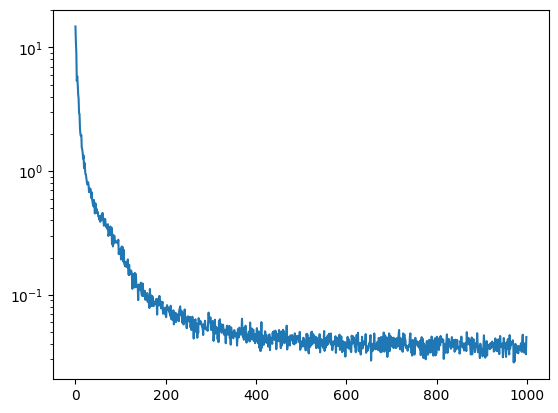

In [13]:
fin_policy2,fin_opt_state2,fin_keys2,losses2=trainer.fit_non_jit(policy,motor_env,keys,opt_state)
plt.plot(losses2)
plt.yscale('log')

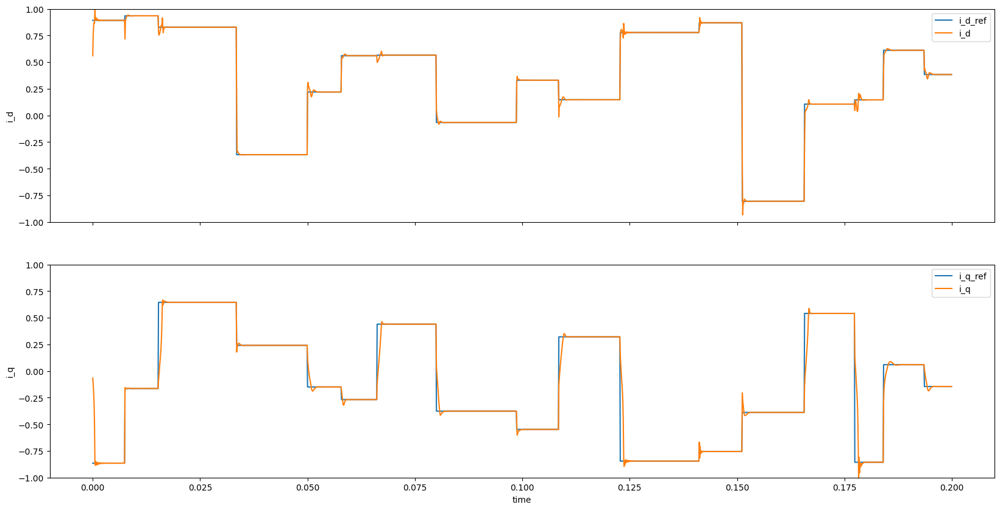

In [14]:
obs,obs2,acts=steps_eval(motor_env,reset_env,fin_policy2,featurize,jax.random.PRNGKey(765),2000)

## Model Learning

In [15]:
from utils.interactions import rollout_traj_env_policy
from models.model_training import ModelTrainer
from models.models import NeuralEulerODE

In [16]:
@eqx.filter_jit
def reset_env(env,rng):
    obs, _ = env.reset(env.env_properties, rng)  #
    obs = obs.at[2].set((3*1500 / 60 * 2 * jnp.pi) / (2 * jnp.pi * 3 * 11000 / 60))
    return obs

In [17]:
def featurize_node(obs):
    return obs[:2]

In [18]:
from utils.signals import steps_ref_traj

In [19]:
rng=jax.random.PRNGKey(24)
ref_len=20000
rng, subkey = jax.random.split(rng)
obs_ref = steps_ref_traj(motor_env, reset_env, subkey, ref_len, step_lens=[20,100])
rng, subkey = jax.random.split(rng)
init_obs= reset_env(motor_env,subkey)
long_obs, long_acts = rollout_traj_env_policy(fin_policy2, init_obs, obs_ref, ref_len, motor_env, featurize)

In [20]:
def data_gen_single(rng, sequence_len):
    rng, subkey = jax.random.split(rng)
    idx = jax.random.randint(subkey, shape=(1,),minval=0, maxval=(long_obs.shape[0]-sequence_len-1))

    slice = jnp.linspace(
            start=idx, stop=idx + sequence_len, num=sequence_len+1, dtype=int
        ).T
    act_slice = jnp.linspace(
            start=idx, stop=idx + sequence_len-1, num=sequence_len, dtype=int
        ).T
    
    obs=long_obs[slice][0]
    acts=long_acts[act_slice][0]
    return obs,acts,rng

In [21]:
rng=jax.random.PRNGKey(245)
ref_len=400
rng, subkey = jax.random.split(rng)
obs_ref_val = steps_ref_traj(motor_env, reset_env, subkey, ref_len, step_lens=[20,50])
rng, subkey = jax.random.split(rng)
init_obs_val = reset_env(motor_env,subkey)
obs_val, acts_val = rollout_traj_env_policy(fin_policy2, init_obs_val, obs_ref_val, ref_len, motor_env, featurize)
@eqx.filter_jit
def val_data_gen_single(rng, sequence_len):
    obs=obs_val
    acts=acts_val
    return obs,acts,rng

In [22]:
jax_key = jax.random.PRNGKey(4)
node=NeuralEulerODE([4,128,128,128,128,2],key=jax_key)
optimizer_node = optax.adam(1e-4)
opt_state = optimizer_node.init(node)

In [23]:
batch_size=100
mtrainer=ModelTrainer(
    train_steps=100_000,
    batch_size=batch_size,
    sequence_len=50,
    featurize=featurize_node,
    train_data_gen_sin=data_gen_single,
    val_data_gen_sin= val_data_gen_single,
    model_optimizer=optimizer_node,
    tau= motor_env.tau
    )
keys=jax.vmap(jax.random.PRNGKey)(np.random.randint(0, 2**31, size=(batch_size,)))

  0%|          | 0/100000 [00:00<?, ?it/s]

/home/olivers/.conda/envs/venv_proj/lib/python3.11/site-packages/jax/_src/numpy/lax_numpy.py:3042: UserWarning: Explicitly requested dtype float64 requested in asarray is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  start = asarray(start, dtype=computation_dtype)
/home/olivers/.conda/envs/venv_proj/lib/python3.11/site-packages/jax/_src/numpy/lax_numpy.py:3043: UserWarning: Explicitly requested dtype float64 requested in asarray is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  stop = asarray(stop, dtype=computation_dtype)
/home/olivers/.conda/envs/venv_proj/lib/python3.11/site-packages/jax/_src/numpy/array_methods.py

Current val_loss: 0.096004464


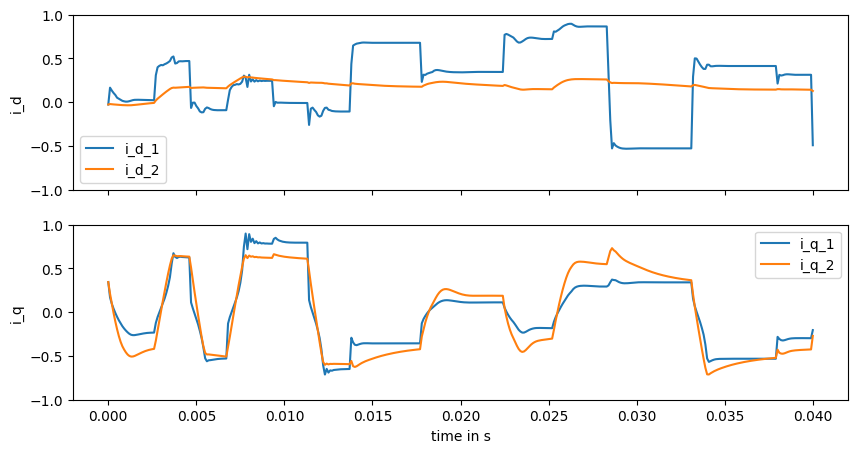

  4%|▍         | 3997/100000 [00:49<18:28, 86.64it/s]  

Current val_loss: 0.08765658


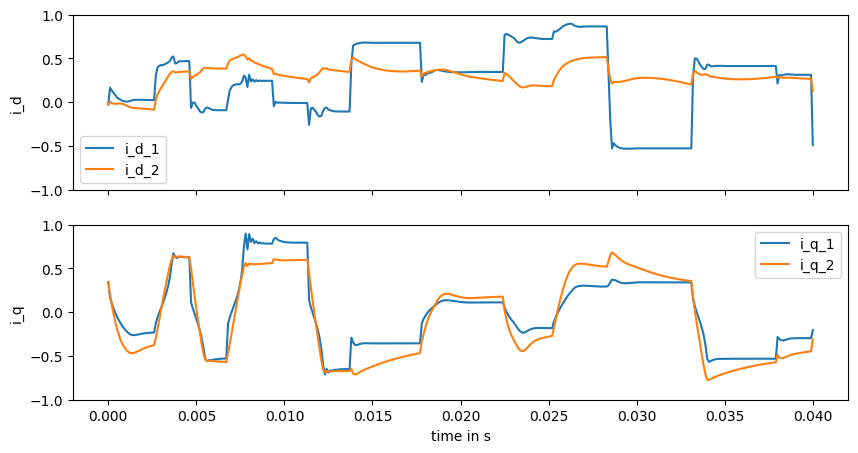

  6%|▌         | 5995/100000 [01:12<18:00, 87.00it/s]

Current val_loss: 0.052277423


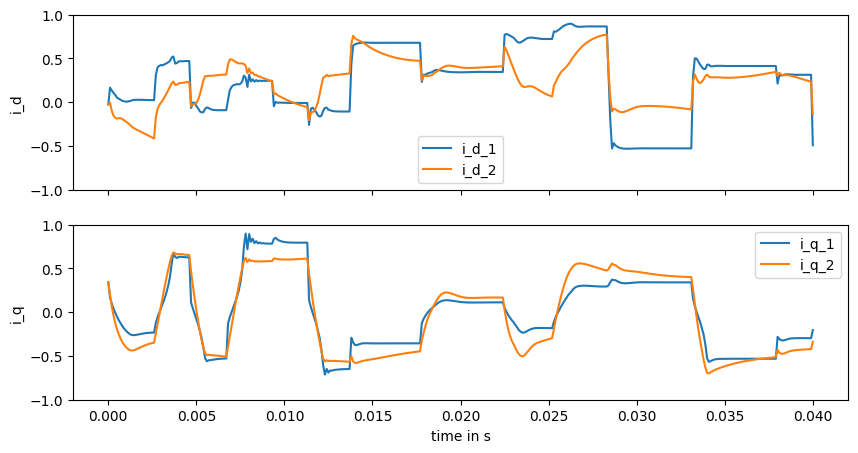

  8%|▊         | 7993/100000 [01:36<17:45, 86.31it/s]

Current val_loss: 0.042048234


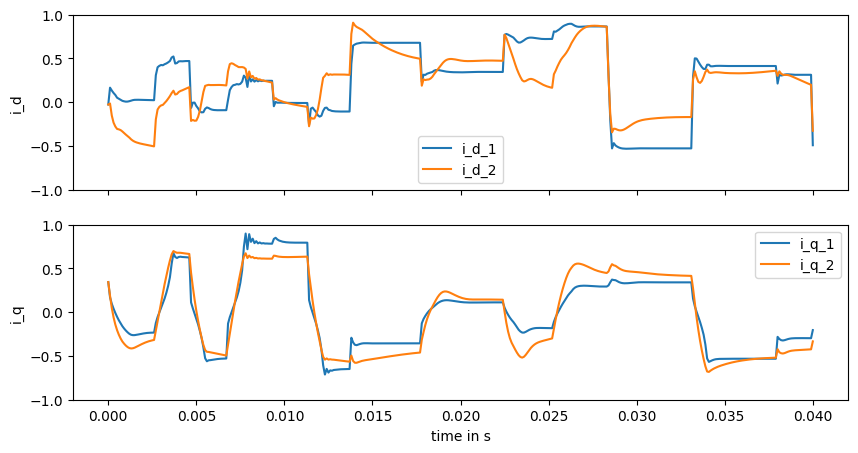

 10%|█         | 10000/100000 [01:59<17:15, 86.89it/s]

Current val_loss: 0.03512699


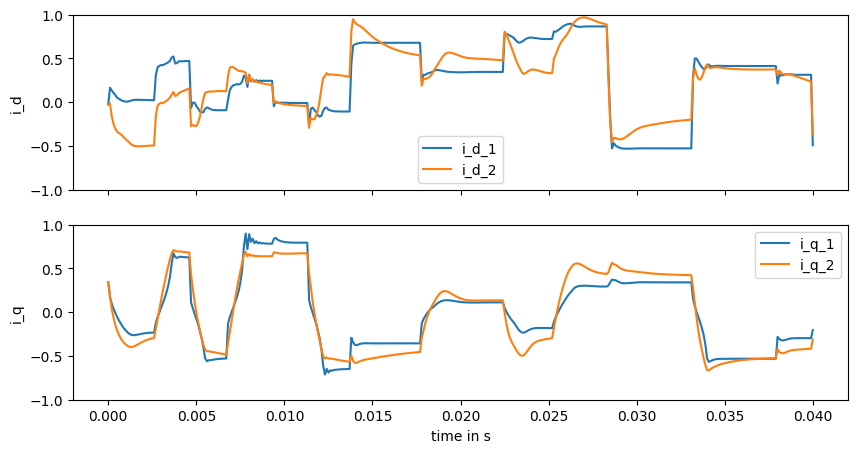

 12%|█▏        | 11998/100000 [02:23<16:54, 86.75it/s]

Current val_loss: 0.029759476


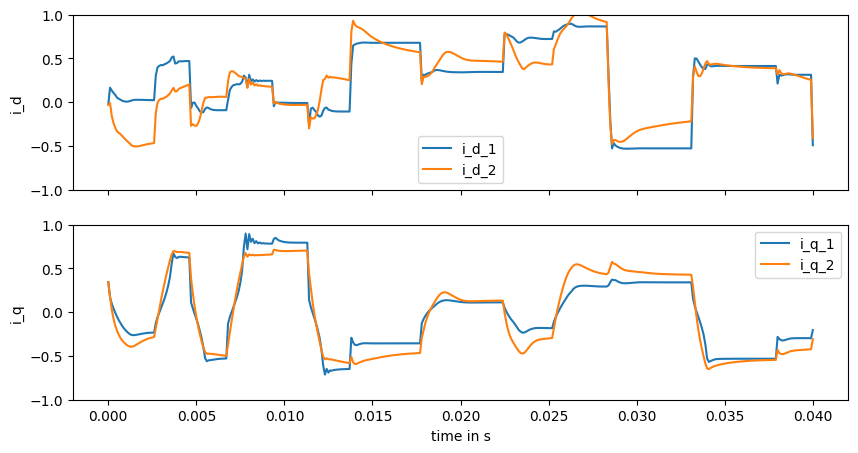

 14%|█▍        | 13996/100000 [02:46<16:53, 84.85it/s]

Current val_loss: 0.02194448


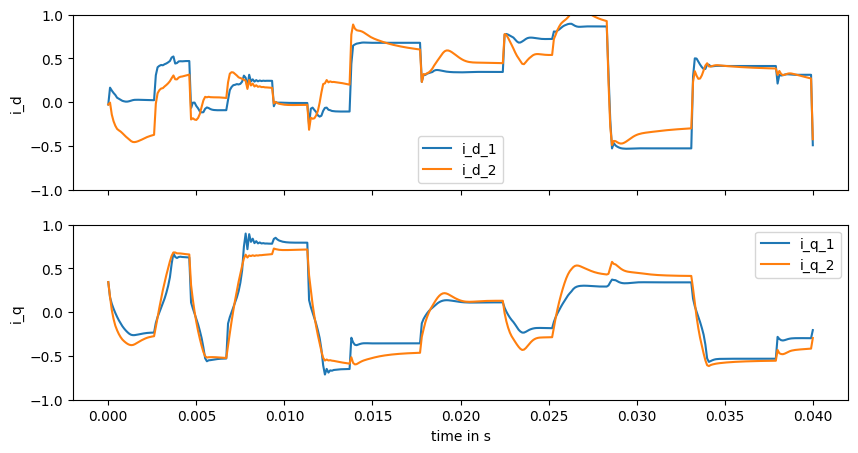

 16%|█▌        | 15994/100000 [03:10<16:09, 86.65it/s]

Current val_loss: 0.0146407755


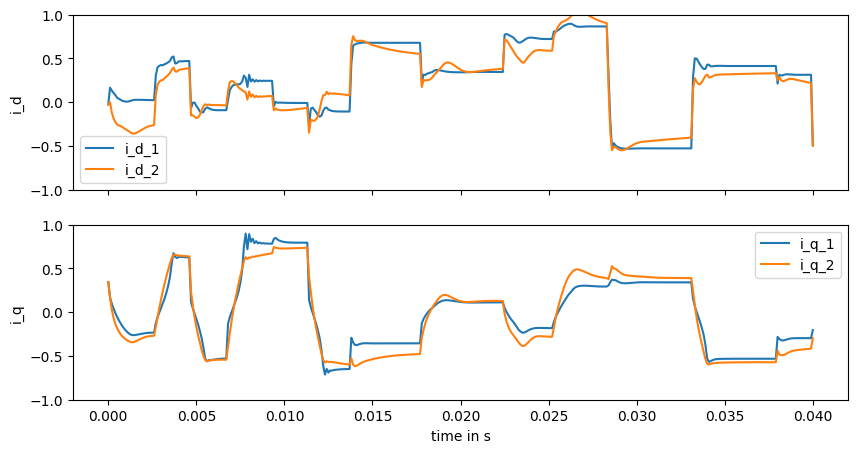

 18%|█▊        | 17992/100000 [03:33<15:44, 86.80it/s]

Current val_loss: 0.010679399


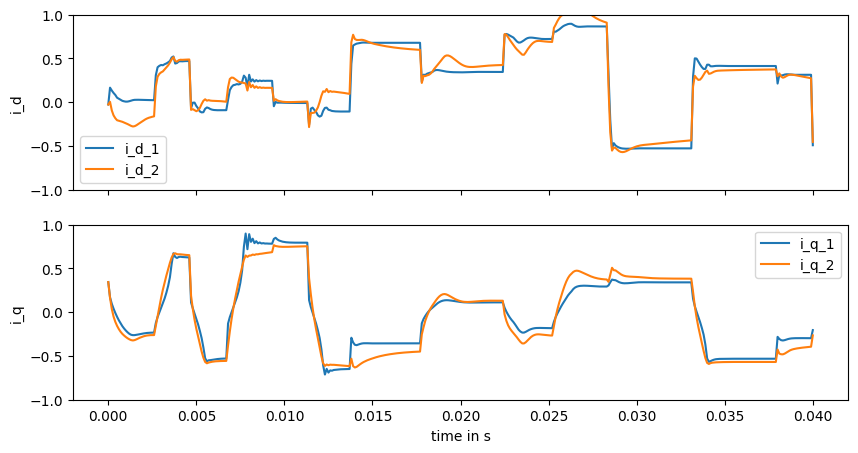

 20%|█▉        | 19999/100000 [03:57<15:27, 86.24it/s]

Current val_loss: 0.009081459


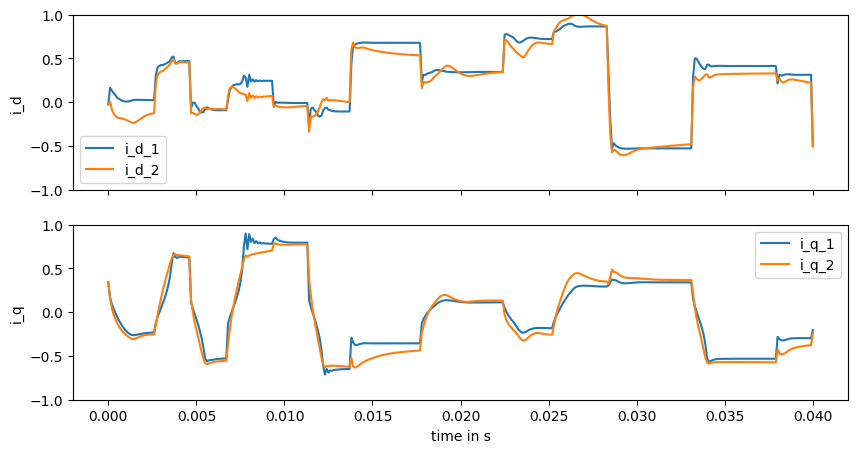

 22%|██▏       | 21997/100000 [04:20<14:56, 87.03it/s]

Current val_loss: 0.0063434853


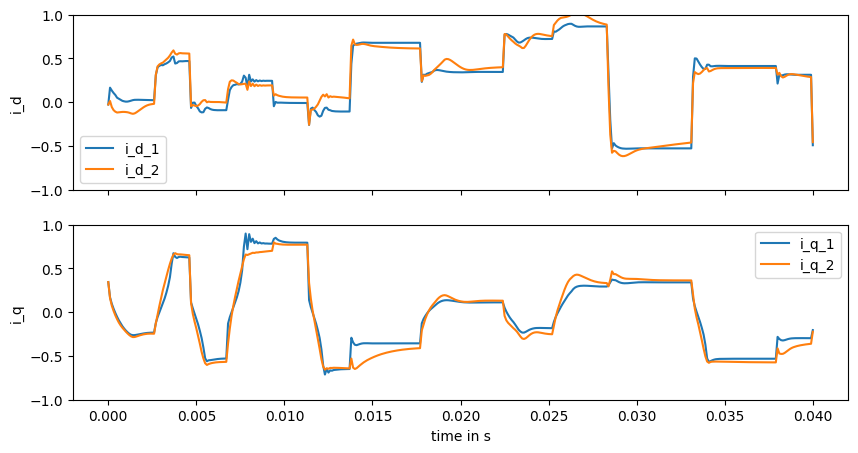

 24%|██▍       | 23995/100000 [04:44<14:37, 86.66it/s]

Current val_loss: 0.005035921


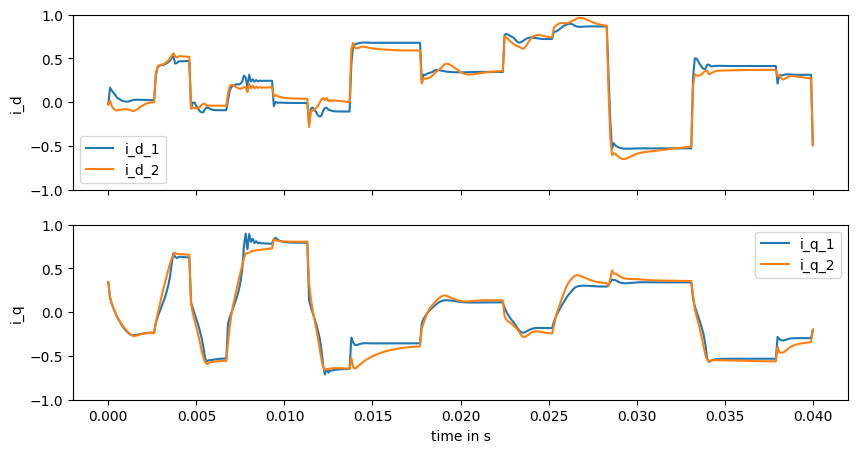

 26%|██▌       | 25993/100000 [05:08<14:09, 87.08it/s]

Current val_loss: 0.004545541


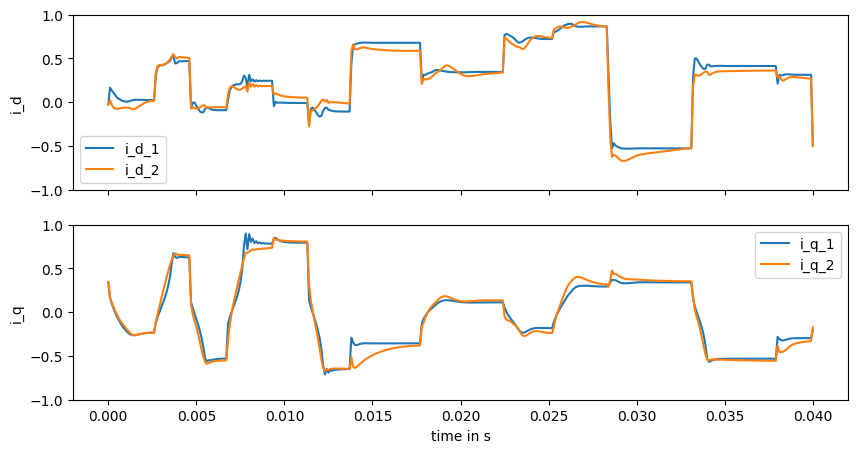

 28%|██▊       | 28000/100000 [05:31<13:50, 86.70it/s]

Current val_loss: 0.004434777


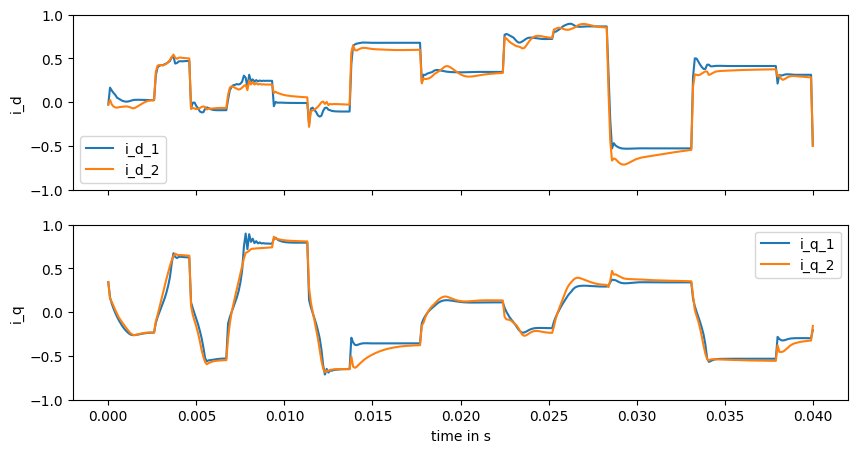

 30%|██▉       | 29997/100000 [05:55<13:23, 87.14it/s]

Current val_loss: 0.0050449832


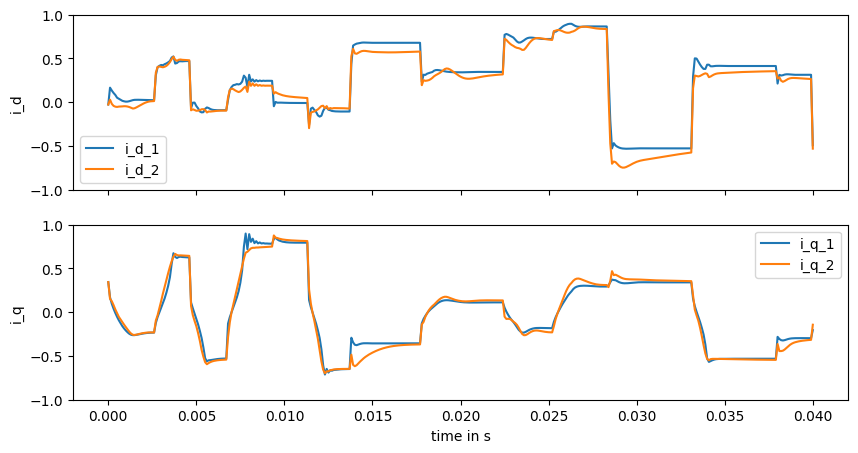

 32%|███▏      | 31995/100000 [06:18<13:01, 87.03it/s]

Current val_loss: 0.0043847775


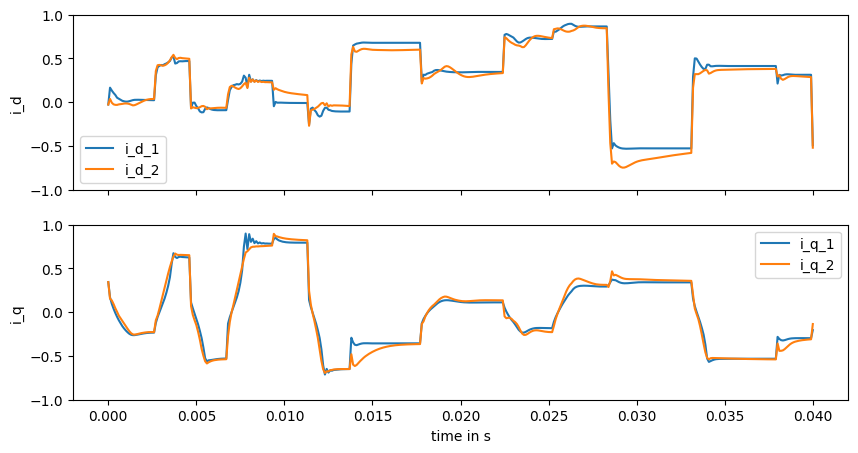

 34%|███▍      | 33993/100000 [06:41<12:38, 87.06it/s]

Current val_loss: 0.0061887554


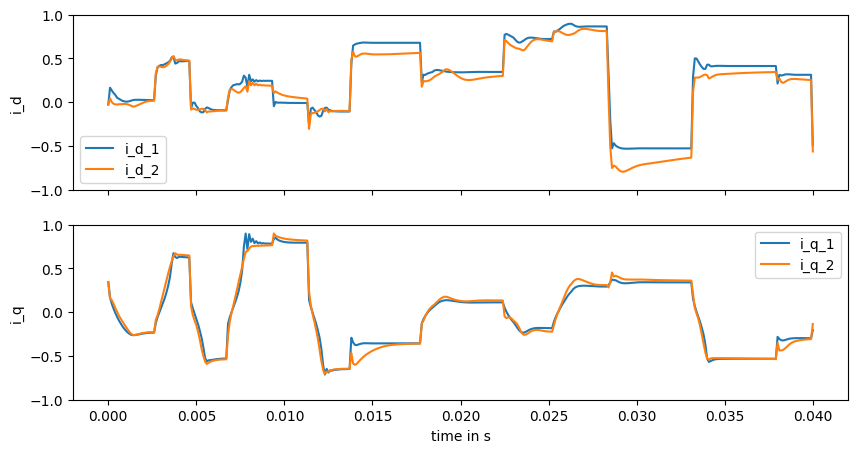

 36%|███▌      | 36000/100000 [07:05<12:15, 87.06it/s]

Current val_loss: 0.0060169697


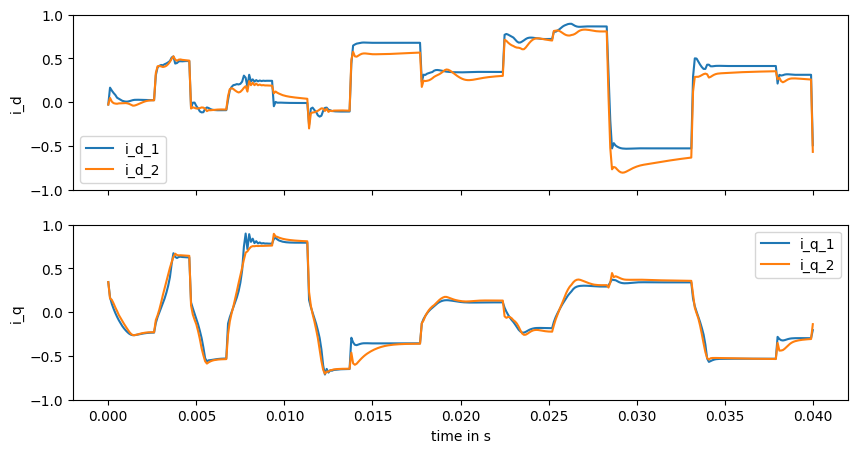

 38%|███▊      | 37998/100000 [07:28<11:57, 86.46it/s]

Current val_loss: 0.004872868


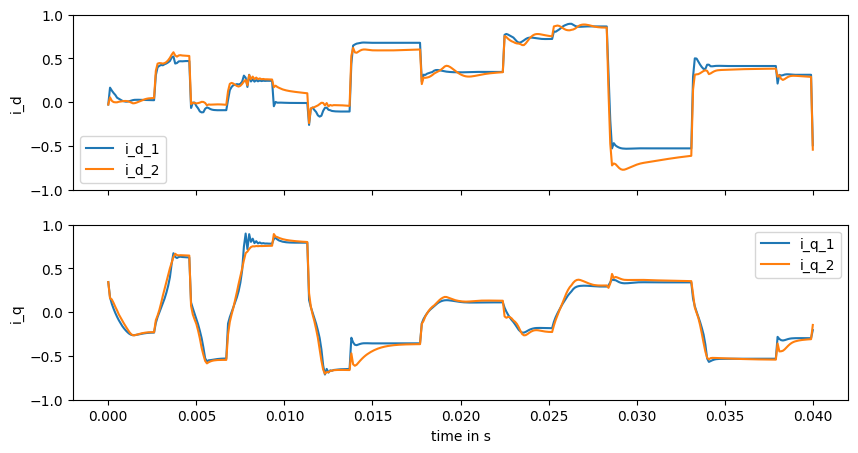

 40%|███▉      | 39998/100000 [07:54<12:40, 78.89it/s]

Current val_loss: 0.0051570917


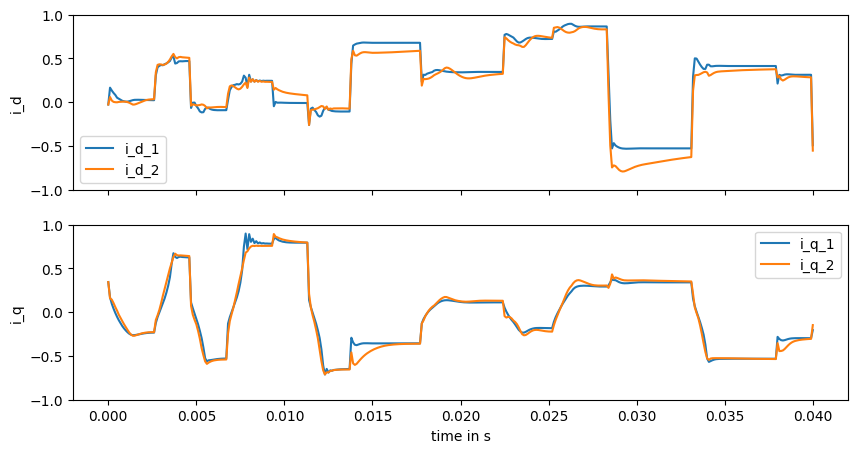

 42%|████▏     | 41999/100000 [08:19<12:09, 79.47it/s]

Current val_loss: 0.0066418783


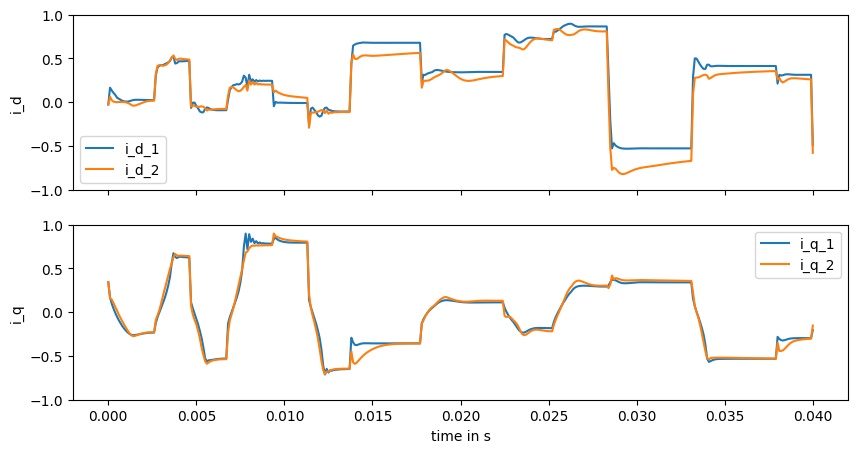

 44%|████▍     | 44000/100000 [08:45<10:46, 86.55it/s]

Current val_loss: 0.0056484565


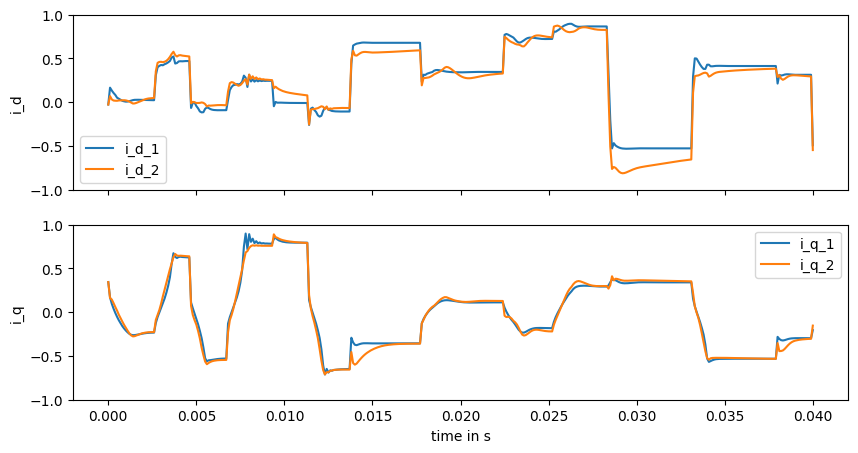

 46%|████▌     | 45998/100000 [09:08<10:20, 87.00it/s]

Current val_loss: 0.007326937


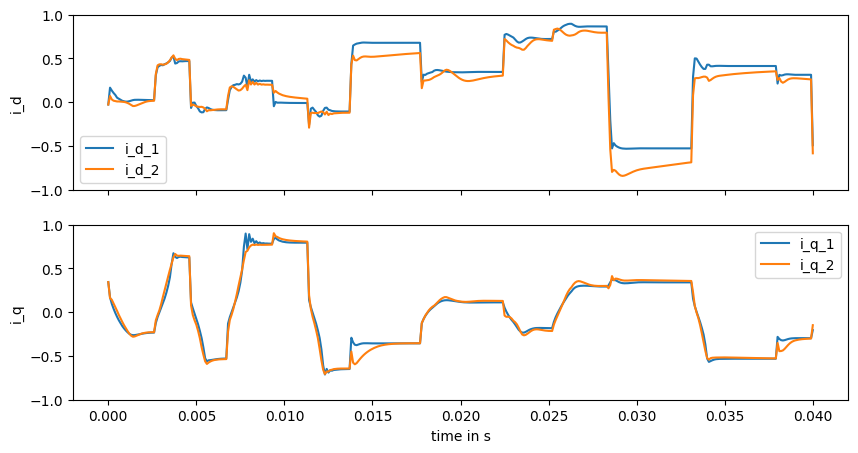

 48%|████▊     | 47996/100000 [09:31<10:01, 86.53it/s]

Current val_loss: 0.0074560973


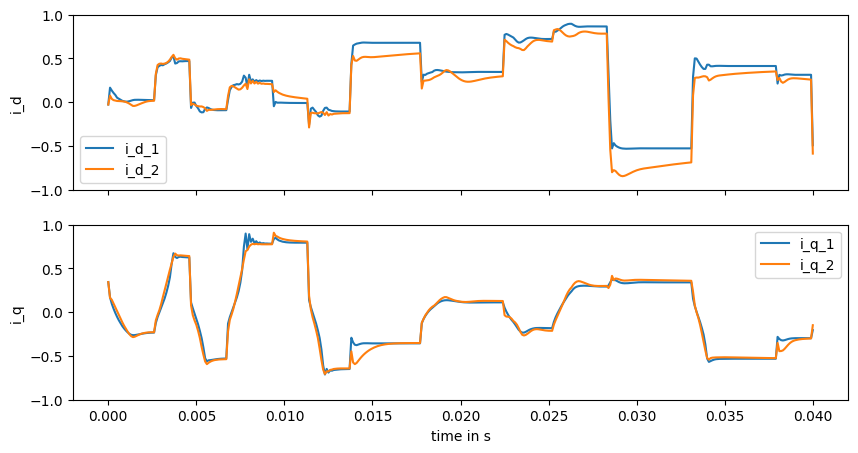

 50%|████▉     | 49994/100000 [09:55<09:34, 87.09it/s]

Current val_loss: 0.006657261


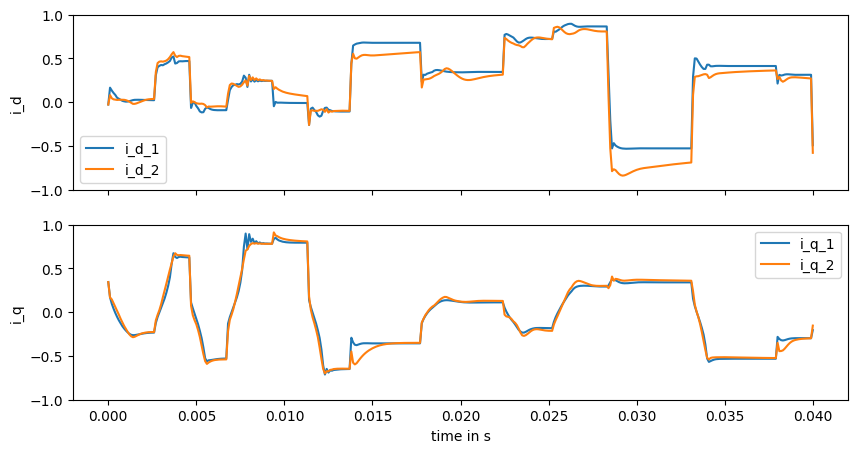

 52%|█████▏    | 51992/100000 [10:18<09:17, 86.12it/s]

Current val_loss: 0.0067689433


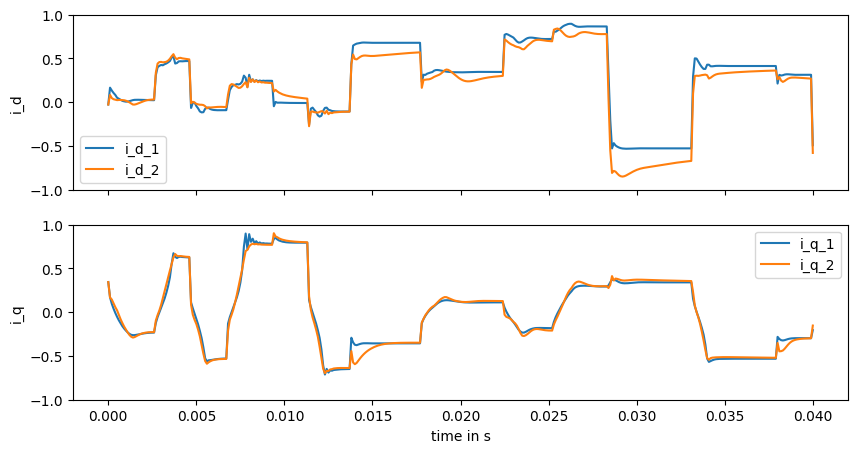

 54%|█████▍    | 53999/100000 [10:41<08:47, 87.16it/s]

Current val_loss: 0.006689788


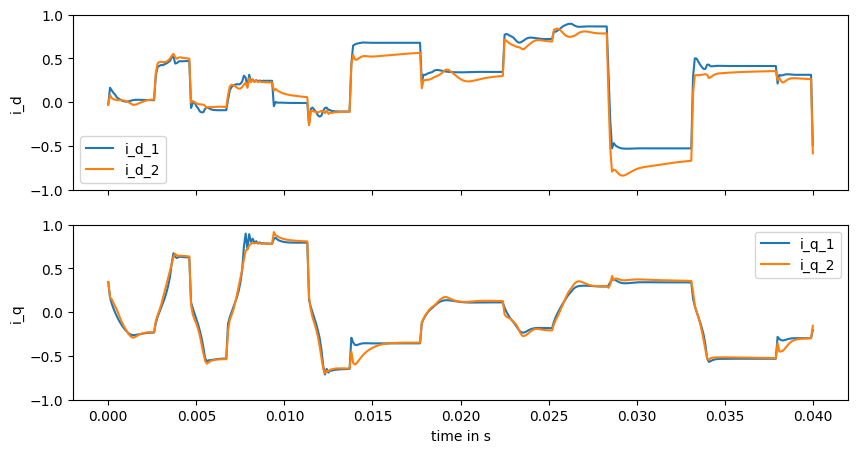

 56%|█████▌    | 55997/100000 [11:05<08:33, 85.68it/s]

Current val_loss: 0.0055066384


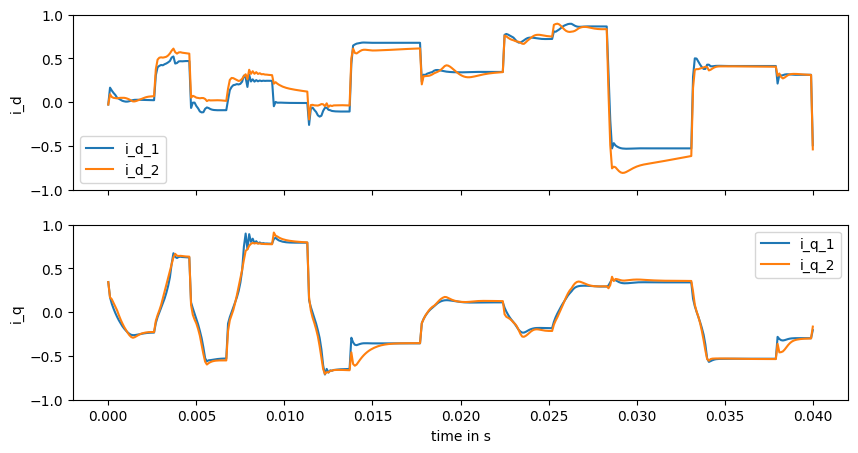

 58%|█████▊    | 57995/100000 [11:29<08:07, 86.21it/s]

Current val_loss: 0.005584507


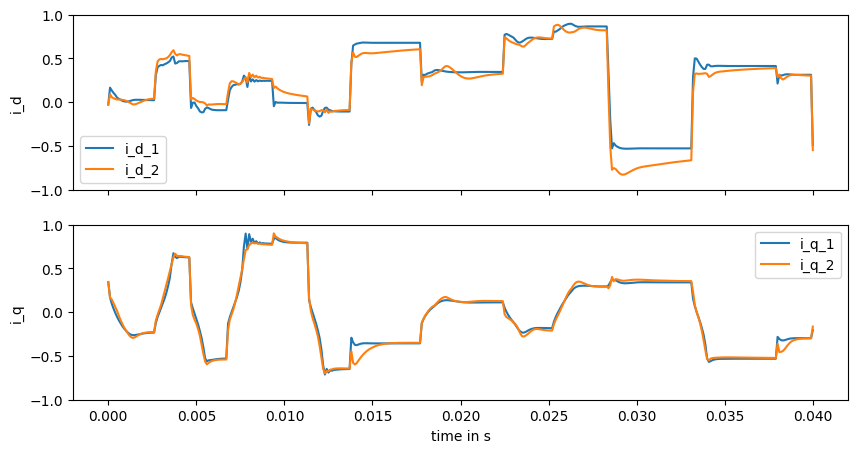

 60%|█████▉    | 59993/100000 [11:52<07:40, 86.86it/s]

Current val_loss: 0.0054396875


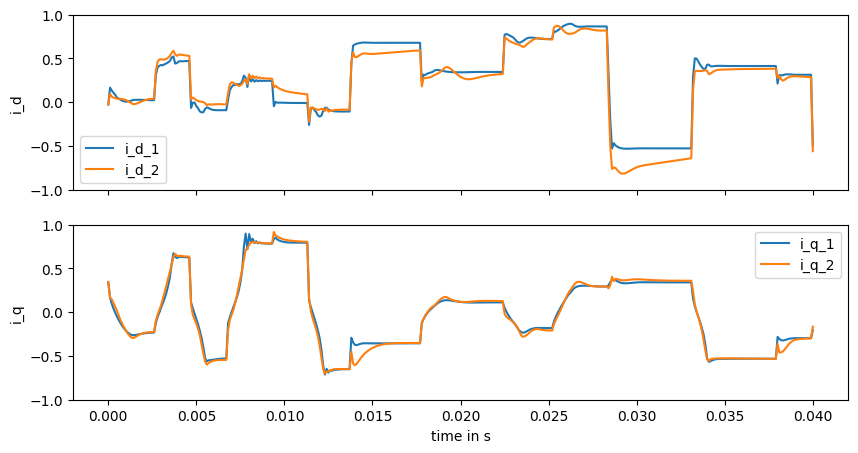

 62%|██████▏   | 62000/100000 [12:16<07:14, 87.44it/s]

Current val_loss: 0.005169142


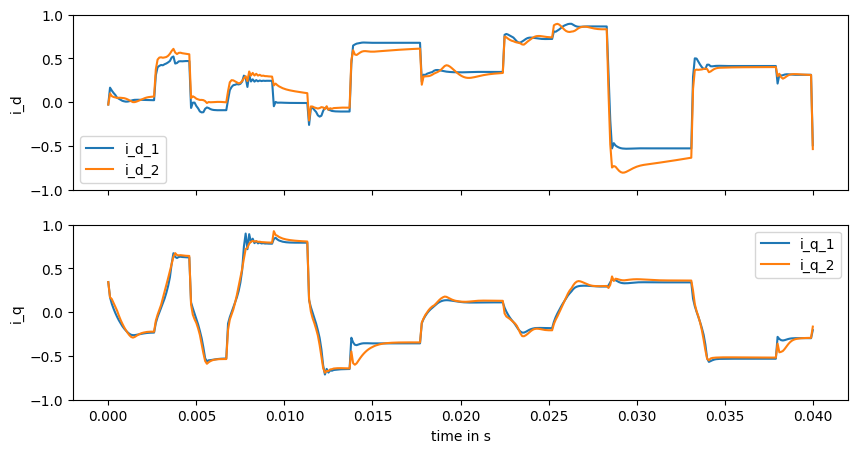

 64%|██████▍   | 63998/100000 [12:39<06:54, 86.80it/s]

Current val_loss: 0.0060737017


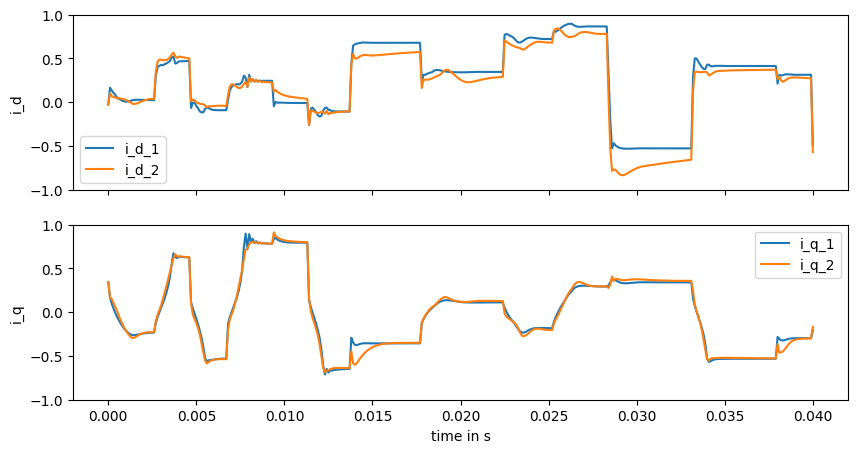

 66%|██████▌   | 65996/100000 [13:03<06:32, 86.69it/s]

Current val_loss: 0.0051736766


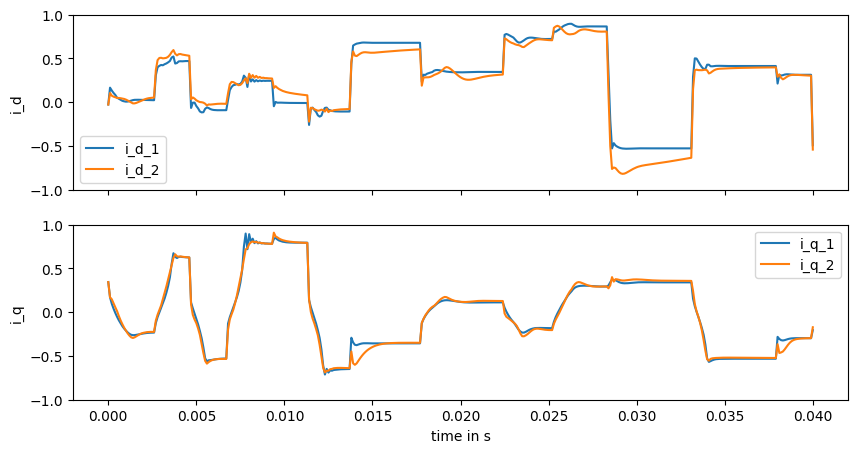

 68%|██████▊   | 67994/100000 [13:26<06:08, 86.92it/s]

Current val_loss: 0.0056061284


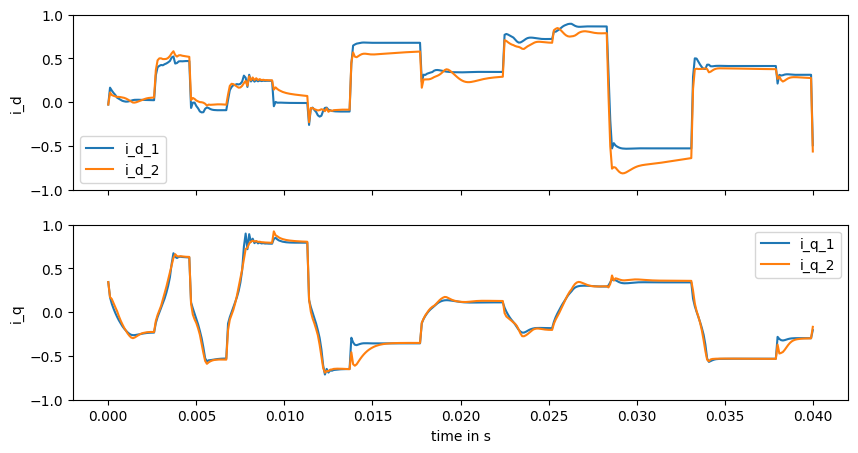

 70%|██████▉   | 69992/100000 [13:49<05:44, 87.17it/s]

Current val_loss: 0.0062699225


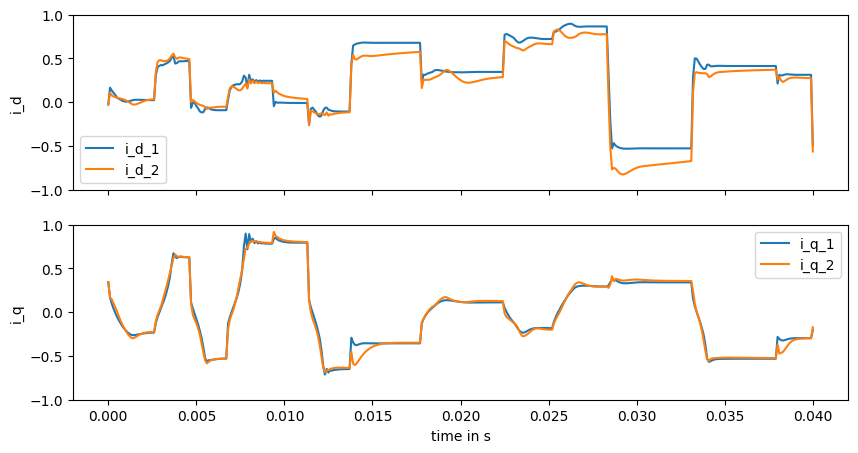

 72%|███████▏  | 71999/100000 [14:13<05:26, 85.82it/s]

Current val_loss: 0.0056584203


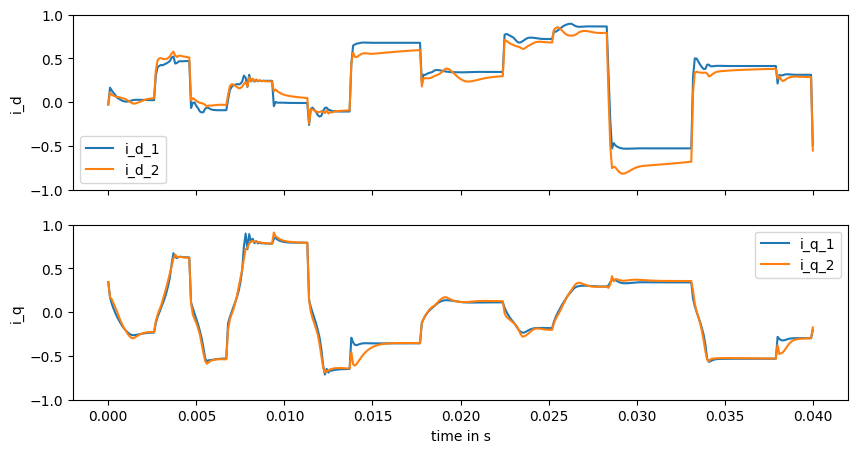

 74%|███████▍  | 73997/100000 [14:36<04:58, 86.99it/s]

Current val_loss: 0.0047411844


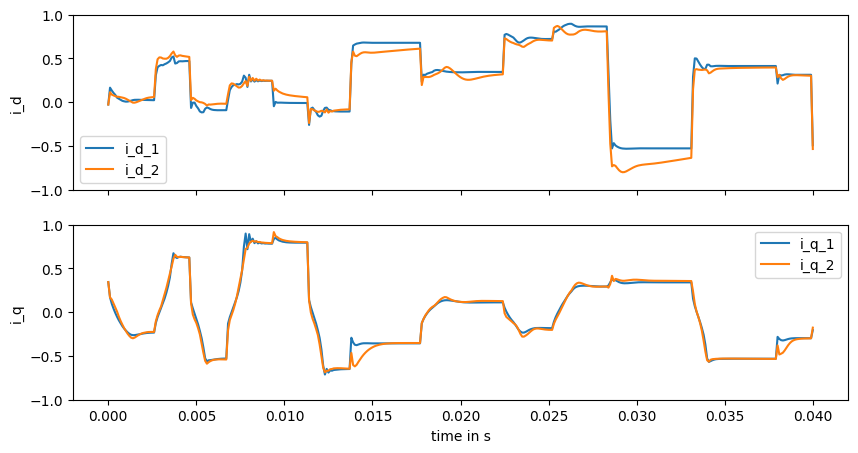

 76%|███████▌  | 75995/100000 [15:00<04:36, 86.88it/s]

Current val_loss: 0.0064150263


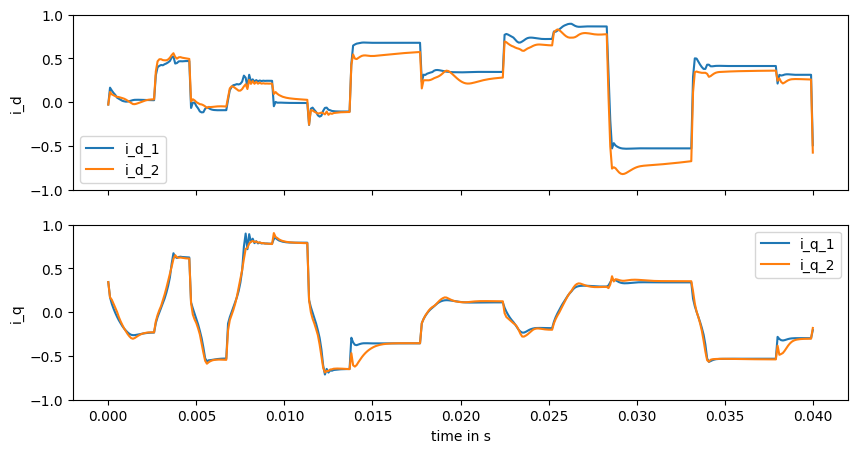

 78%|███████▊  | 77993/100000 [15:23<04:12, 87.32it/s]

Current val_loss: 0.0070494837


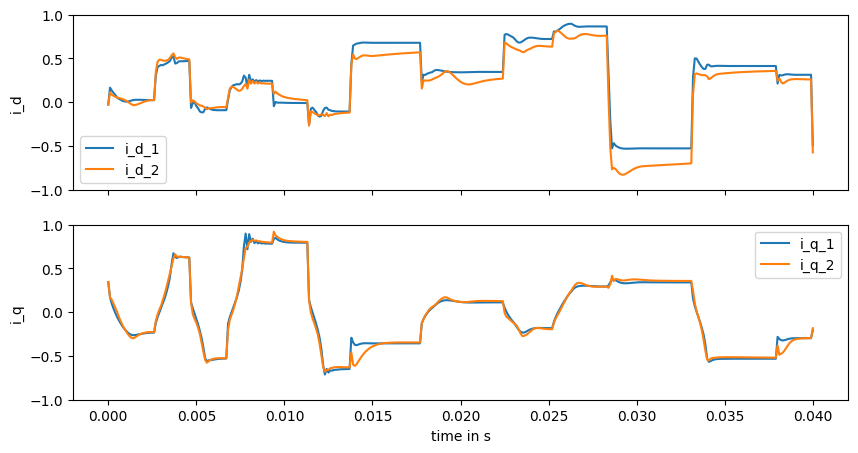

 80%|████████  | 80000/100000 [15:47<03:50, 86.61it/s]

Current val_loss: 0.004879219


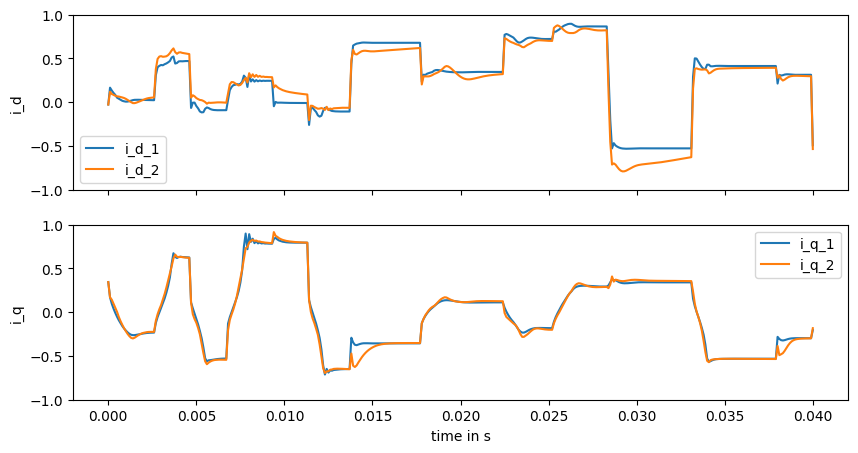

 82%|████████▏ | 81998/100000 [16:10<03:27, 86.90it/s]

Current val_loss: 0.006212939


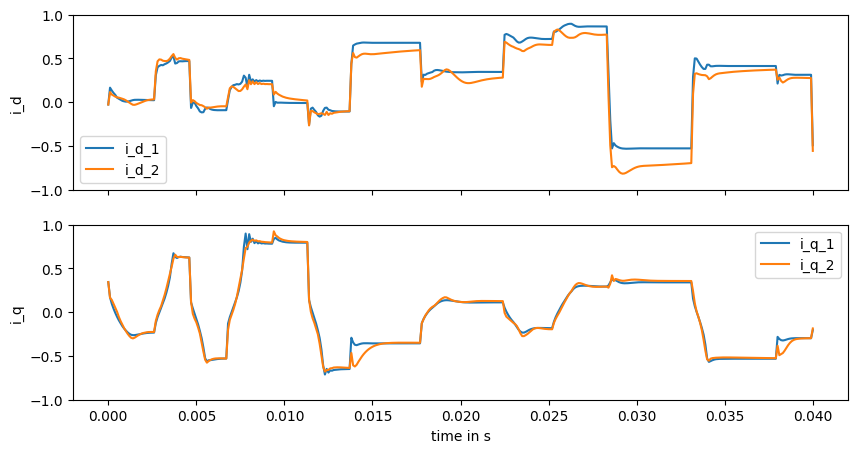

 84%|████████▍ | 83996/100000 [16:34<03:04, 86.66it/s]

Current val_loss: 0.006473177


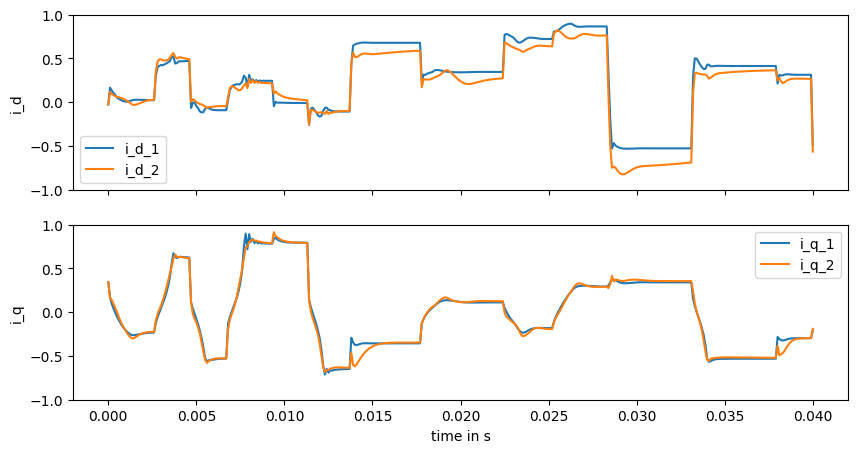

 86%|████████▌ | 85994/100000 [16:57<02:41, 86.67it/s]

Current val_loss: 0.004714804


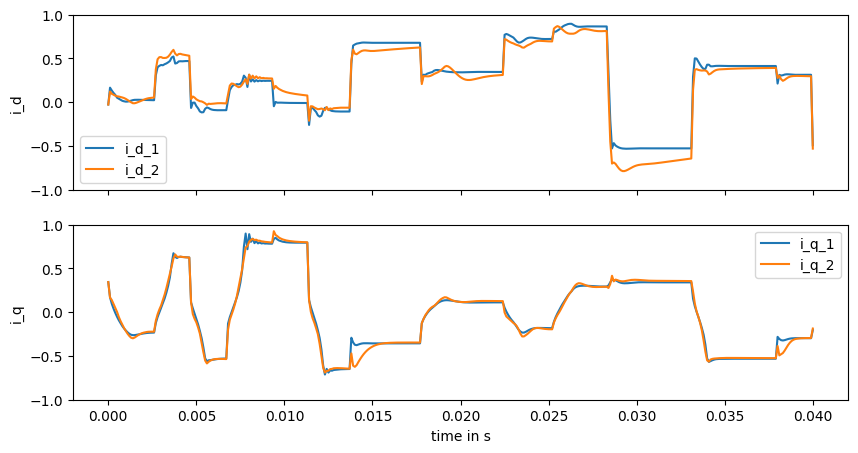

 88%|████████▊ | 87992/100000 [17:21<02:17, 87.09it/s]

Current val_loss: 0.005839355


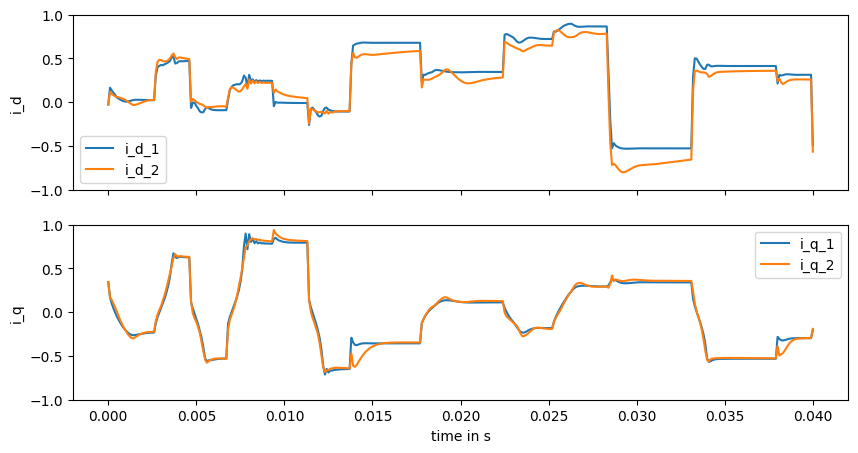

 90%|████████▉ | 89999/100000 [17:45<02:06, 78.87it/s]

Current val_loss: 0.004802822


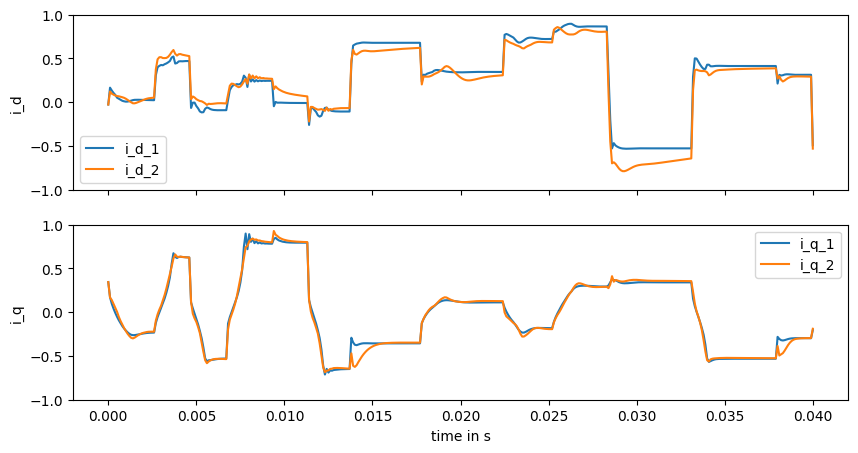

 92%|█████████▏| 91999/100000 [18:11<01:41, 79.13it/s]

Current val_loss: 0.0052698776


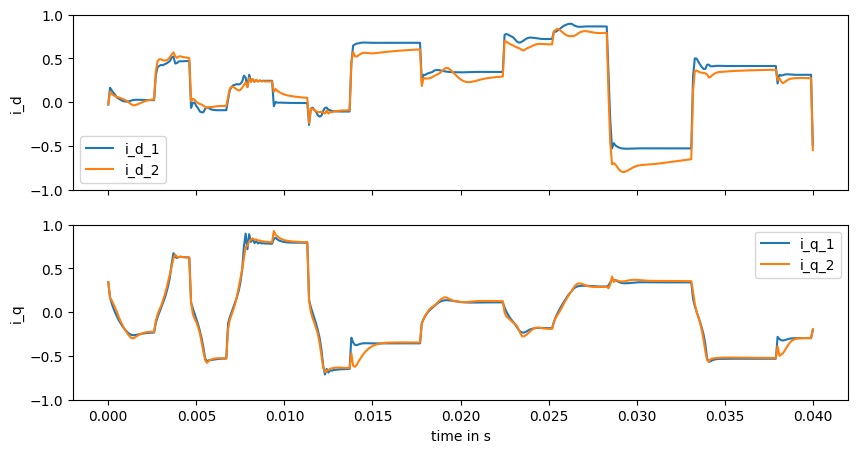

 94%|█████████▍| 93999/100000 [18:37<01:15, 79.35it/s]

Current val_loss: 0.006898557


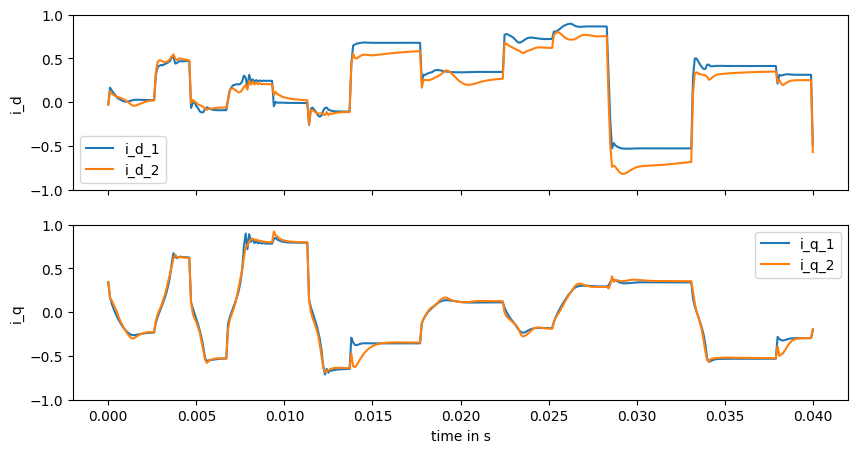

 96%|█████████▌| 95999/100000 [19:03<00:50, 79.54it/s]

Current val_loss: 0.005798116


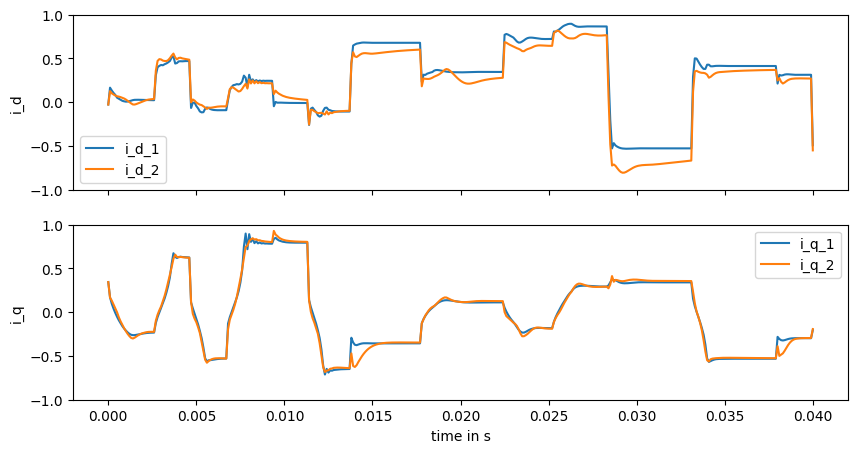

 98%|█████████▊| 97996/100000 [19:26<00:23, 86.53it/s]

Current val_loss: 0.0042433008


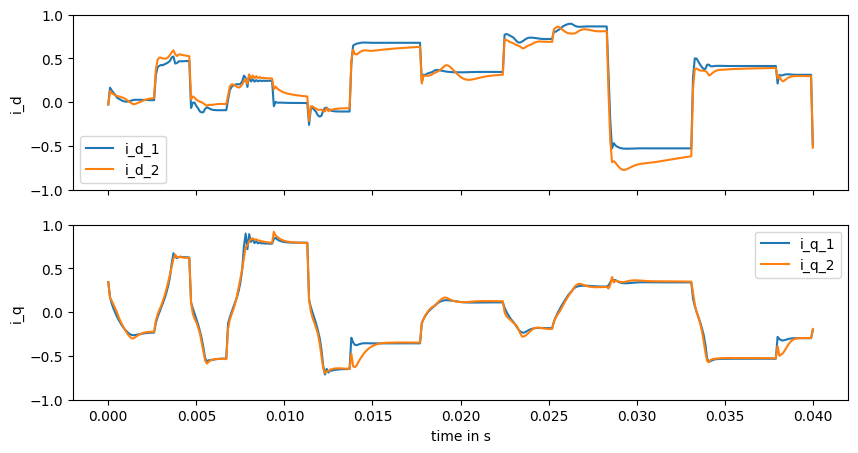

100%|██████████| 100000/100000 [19:50<00:00, 84.02it/s]


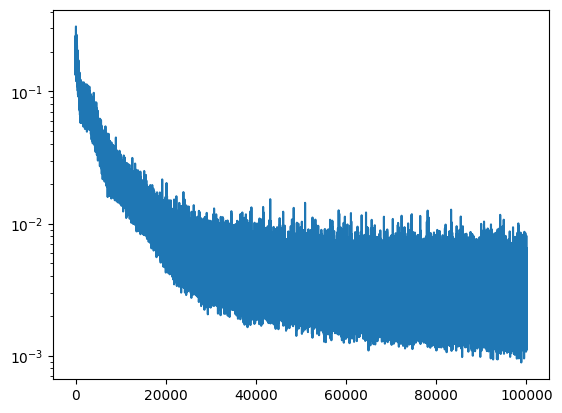

In [24]:
fin_node,fin_opt_state,fin_keys,losses, val_losses=mtrainer.fit_non_jit(node,opt_state,keys,plot_every=2000)
plt.plot(losses)
plt.yscale('log')


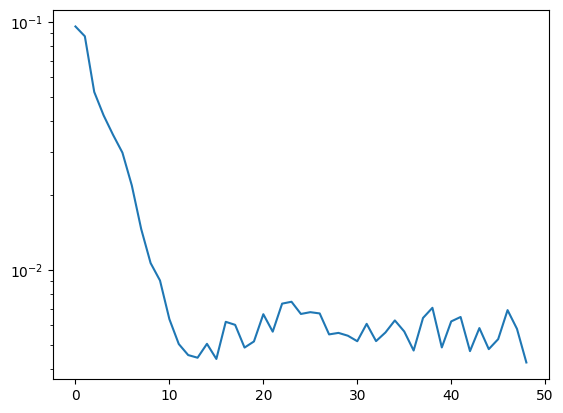

In [25]:
plt.plot(val_losses)
plt.yscale('log')

In [37]:
batch_size=100
mtrainer=ModelTrainer(
    train_steps=100_000,
    batch_size=batch_size,
    sequence_len=1,
    featurize=featurize_node,
    train_data_gen_sin=data_gen_single,
    val_data_gen_sin= val_data_gen_single,
    model_optimizer=optimizer_node,
    tau= motor_env.tau
    )
keys=jax.vmap(jax.random.PRNGKey)(np.random.randint(0, 2**31, size=(batch_size,)))

  0%|          | 0/100000 [00:00<?, ?it/s]/home/olivers/.conda/envs/venv_proj/lib/python3.11/site-packages/jax/_src/numpy/lax_numpy.py:3042: UserWarning: Explicitly requested dtype float64 requested in asarray is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  start = asarray(start, dtype=computation_dtype)
/home/olivers/.conda/envs/venv_proj/lib/python3.11/site-packages/jax/_src/numpy/lax_numpy.py:3043: UserWarning: Explicitly requested dtype float64 requested in asarray is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  stop = asarray(stop, dtype=computation_dtype)
/home/olivers/.conda/envs/venv_proj/lib/python3.11/sit

Current val_loss: 0.48110914


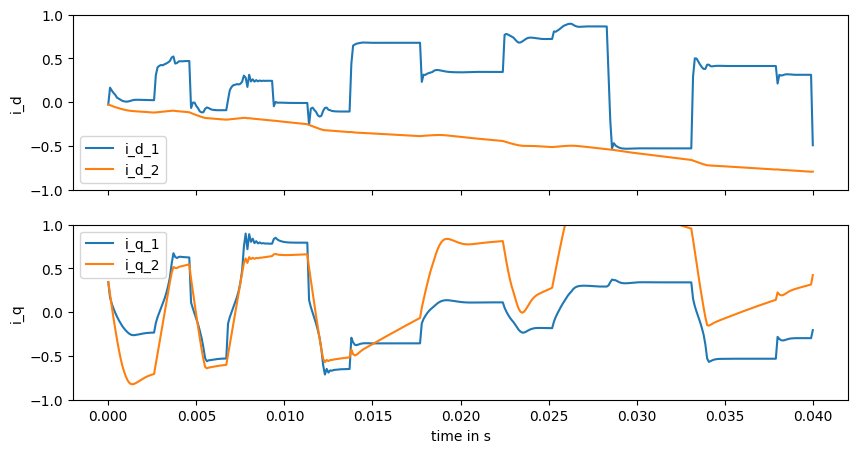

  4%|▍         | 3964/100000 [00:09<02:37, 610.24it/s]

Current val_loss: 0.82269734


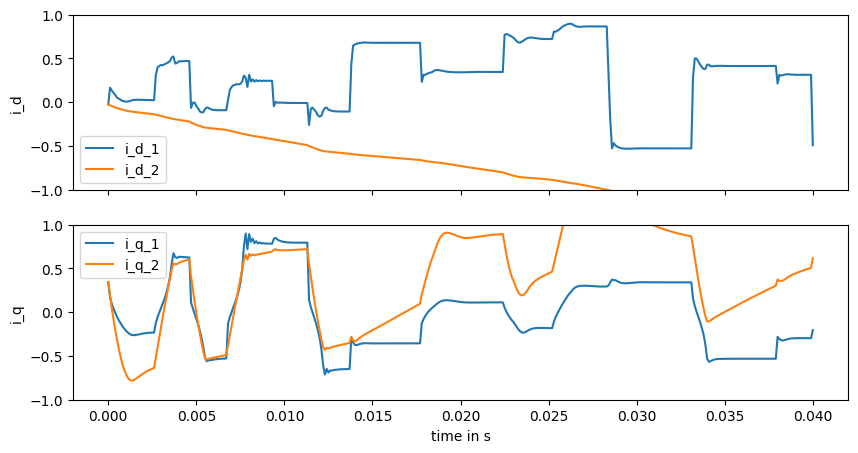

  6%|▌         | 5961/100000 [00:14<02:50, 551.51it/s]

Current val_loss: 1.4193187


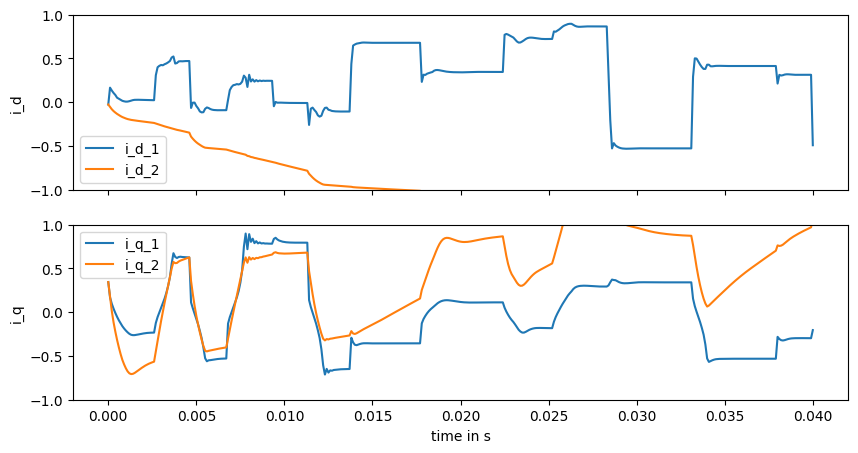

  8%|▊         | 7947/100000 [00:18<02:25, 630.61it/s]

Current val_loss: 0.36690348


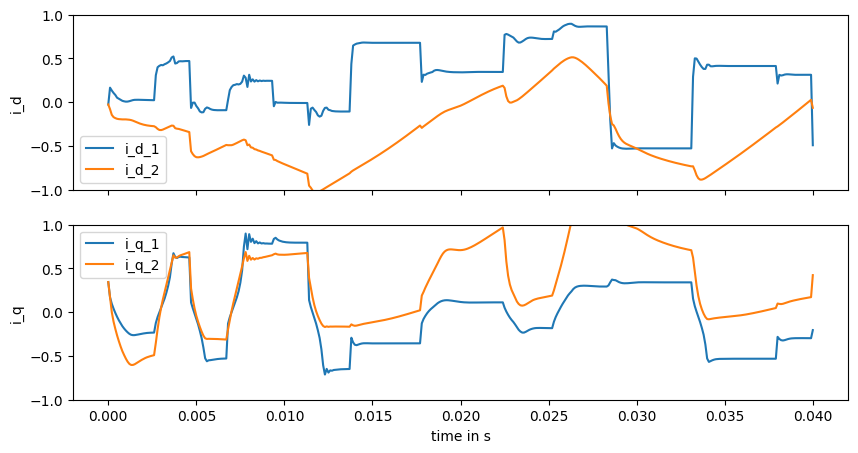

 10%|▉         | 9997/100000 [00:21<02:25, 620.55it/s]

Current val_loss: 0.058061473


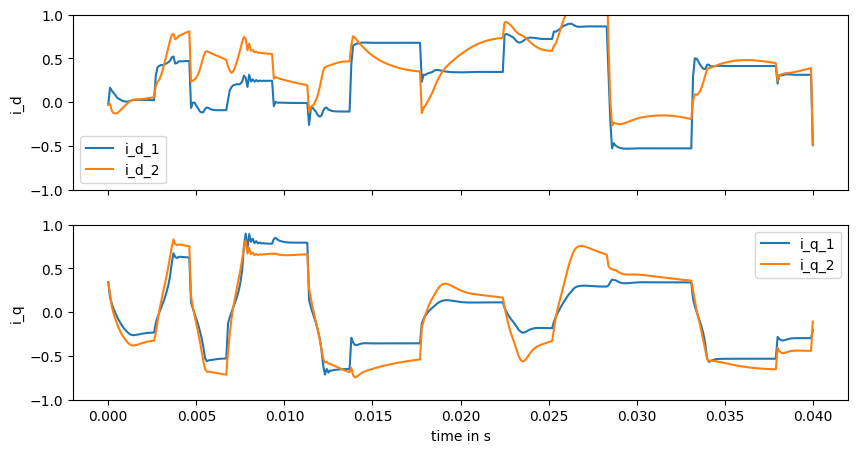

 12%|█▏        | 11952/100000 [00:25<02:13, 659.02it/s]

Current val_loss: 0.10354957


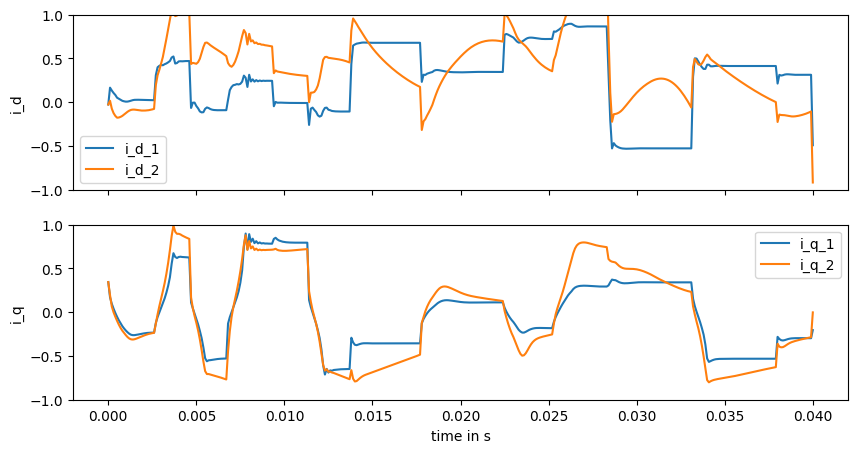

 14%|█▍        | 13940/100000 [00:29<02:16, 629.34it/s]

Current val_loss: 0.05157995


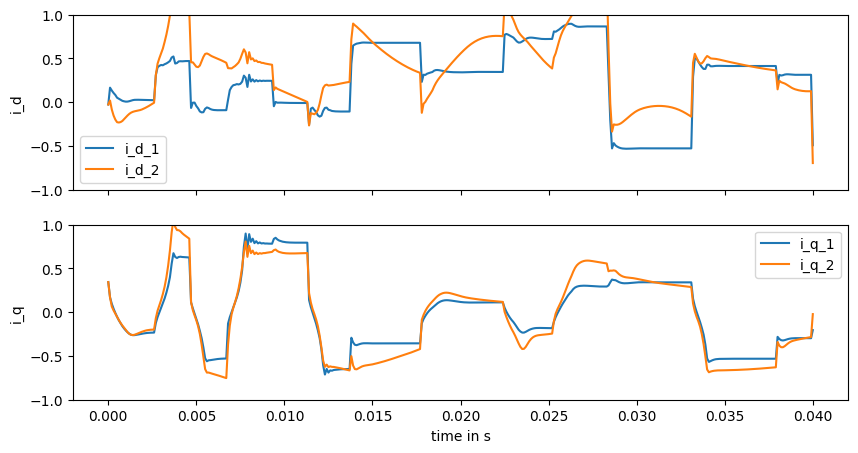

 16%|█▌        | 15948/100000 [00:32<02:06, 664.20it/s]

Current val_loss: 0.22142051


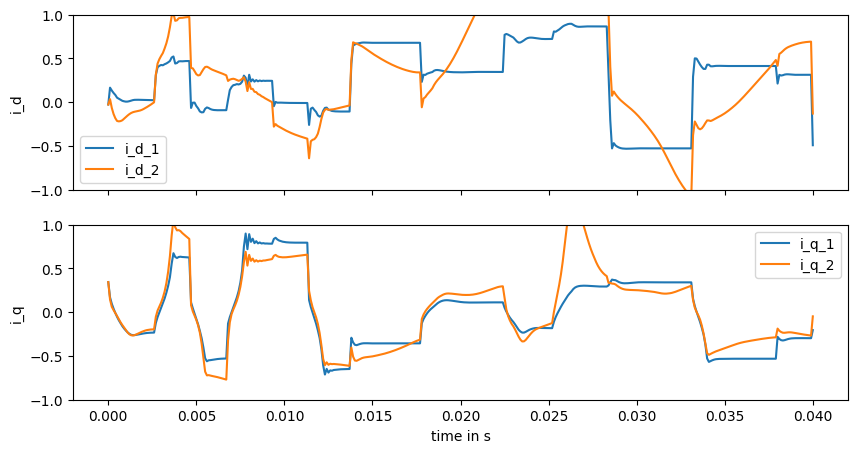

 18%|█▊        | 17954/100000 [00:36<02:06, 650.52it/s]

Current val_loss: 0.03840238


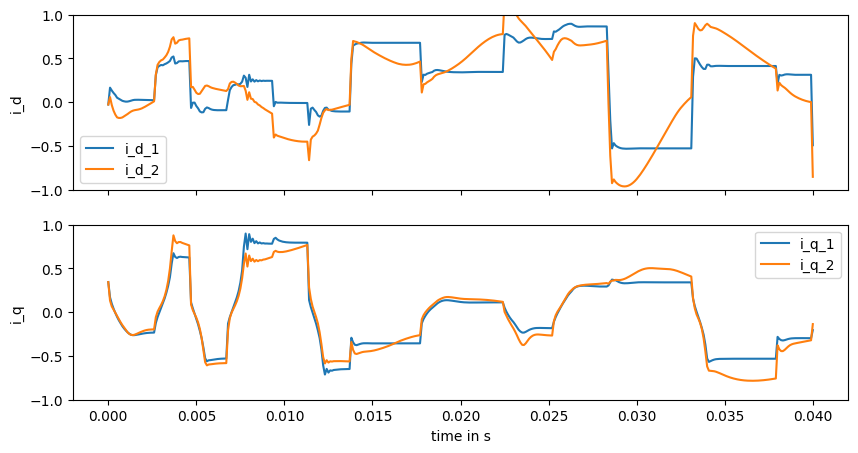

 20%|█▉        | 19942/100000 [00:39<02:08, 624.19it/s]

Current val_loss: 0.43450412


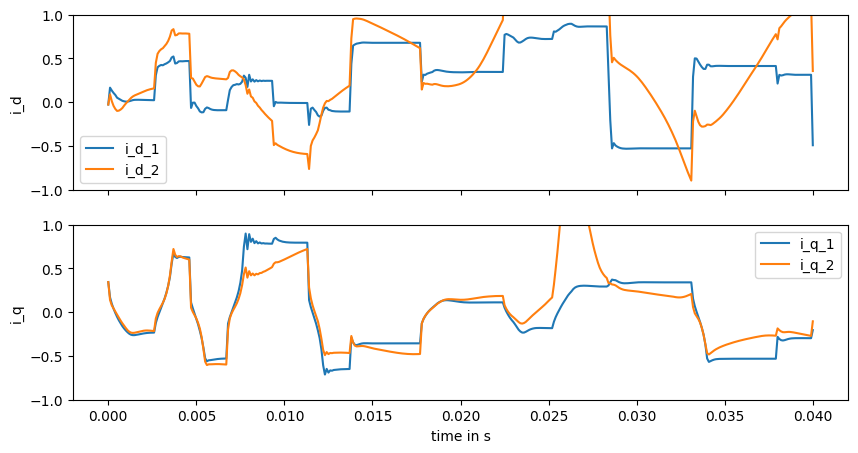

 22%|██▏       | 21964/100000 [00:43<01:55, 673.73it/s]

Current val_loss: 0.13371998


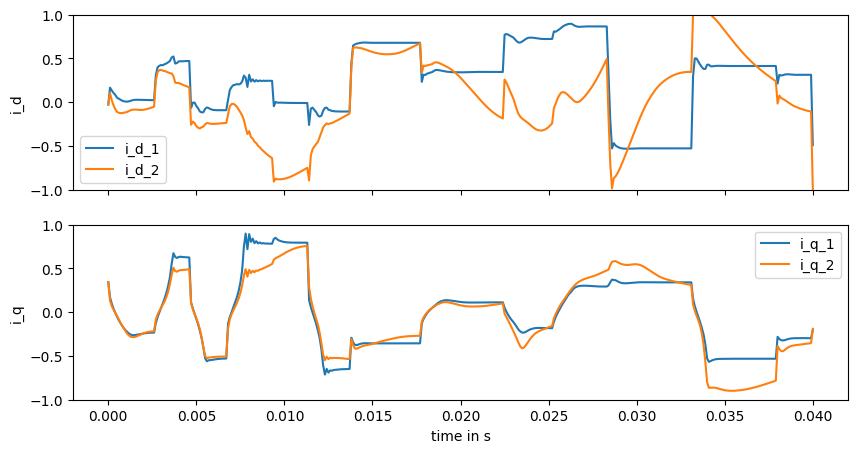

 24%|██▍       | 23980/100000 [00:46<01:53, 669.56it/s]

Current val_loss: 0.53119


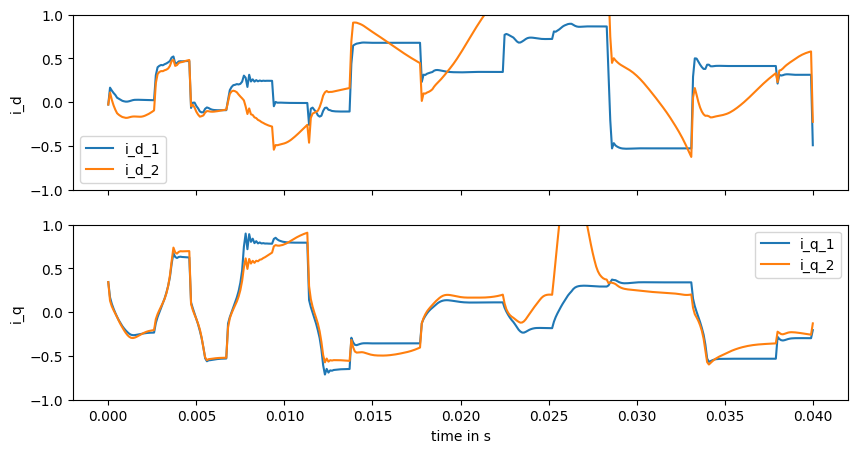

 26%|██▌       | 25945/100000 [00:50<01:50, 672.53it/s]

Current val_loss: 0.04688419


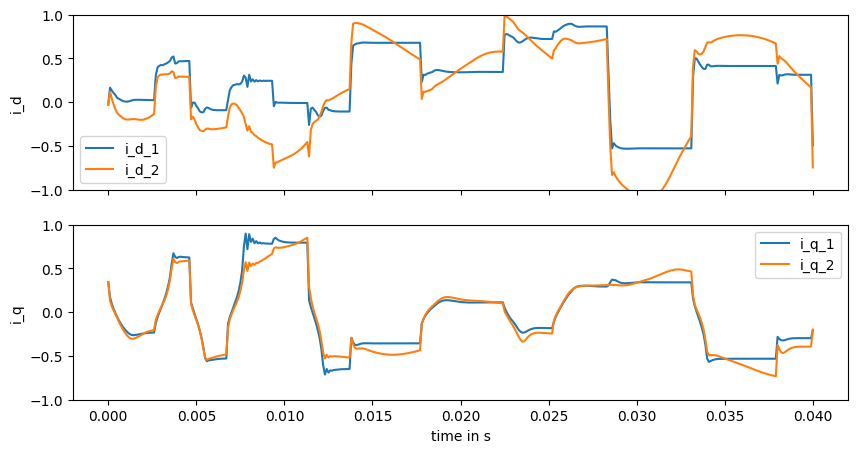

 28%|██▊       | 27997/100000 [00:53<01:46, 677.74it/s]

Current val_loss: 0.045121405


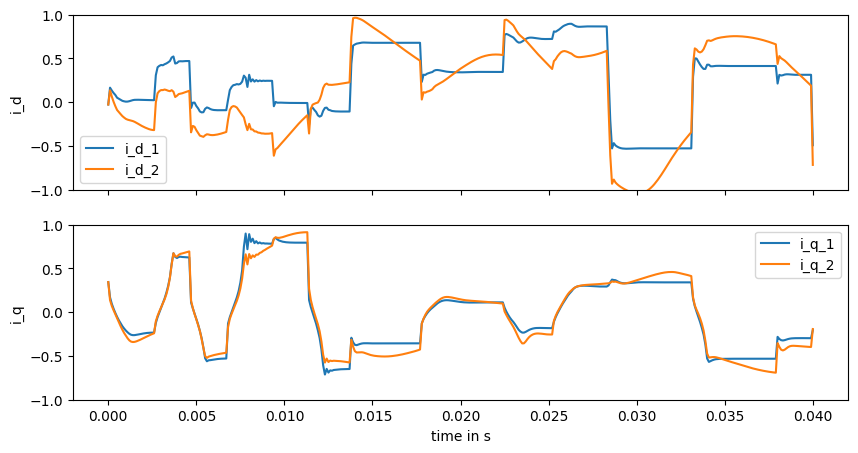

 30%|██▉       | 29934/100000 [00:56<01:43, 679.82it/s]

Current val_loss: 0.45302173


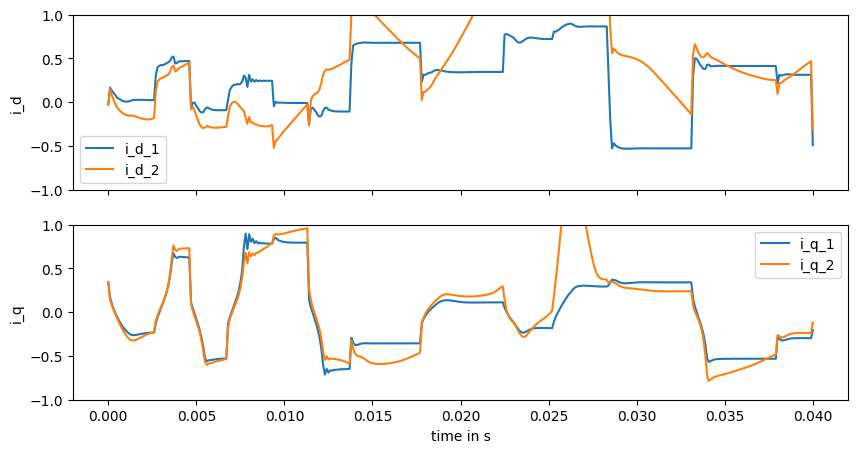

 32%|███▏      | 31973/100000 [01:00<01:52, 603.61it/s]

Current val_loss: 0.116546616


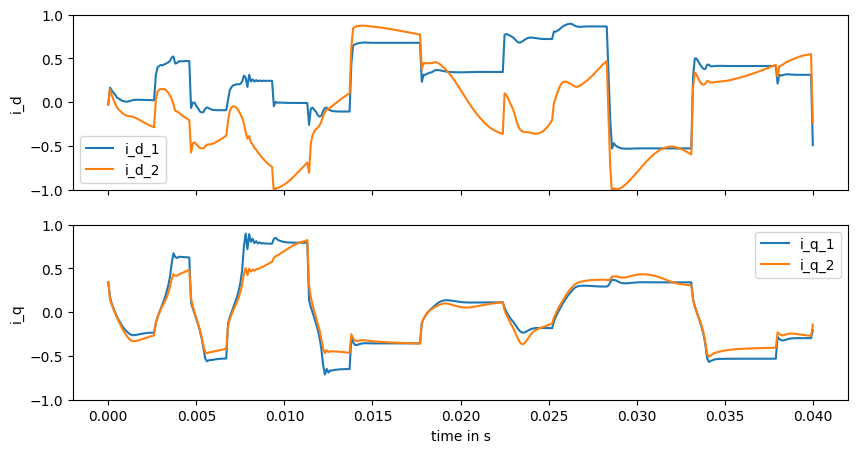

 34%|███▍      | 33988/100000 [01:04<01:50, 599.39it/s]

Current val_loss: 0.22340973


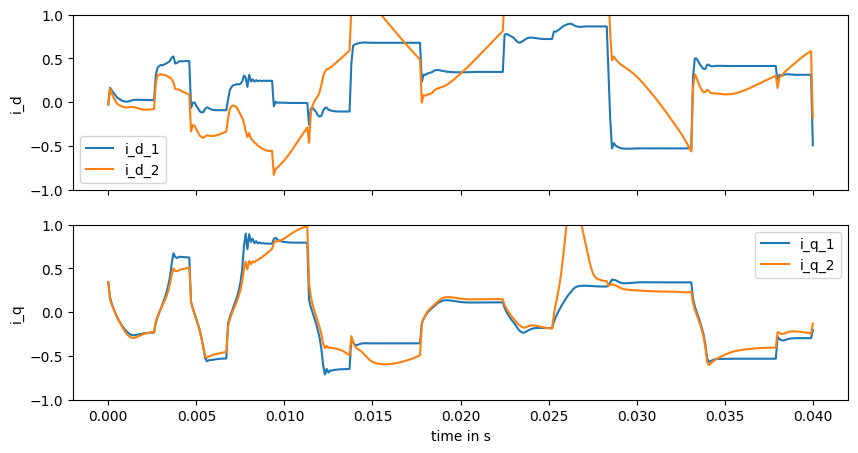

 36%|███▌      | 35997/100000 [01:07<01:46, 601.31it/s]

Current val_loss: 0.1571522


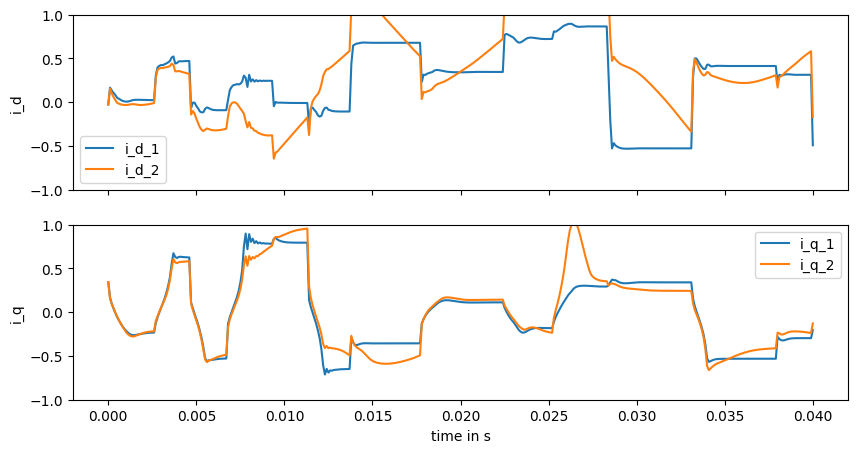

 38%|███▊      | 37993/100000 [01:11<01:30, 683.07it/s]

Current val_loss: 0.07543606


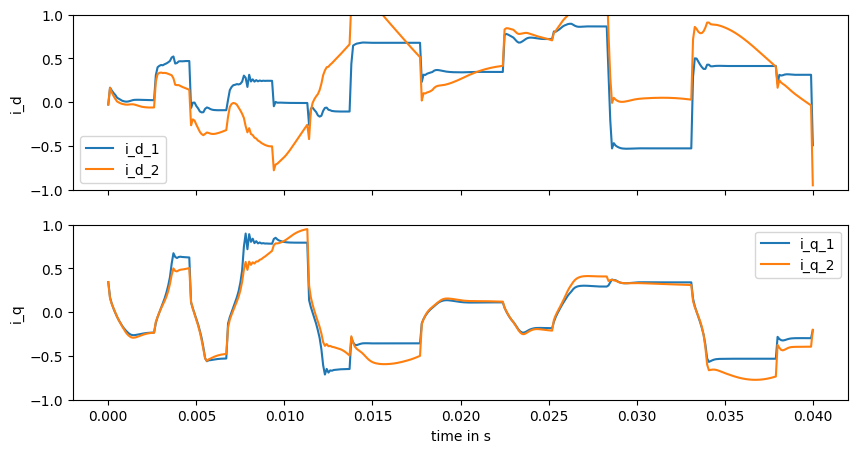

 40%|███▉      | 39938/100000 [01:14<01:26, 691.81it/s]

Current val_loss: 0.14027977


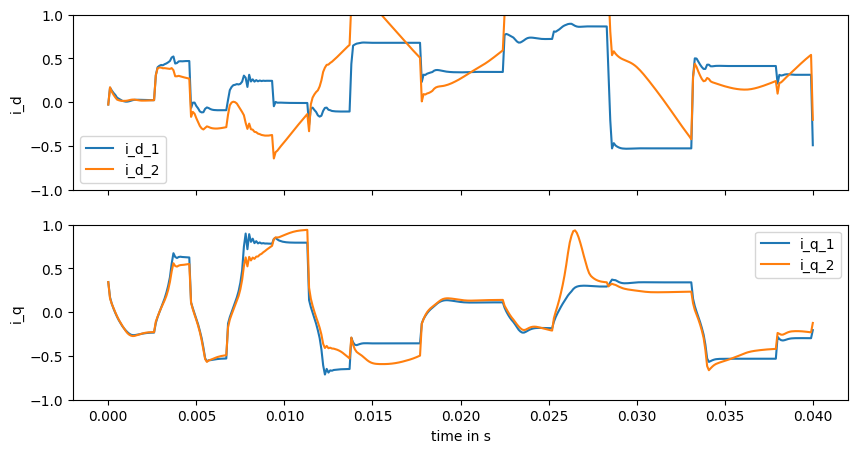

 42%|████▏     | 41969/100000 [01:18<01:23, 694.80it/s]

Current val_loss: 0.04948065


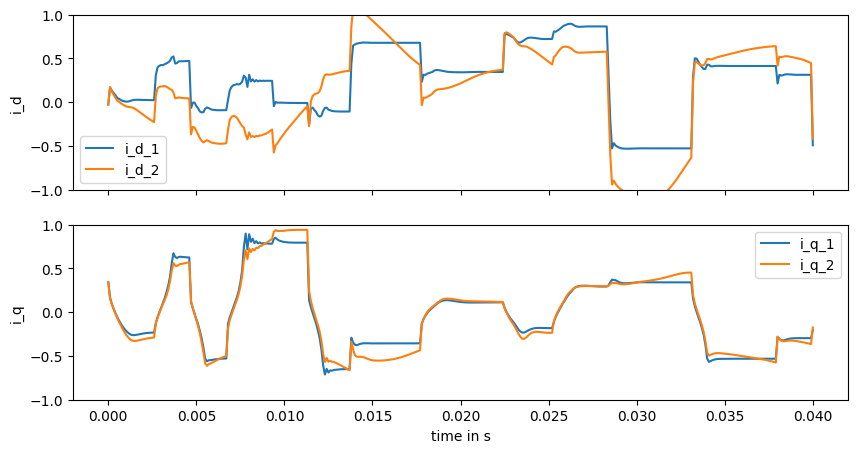

 44%|████▍     | 43995/100000 [01:21<01:21, 684.10it/s]

Current val_loss: 0.059917077


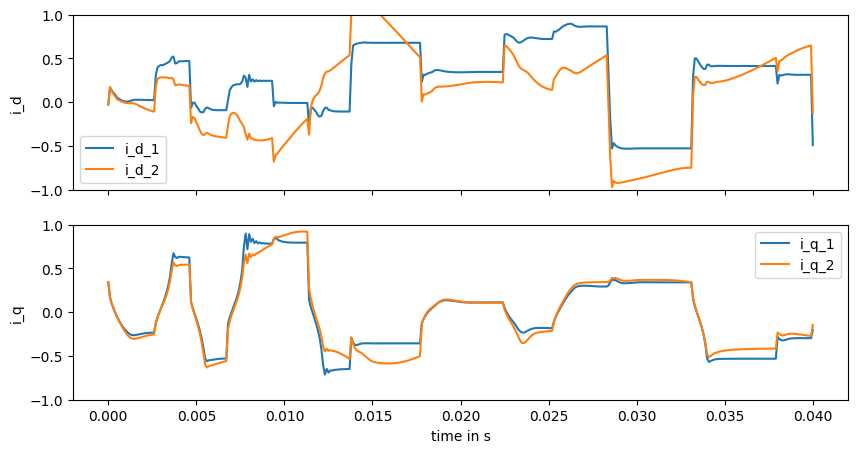

 46%|████▌     | 45957/100000 [01:24<01:17, 701.70it/s]

Current val_loss: 0.16182826


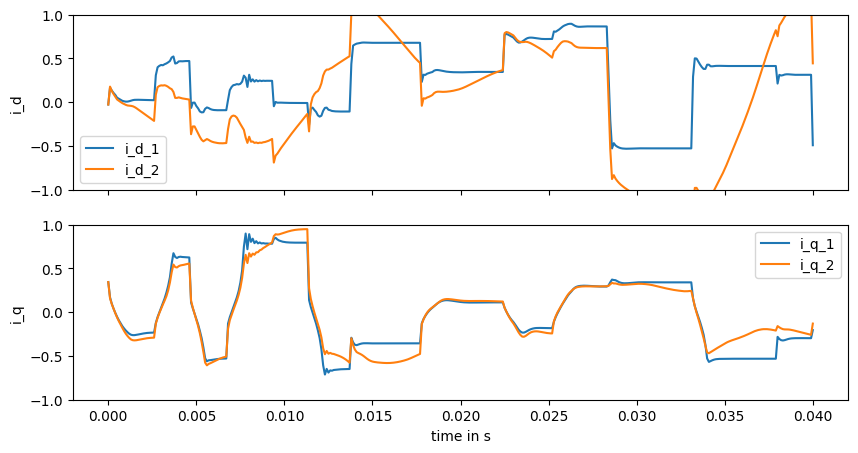

 48%|████▊     | 47964/100000 [01:28<01:18, 659.63it/s]

Current val_loss: 0.12440042


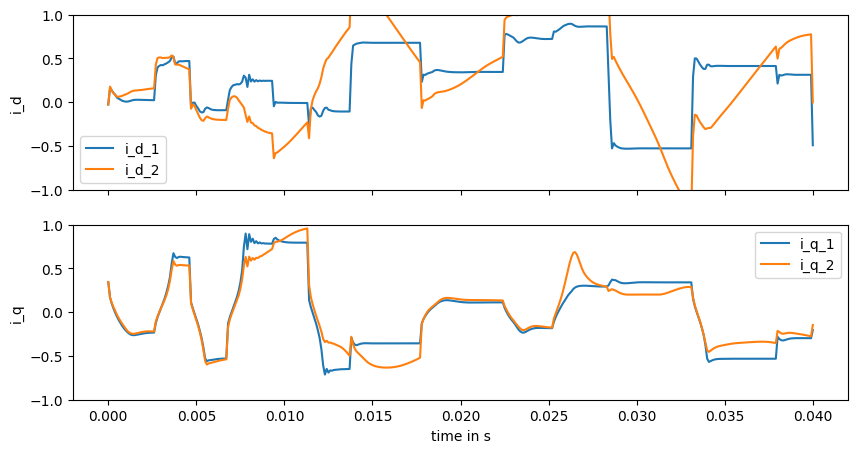

 50%|████▉     | 49969/100000 [01:31<01:11, 699.55it/s]

Current val_loss: 0.24120753


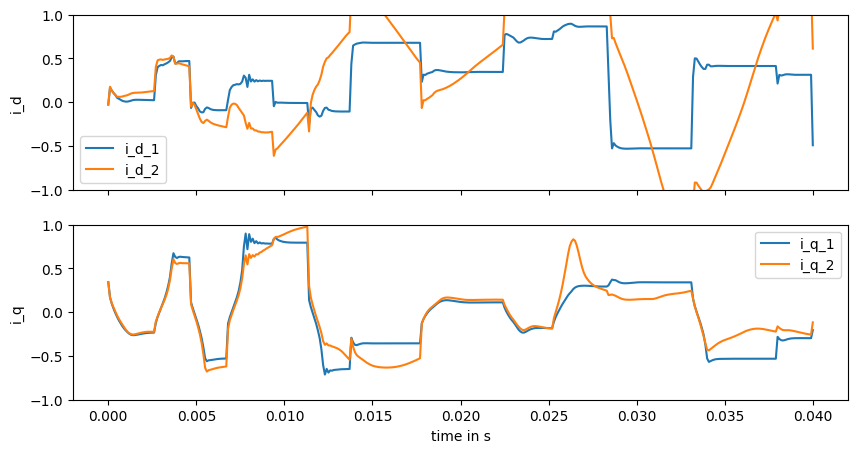

 52%|█████▏    | 51936/100000 [01:35<01:08, 700.32it/s]

Current val_loss: 0.13072835


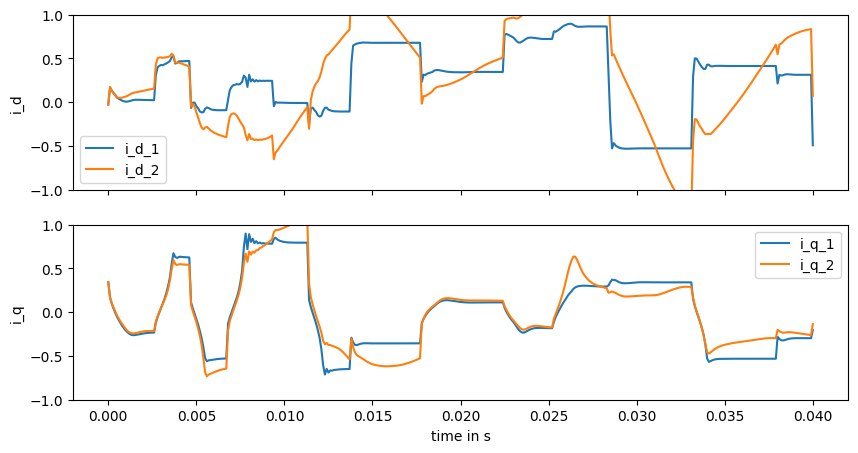

 54%|█████▍    | 53991/100000 [01:40<01:17, 591.87it/s]

Current val_loss: 0.075151965


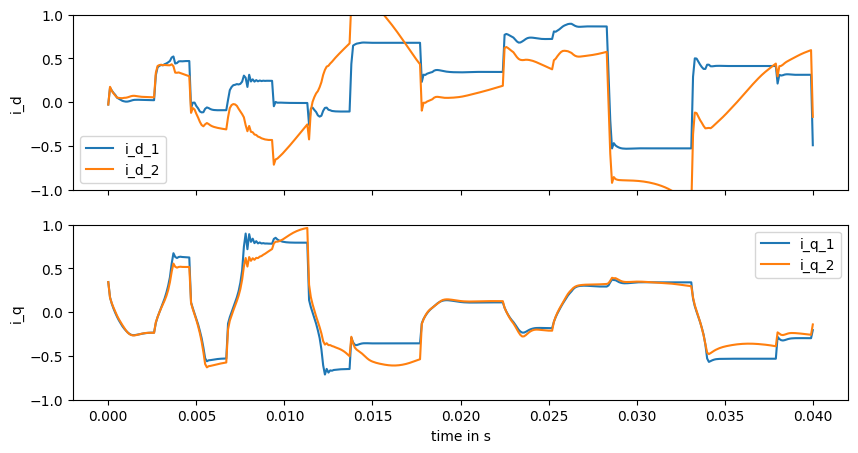

 56%|█████▌    | 55998/100000 [01:43<01:03, 698.41it/s]

Current val_loss: 0.2995348


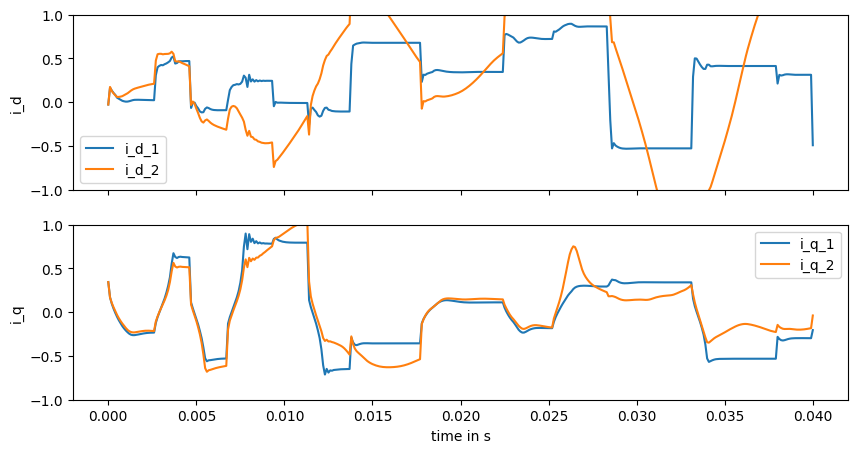

 58%|█████▊    | 57946/100000 [01:46<01:00, 697.13it/s]

Current val_loss: 0.061940588


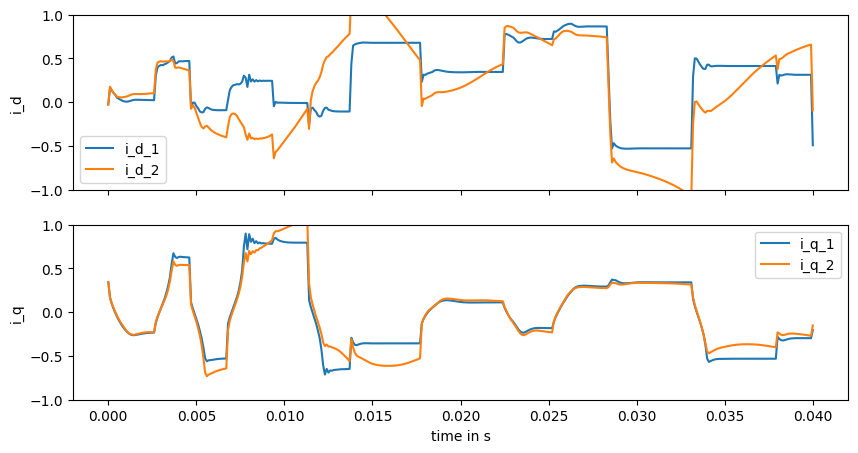

 60%|█████▉    | 59930/100000 [01:50<00:56, 704.37it/s]

Current val_loss: 0.15690401


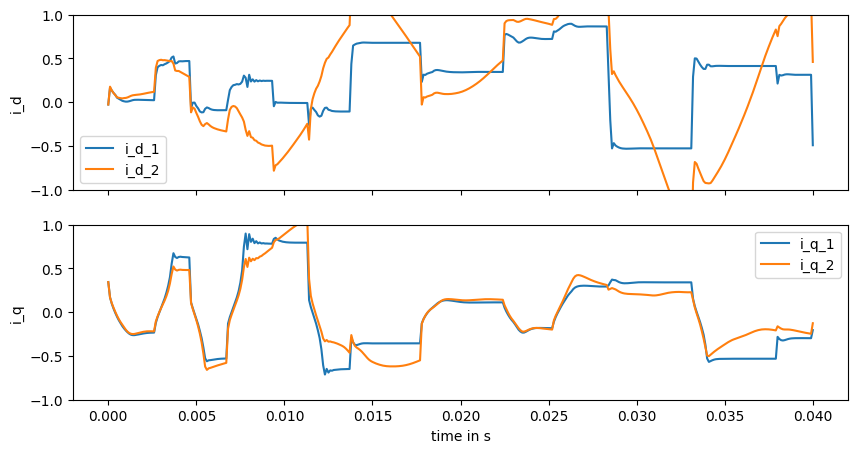

 62%|██████▏   | 61978/100000 [01:53<00:53, 706.67it/s]

Current val_loss: 0.27426273


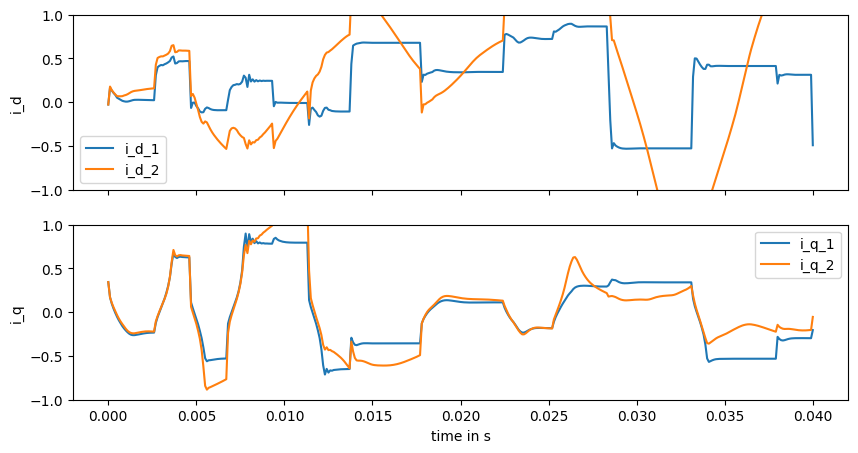

 64%|██████▍   | 63970/100000 [01:56<00:51, 699.24it/s]

Current val_loss: 0.08125545


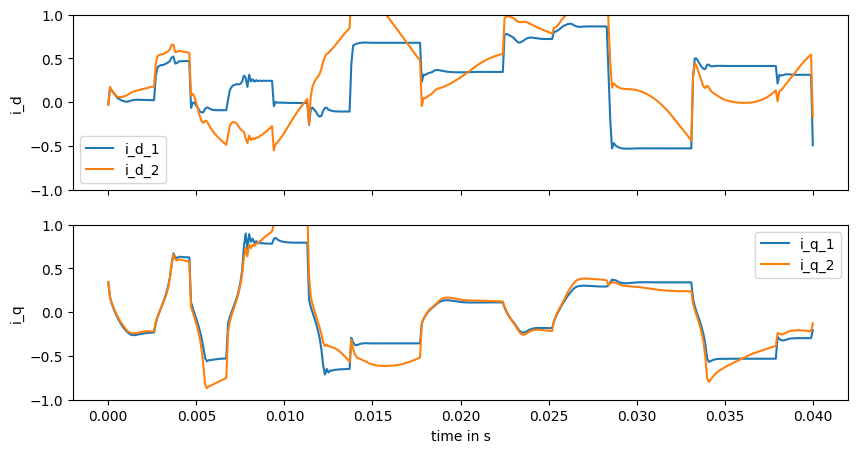

 66%|██████▌   | 65956/100000 [01:59<00:48, 705.18it/s]

Current val_loss: 0.20974548


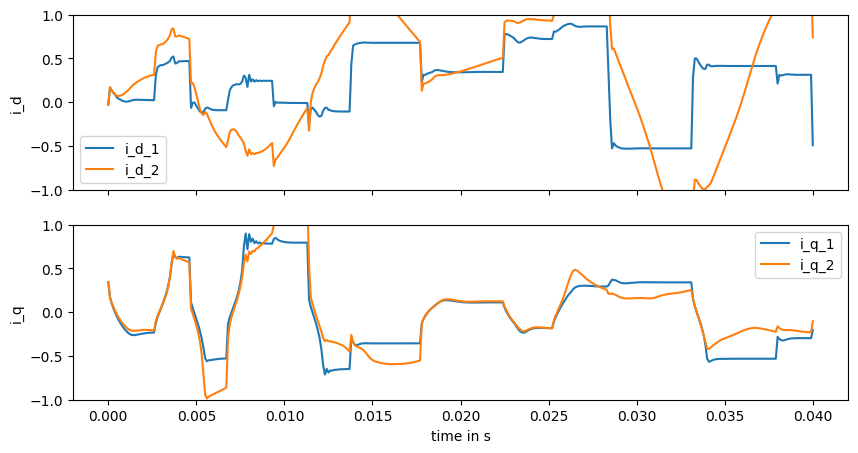

 68%|██████▊   | 67936/100000 [02:03<00:46, 696.74it/s]

Current val_loss: 0.36246186


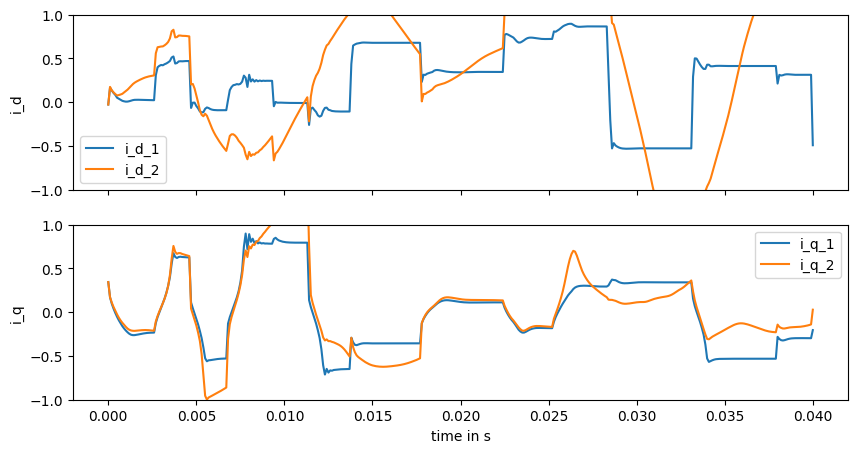

 70%|██████▉   | 69976/100000 [02:06<00:42, 707.89it/s]

Current val_loss: 0.08213364


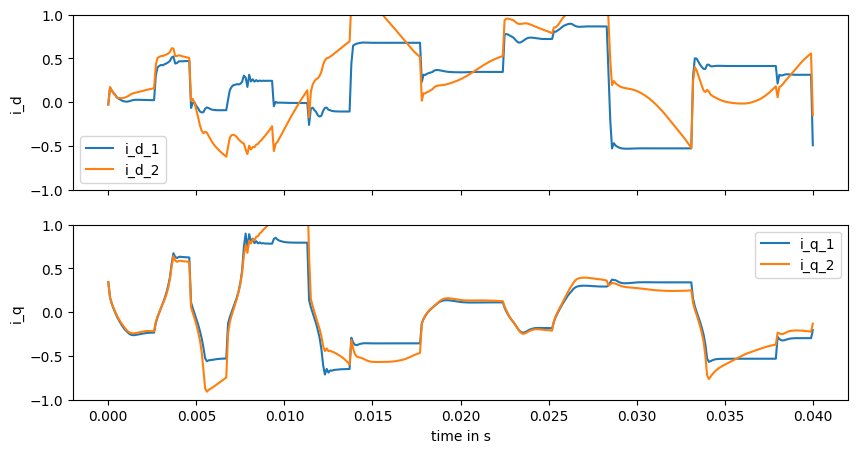

 72%|███████▏  | 71975/100000 [02:09<00:39, 710.85it/s]

Current val_loss: 0.3542835


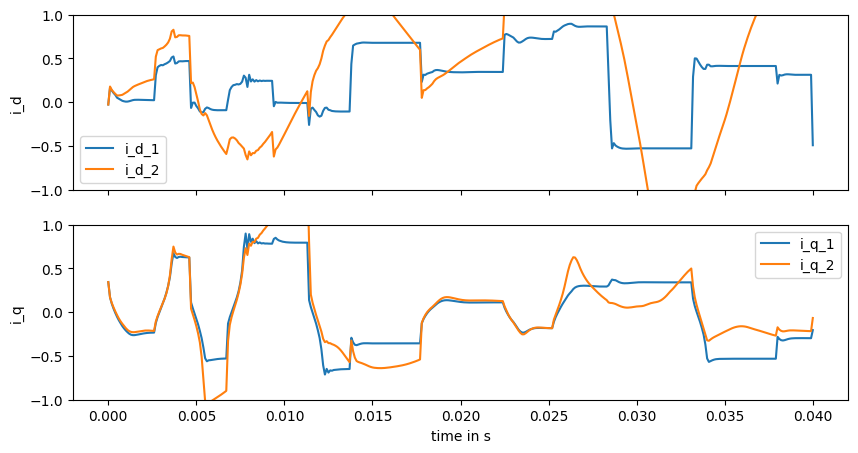

 74%|███████▍  | 73992/100000 [02:13<00:36, 718.14it/s]

Current val_loss: 0.4786286


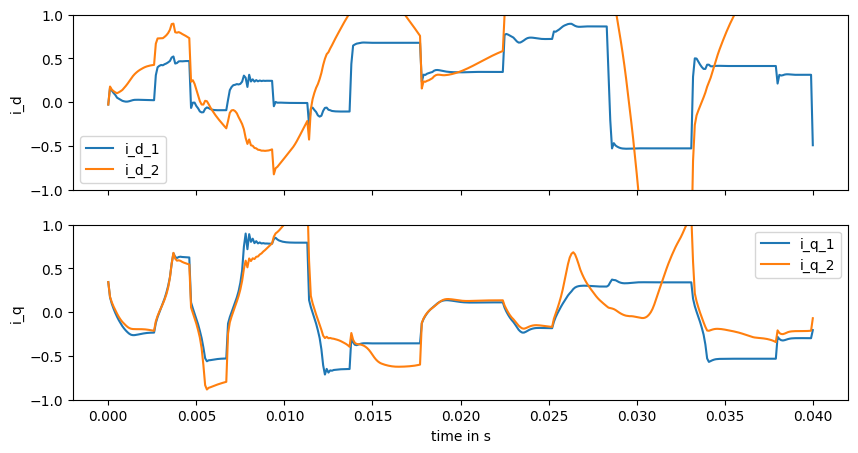

 76%|███████▌  | 75939/100000 [02:16<00:33, 716.34it/s]

Current val_loss: 0.14807338


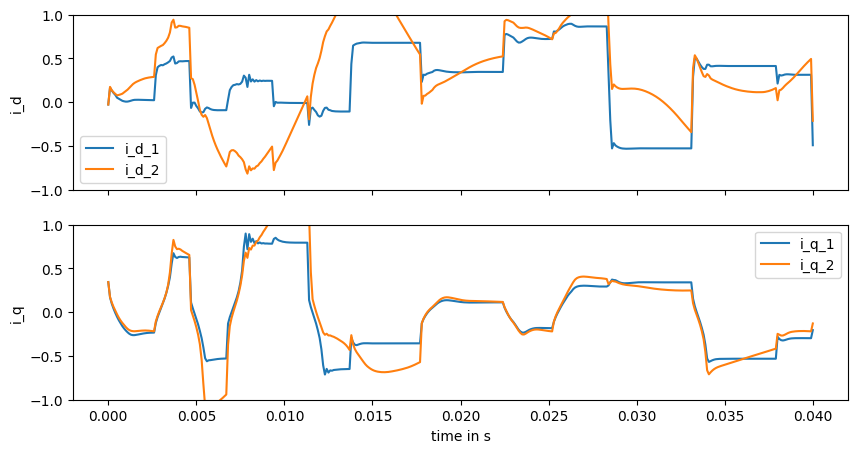

 78%|███████▊  | 77974/100000 [02:19<00:30, 716.64it/s]

Current val_loss: 0.48186028


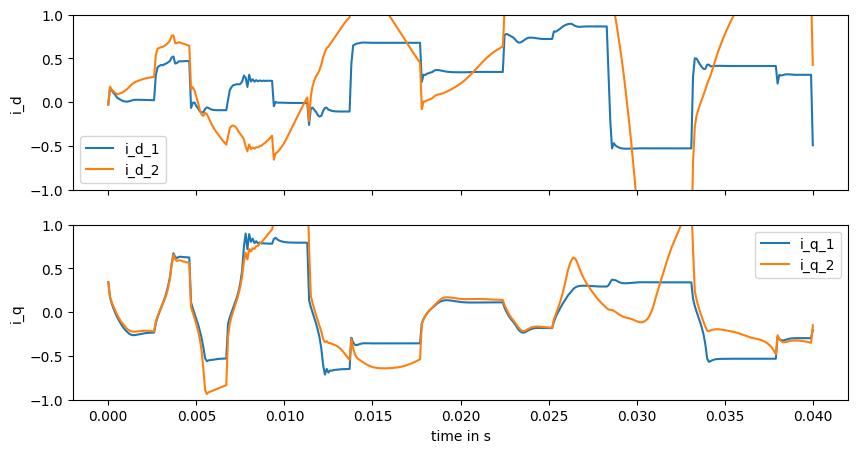

 80%|███████▉  | 79994/100000 [02:22<00:27, 715.11it/s]

Current val_loss: 0.06912462


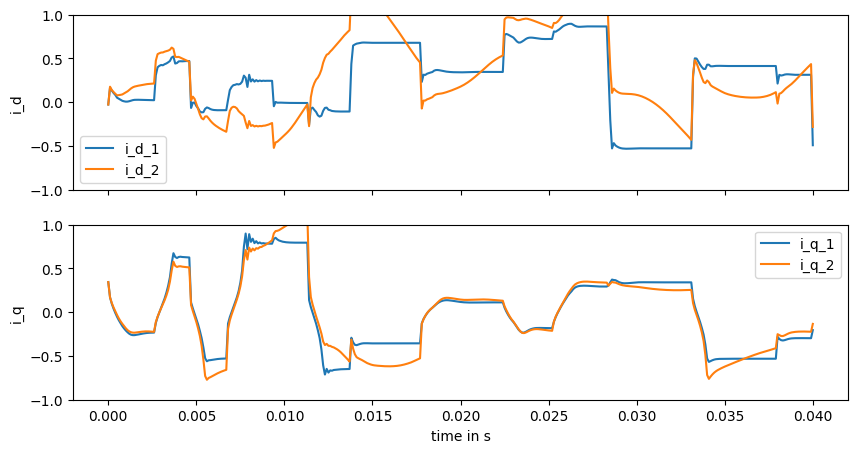

 82%|████████▏ | 81954/100000 [02:26<00:25, 717.66it/s]

Current val_loss: 0.19570109


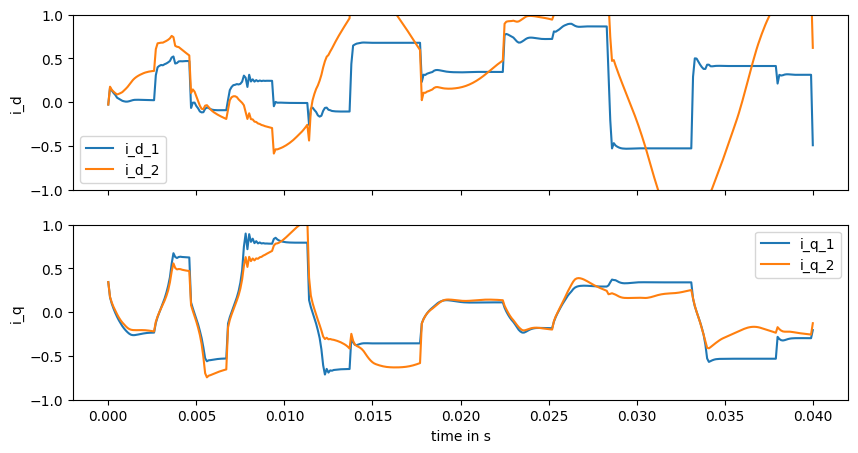

 84%|████████▍ | 83988/100000 [02:29<00:22, 716.29it/s]

Current val_loss: 0.49763784


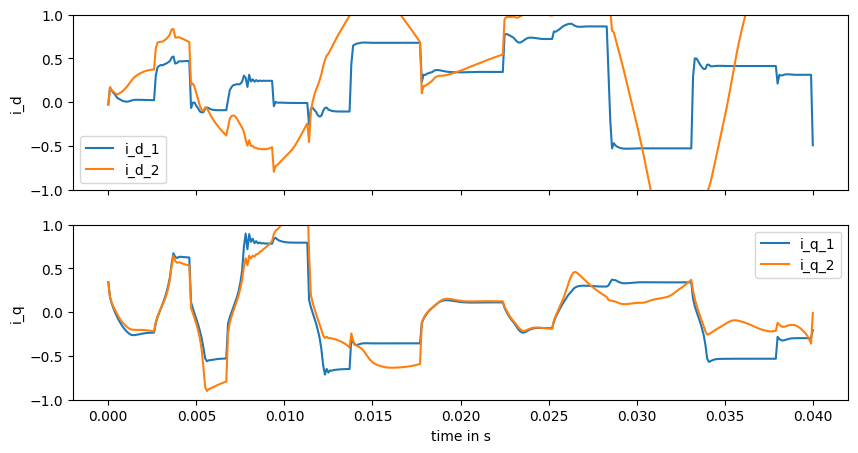

 86%|████████▌ | 85977/100000 [02:32<00:23, 606.01it/s]

Current val_loss: 0.3442561


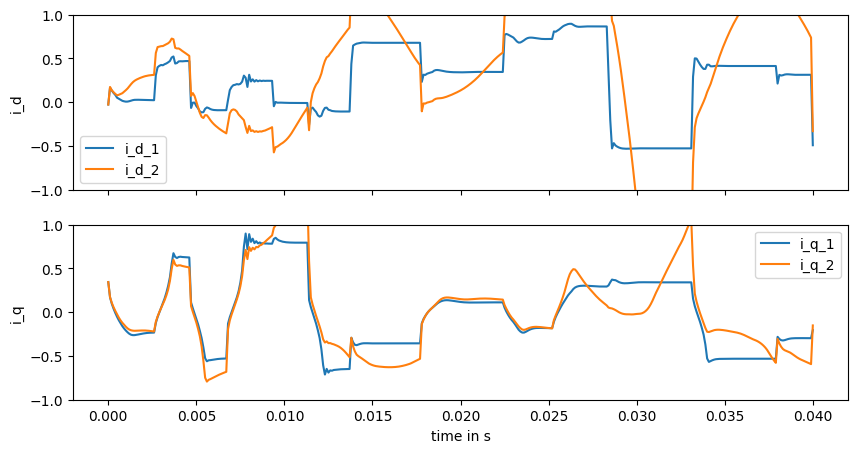

 88%|████████▊ | 87955/100000 [02:36<00:16, 715.53it/s]

Current val_loss: 0.06784828


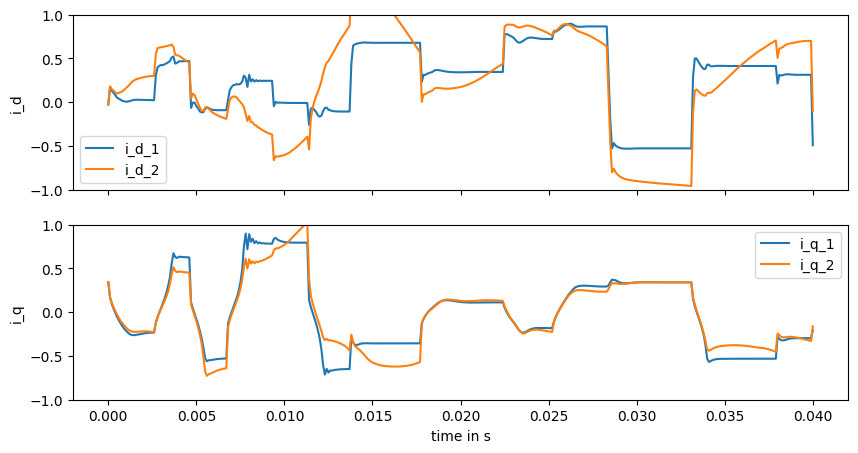

 90%|████████▉ | 89953/100000 [02:39<00:16, 607.72it/s]

Current val_loss: 0.094791606


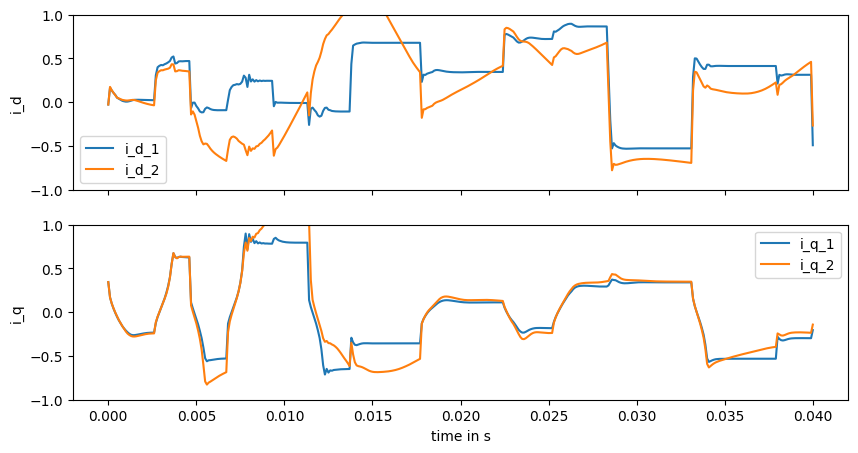

 92%|█████████▏| 91959/100000 [02:43<00:11, 712.63it/s]

Current val_loss: 0.42734286


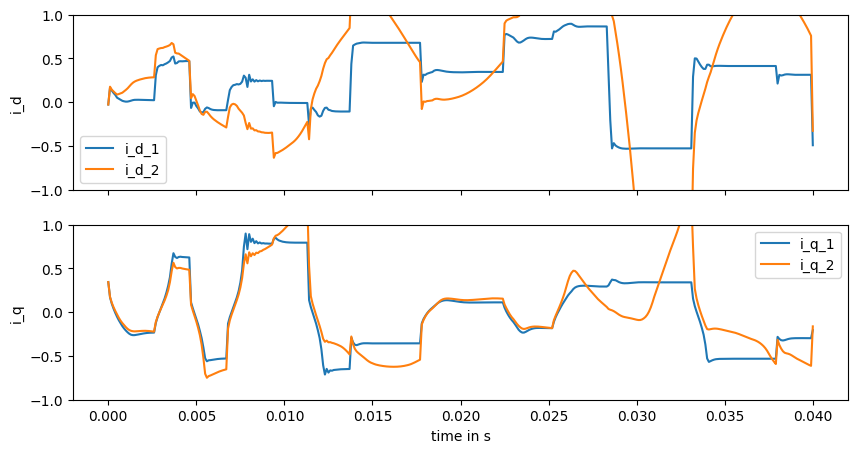

 94%|█████████▍| 93979/100000 [02:46<00:08, 713.51it/s]

Current val_loss: 0.5451639


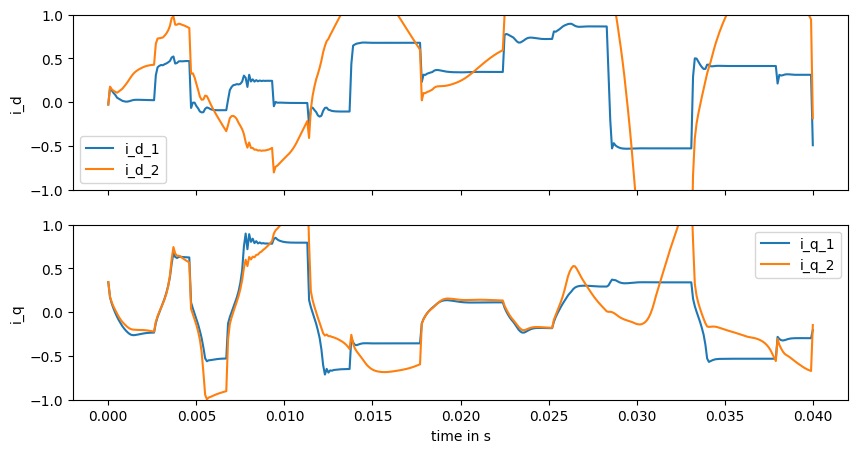

 96%|█████████▌| 95975/100000 [02:49<00:05, 706.86it/s]

Current val_loss: 1.0823212


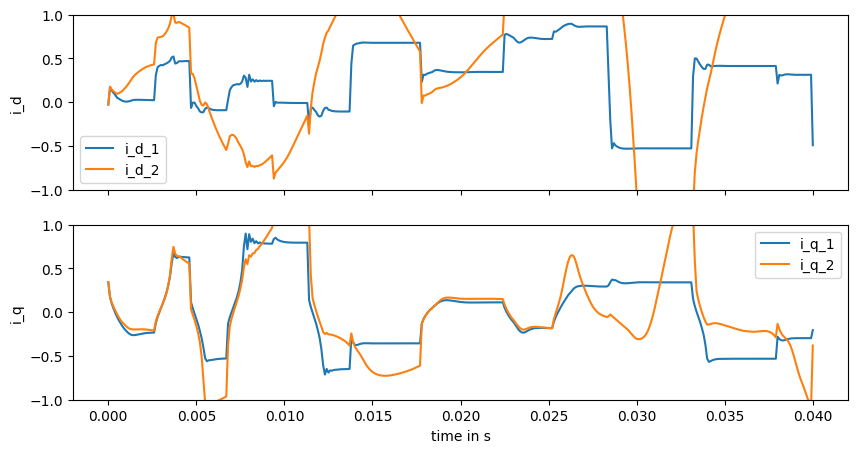

 98%|█████████▊| 97983/100000 [02:53<00:03, 604.61it/s]

Current val_loss: 0.37624642


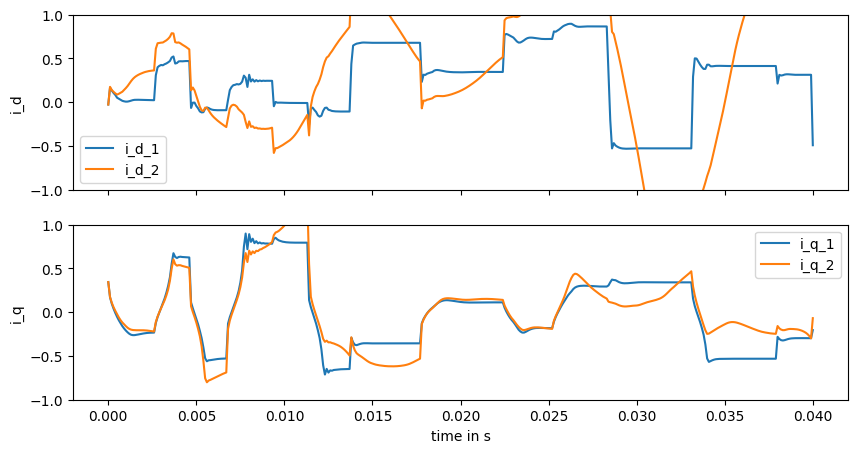

100%|██████████| 100000/100000 [02:56<00:00, 566.23it/s]


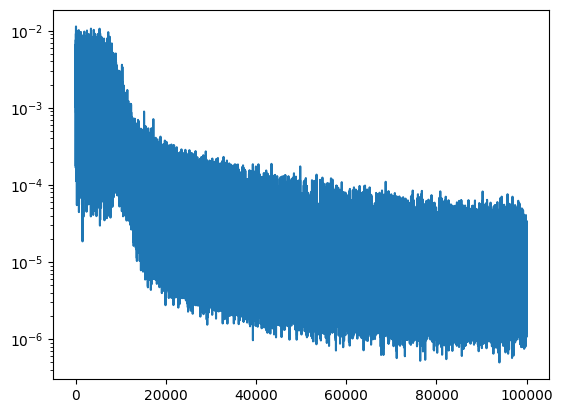

In [38]:
fin_node_1,fin_opt_state,fin_keys,losses, val_losses=mtrainer.fit_non_jit(node,opt_state,keys,plot_every=2000)
plt.plot(losses)
plt.yscale('log')

In [43]:
batch_size=100
mtrainer=ModelTrainer(
    train_steps=100_000,
    batch_size=batch_size,
    sequence_len=100,
    featurize=featurize_node,
    train_data_gen_sin=data_gen_single,
    val_data_gen_sin= val_data_gen_single,
    model_optimizer=optimizer_node,
    tau= motor_env.tau
    )
keys=jax.vmap(jax.random.PRNGKey)(np.random.randint(0, 2**31, size=(batch_size,)))

  0%|          | 0/100000 [00:00<?, ?it/s]/home/olivers/.conda/envs/venv_proj/lib/python3.11/site-packages/jax/_src/numpy/lax_numpy.py:3042: UserWarning: Explicitly requested dtype float64 requested in asarray is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  start = asarray(start, dtype=computation_dtype)
/home/olivers/.conda/envs/venv_proj/lib/python3.11/site-packages/jax/_src/numpy/lax_numpy.py:3043: UserWarning: Explicitly requested dtype float64 requested in asarray is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  stop = asarray(stop, dtype=computation_dtype)
/home/olivers/.conda/envs/venv_proj/lib/python3.11/sit

Current val_loss: 0.09924405


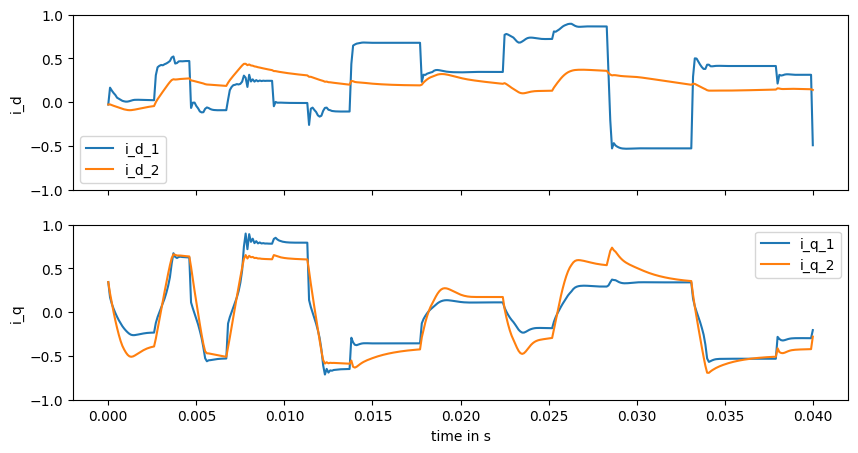

  4%|▍         | 4000/100000 [01:31<34:50, 45.91it/s]  

Current val_loss: 0.07126752


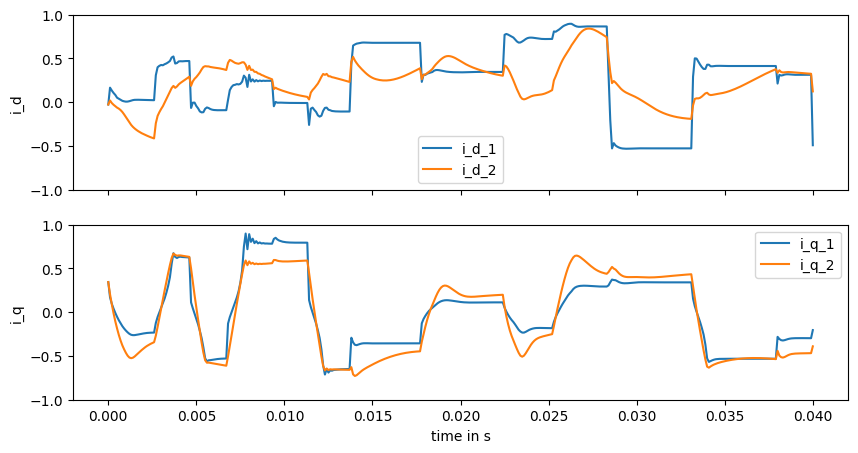

  6%|▌         | 6000/100000 [02:15<34:01, 46.04it/s]  

Current val_loss: 0.04900967


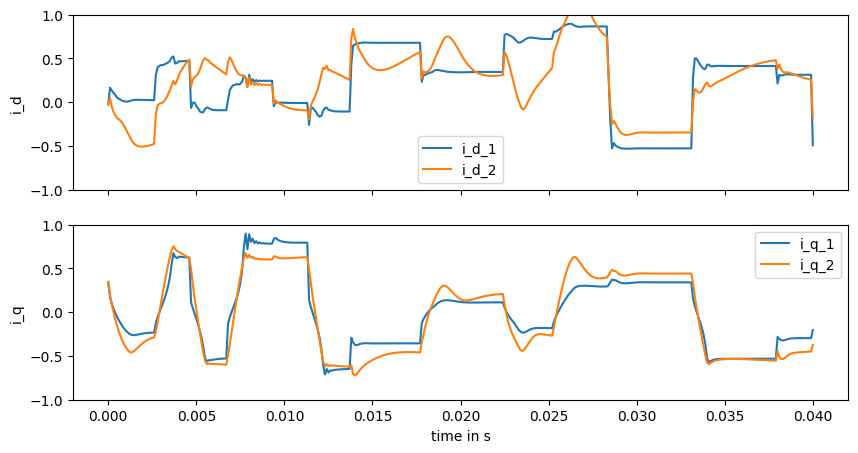

  8%|▊         | 8000/100000 [02:59<33:09, 46.23it/s]  

Current val_loss: 0.03799289


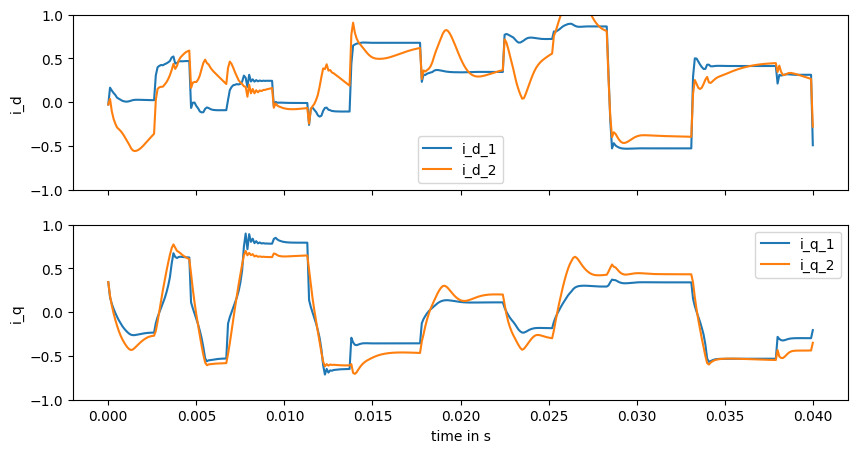

 10%|█         | 10000/100000 [03:43<32:33, 46.07it/s] 

Current val_loss: 0.02892793


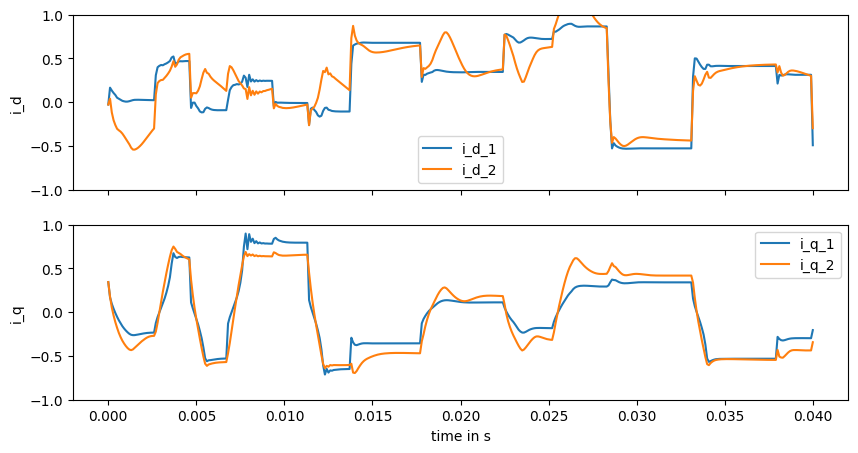

 12%|█▏        | 12000/100000 [04:28<31:53, 46.00it/s]  

Current val_loss: 0.021574682


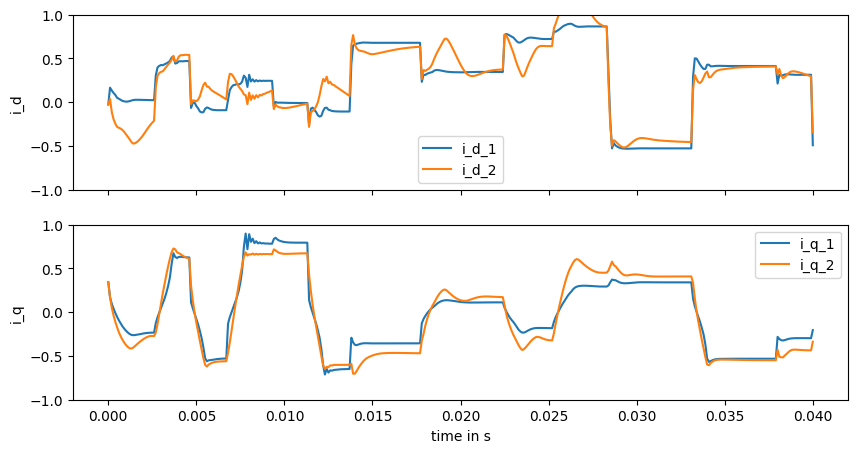

 14%|█▍        | 14000/100000 [05:12<31:17, 45.80it/s]  

Current val_loss: 0.016669584


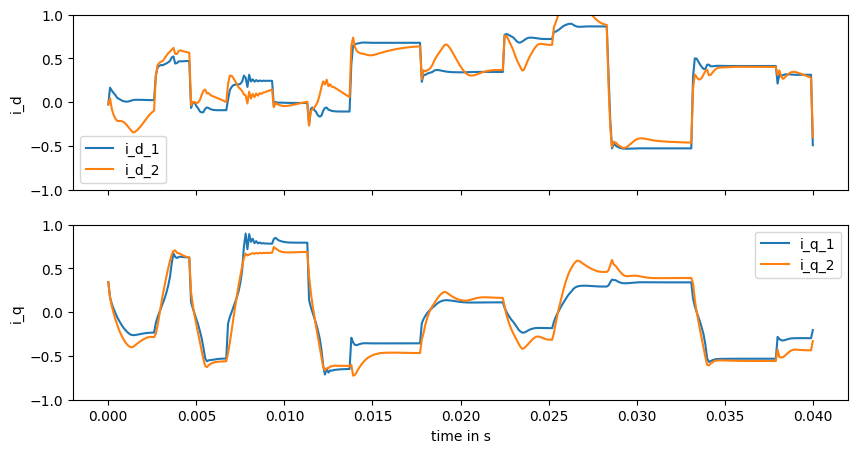

 16%|█▌        | 16000/100000 [05:56<30:43, 45.57it/s]  

Current val_loss: 0.012839001


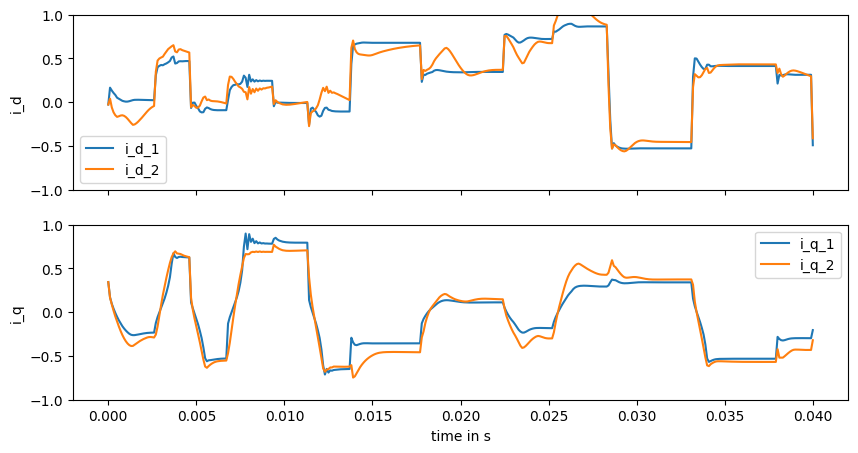

 18%|█▊        | 18000/100000 [06:40<29:38, 46.11it/s]  

Current val_loss: 0.010481027


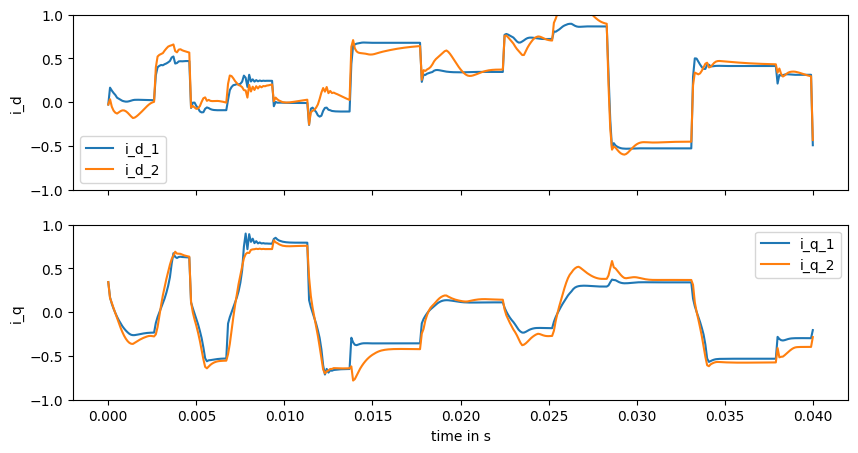

 20%|██        | 20000/100000 [07:28<31:40, 42.10it/s]  

Current val_loss: 0.007876619


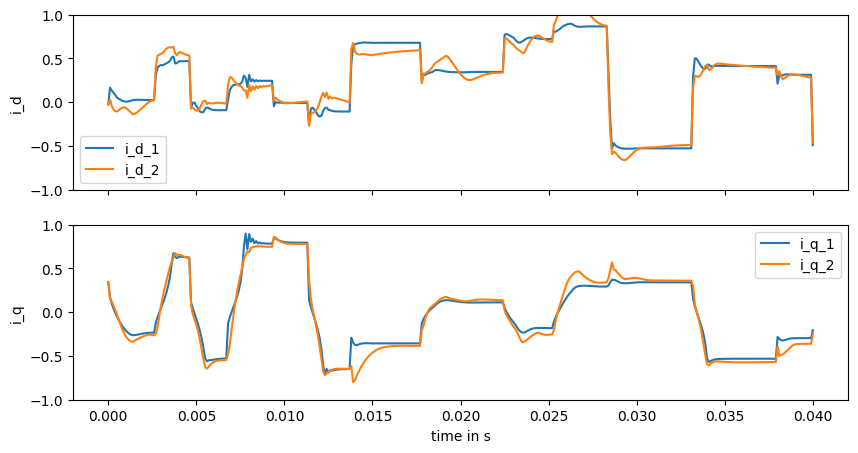

 22%|██▏       | 22000/100000 [08:16<31:42, 41.00it/s]  

Current val_loss: 0.0068021594


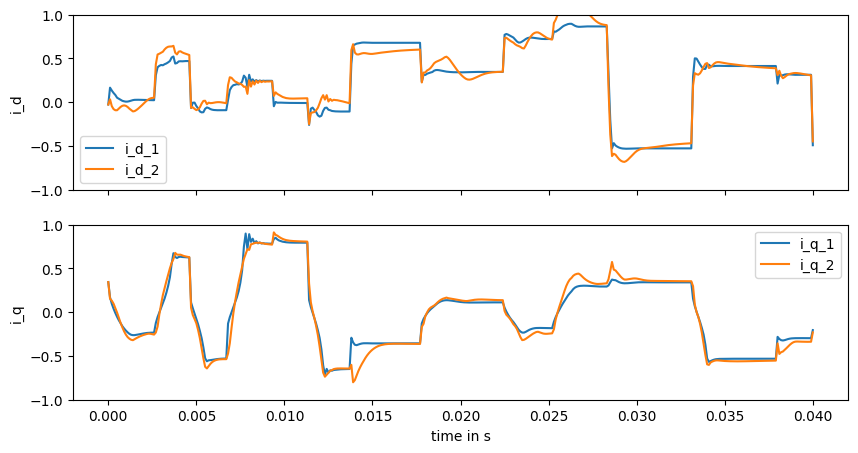

 24%|██▍       | 24000/100000 [09:04<29:57, 42.28it/s]  

Current val_loss: 0.006328344


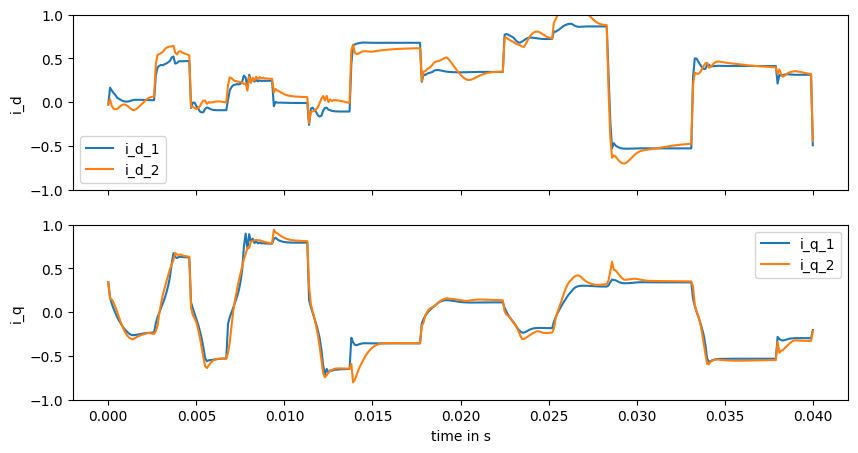

 26%|██▌       | 26000/100000 [09:50<26:40, 46.22it/s]  

Current val_loss: 0.0056263874


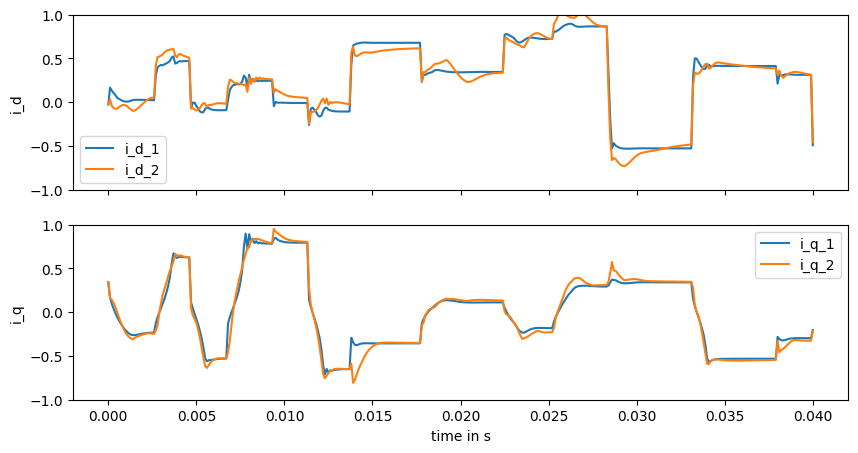

 28%|██▊       | 28000/100000 [10:34<26:03, 46.05it/s]  

Current val_loss: 0.0054431916


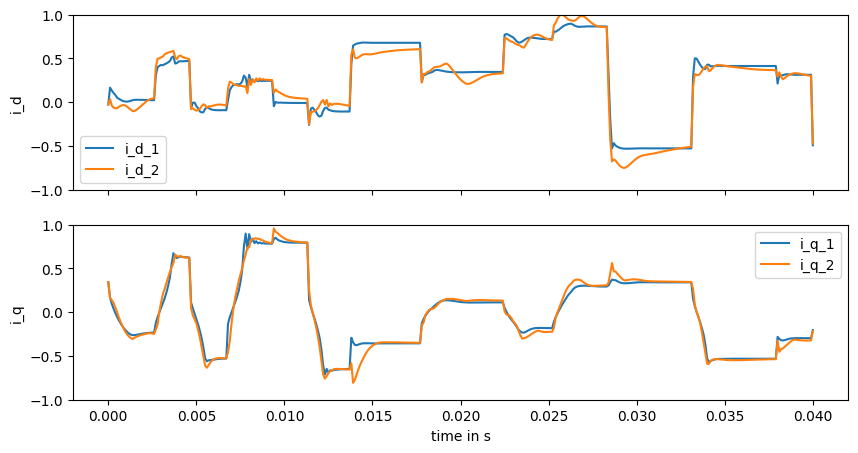

 30%|███       | 30000/100000 [11:18<25:28, 45.80it/s]  

Current val_loss: 0.0054285866


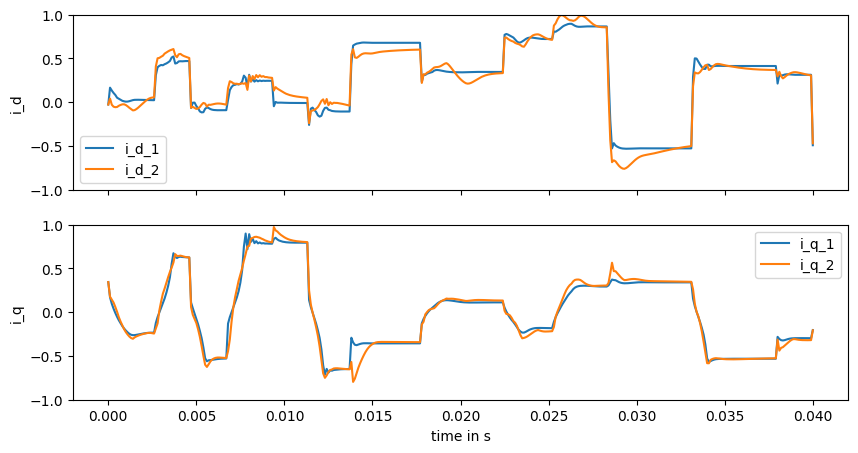

 32%|███▏      | 32000/100000 [12:06<26:52, 42.17it/s]

Current val_loss: 0.0052022925


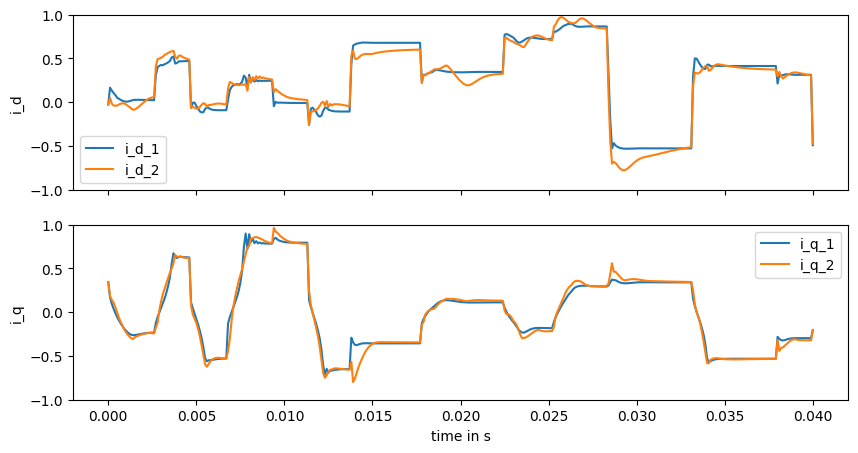

 34%|███▍      | 34000/100000 [12:54<26:06, 42.15it/s]  

Current val_loss: 0.0051588197


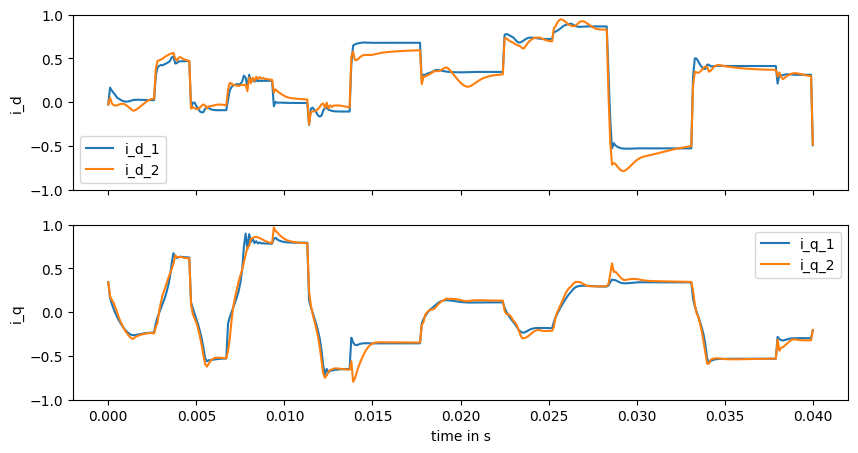

 36%|███▌      | 36000/100000 [13:42<25:18, 42.15it/s]

Current val_loss: 0.004807383


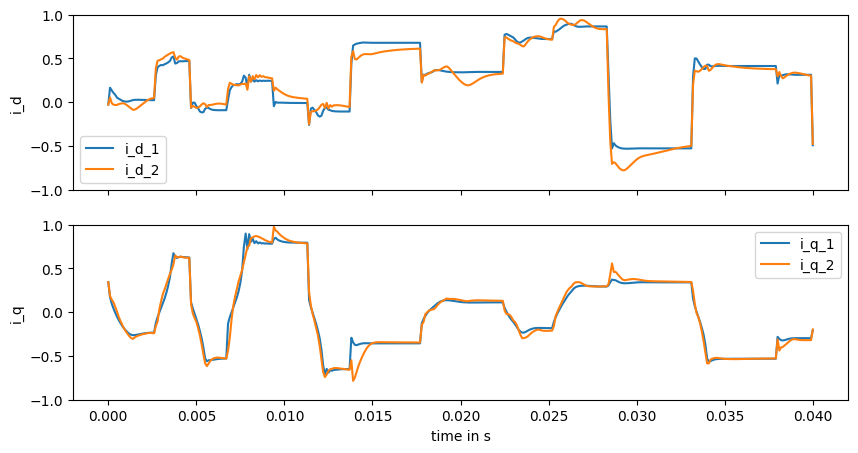

 38%|███▊      | 38000/100000 [14:30<24:27, 42.25it/s]

Current val_loss: 0.0048587634


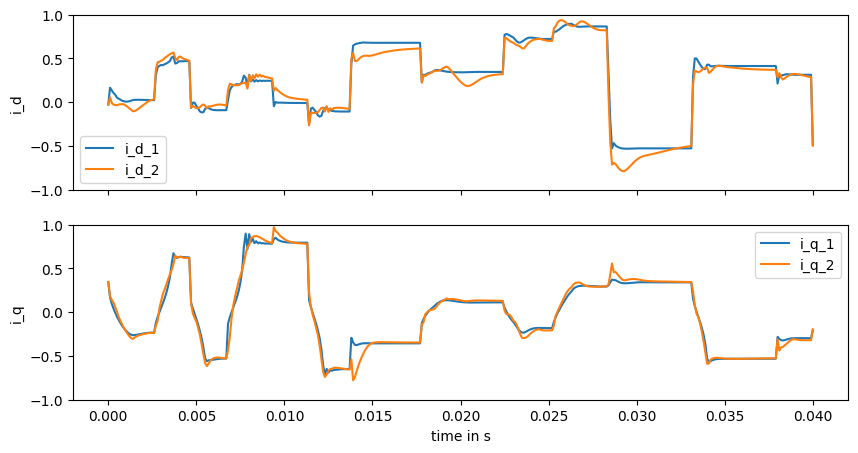

 40%|████      | 40000/100000 [15:18<23:43, 42.15it/s]

Current val_loss: 0.004468311


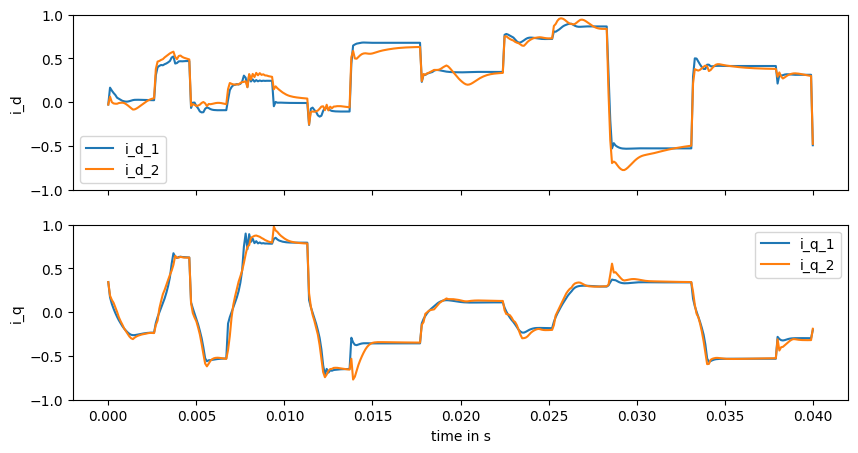

 42%|████▏     | 42000/100000 [16:02<21:03, 45.89it/s]

Current val_loss: 0.004529148


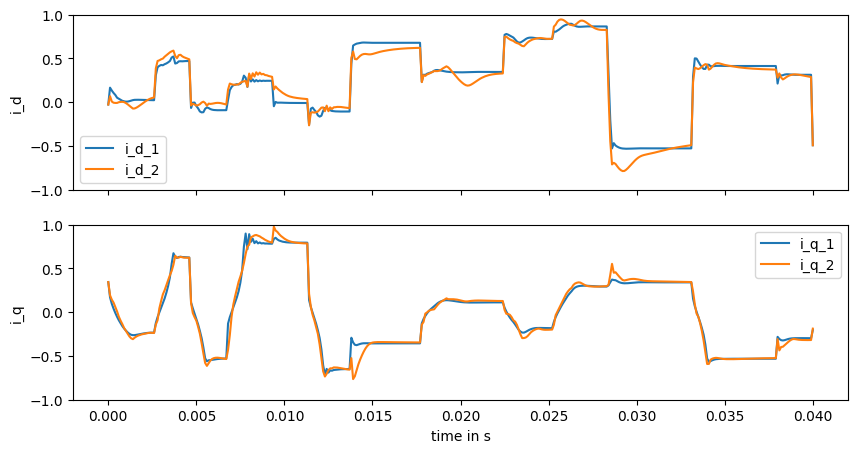

 44%|████▍     | 44000/100000 [16:46<20:13, 46.15it/s]

Current val_loss: 0.004931327


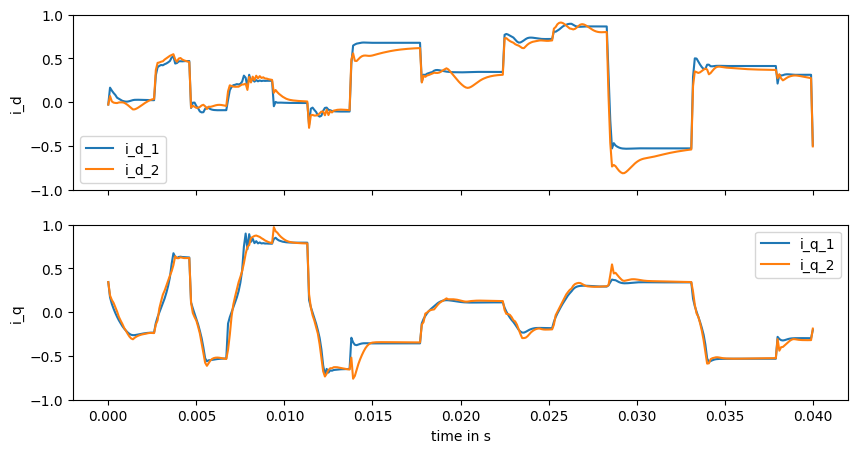

 46%|████▌     | 46000/100000 [17:30<19:25, 46.35it/s]

Current val_loss: 0.0042263954


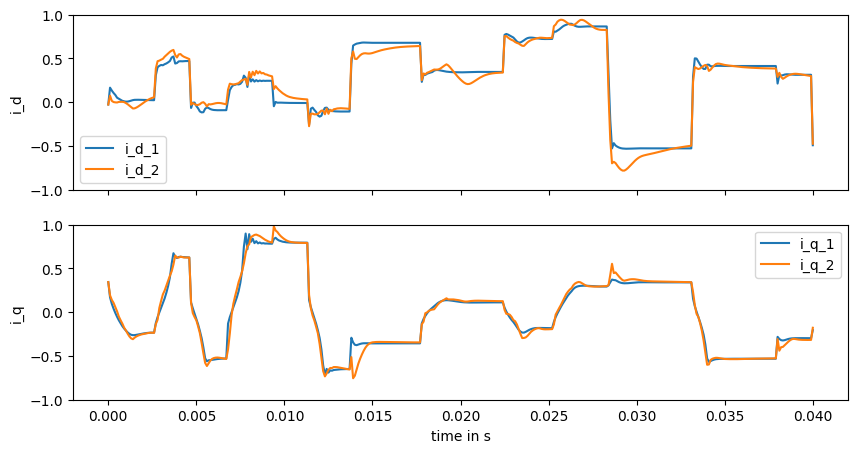

 48%|████▊     | 48000/100000 [18:14<18:40, 46.40it/s]

Current val_loss: 0.004124055


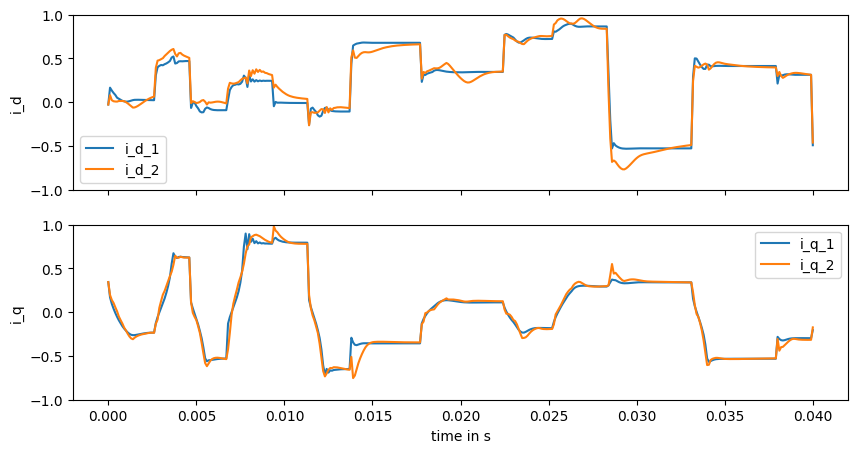

 50%|█████     | 50000/100000 [18:58<18:00, 46.28it/s]

Current val_loss: 0.0041457517


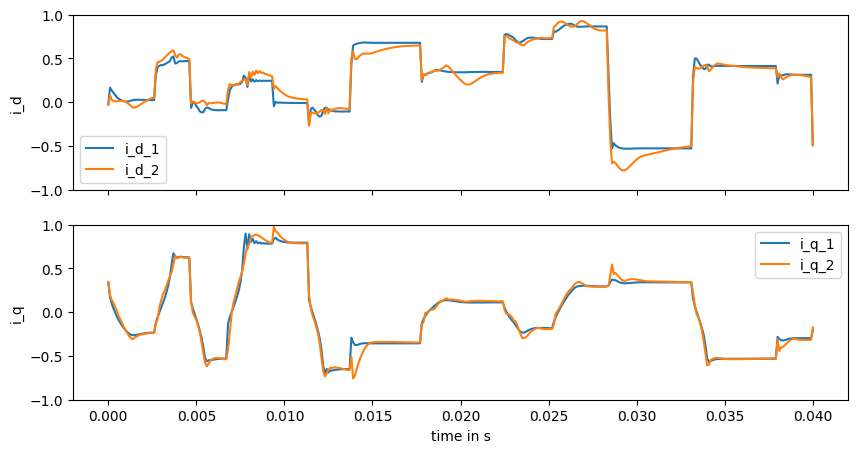

 52%|█████▏    | 52000/100000 [19:41<17:16, 46.29it/s]

Current val_loss: 0.0038989873


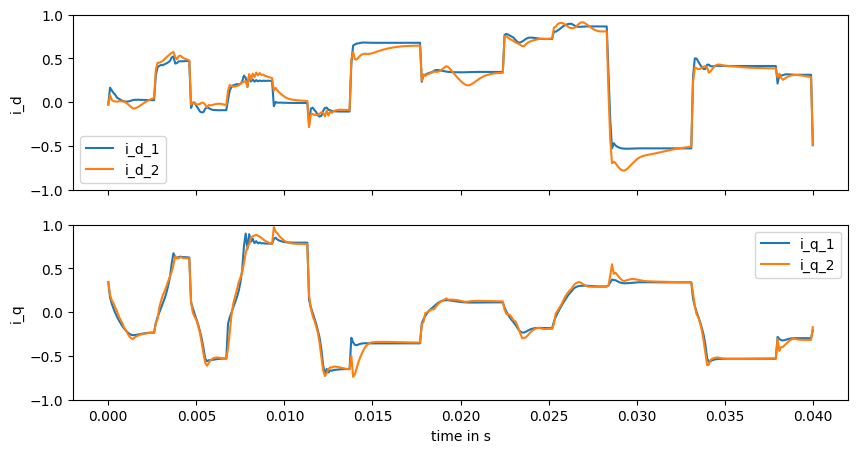

 54%|█████▍    | 54000/100000 [20:26<16:34, 46.23it/s]  

Current val_loss: 0.004091378


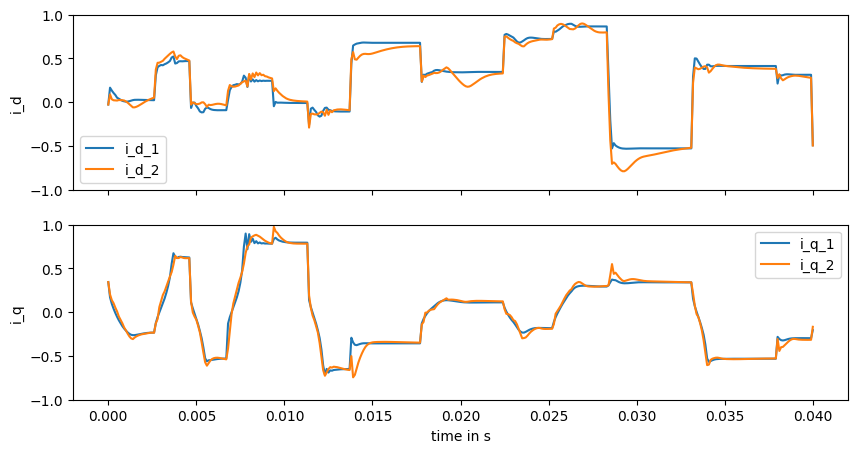

 56%|█████▌    | 56000/100000 [21:10<15:50, 46.29it/s]

Current val_loss: 0.0038824184


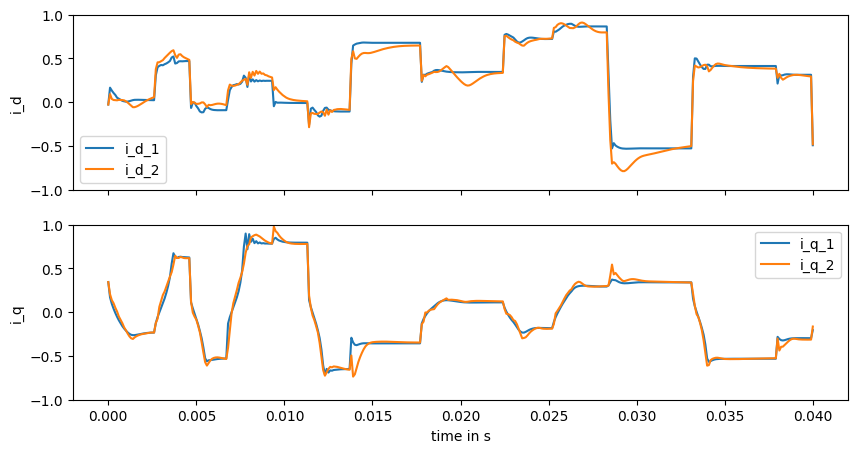

 58%|█████▊    | 58000/100000 [21:54<15:12, 46.03it/s]

Current val_loss: 0.004048602


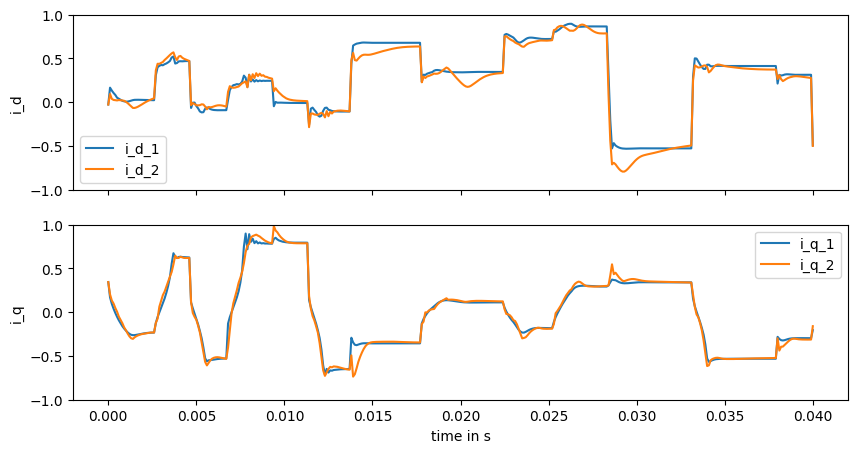

 60%|██████    | 60000/100000 [22:39<14:31, 45.92it/s]

Current val_loss: 0.0038513434


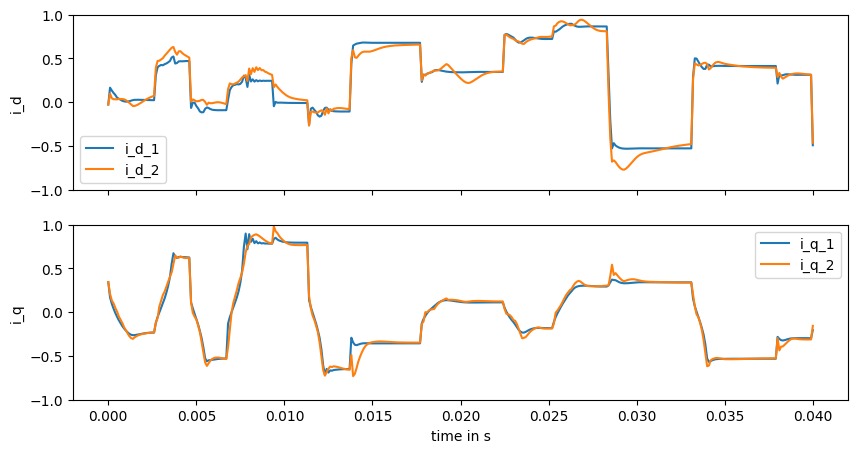

 62%|██████▏   | 62000/100000 [23:22<13:40, 46.31it/s]

Current val_loss: 0.003549245


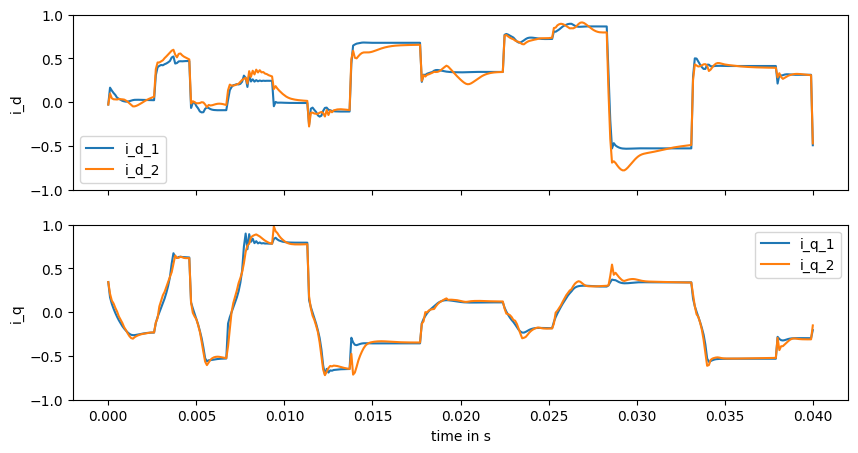

 64%|██████▍   | 64000/100000 [24:06<12:57, 46.28it/s]

Current val_loss: 0.0036457067


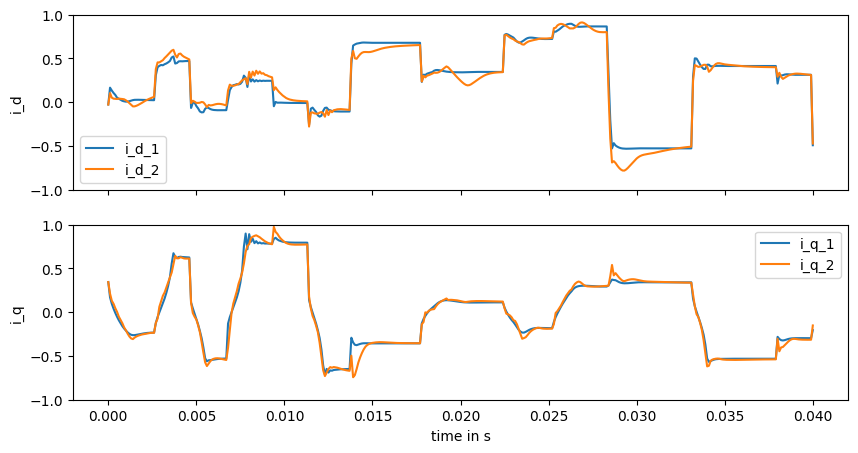

 66%|██████▌   | 66000/100000 [24:50<12:18, 46.02it/s]

Current val_loss: 0.0040448657


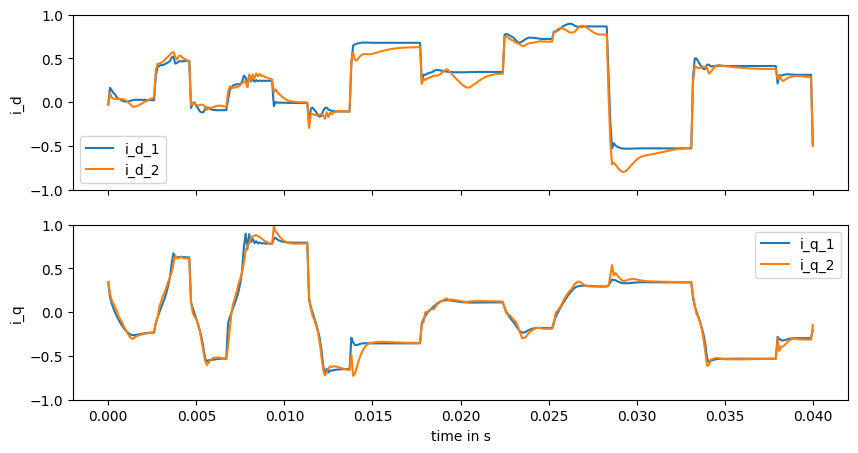

 68%|██████▊   | 68000/100000 [25:34<11:33, 46.12it/s]

Current val_loss: 0.0033651376


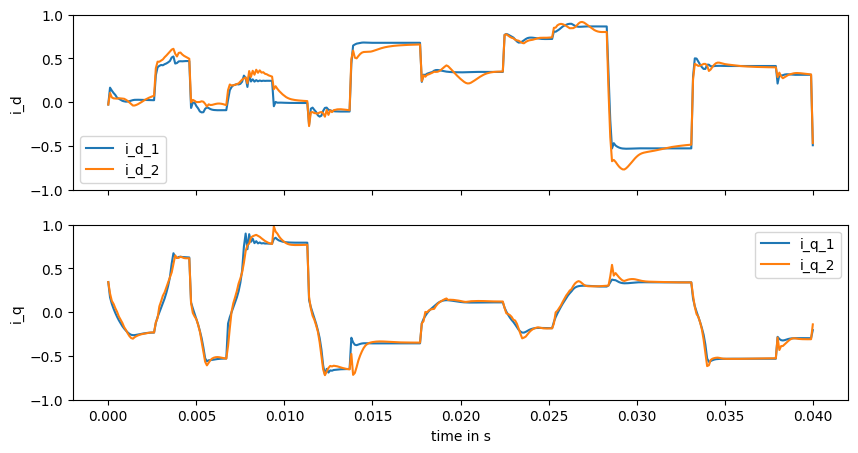

 70%|███████   | 70000/100000 [26:19<11:47, 42.38it/s]

Current val_loss: 0.003787114


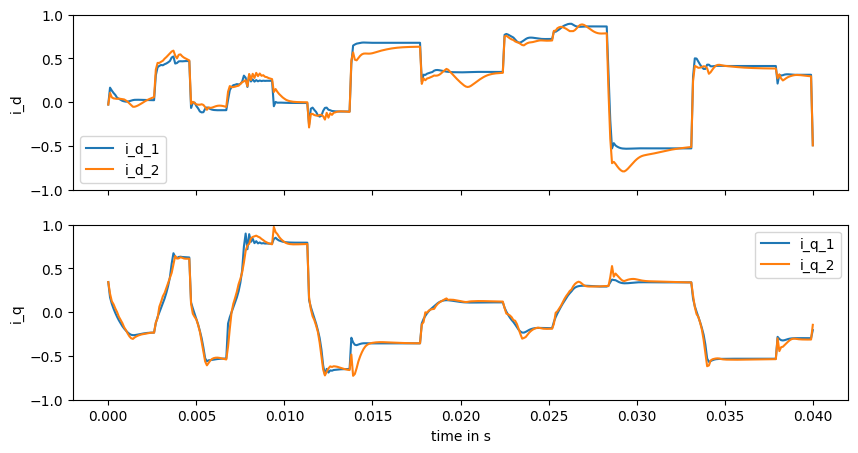

 72%|███████▏  | 72000/100000 [27:04<10:02, 46.48it/s]

Current val_loss: 0.003495918


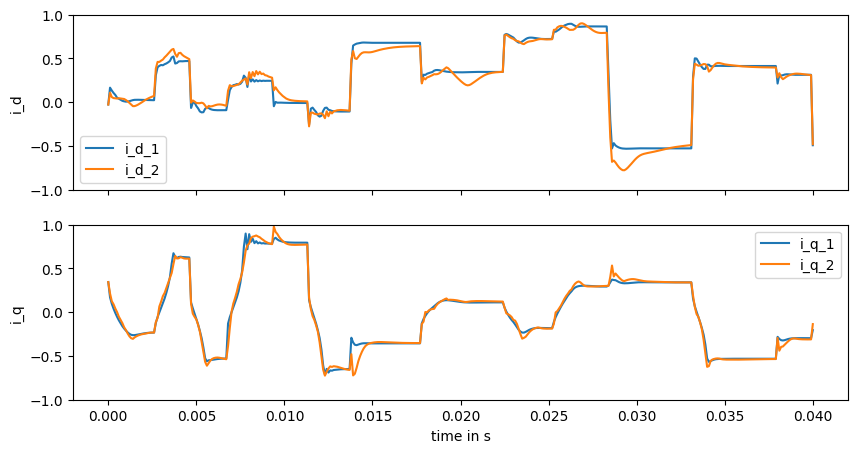

 74%|███████▍  | 74000/100000 [27:48<09:24, 46.09it/s]

Current val_loss: 0.0033403828


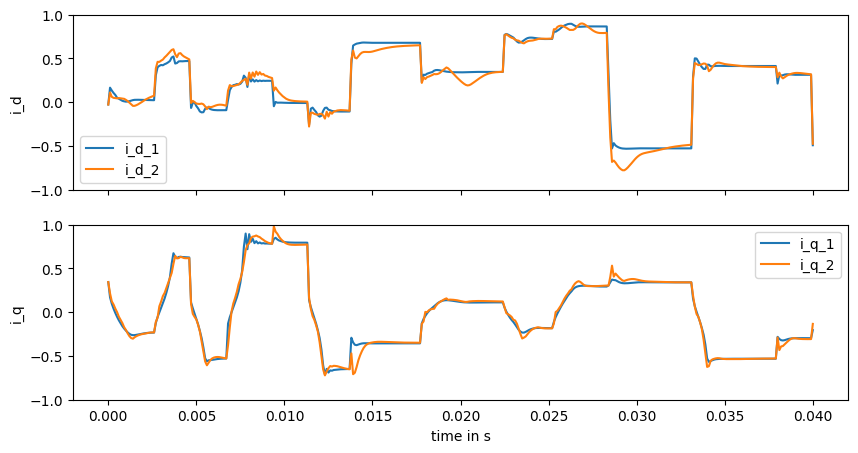

 76%|███████▌  | 76000/100000 [28:32<08:37, 46.35it/s]

Current val_loss: 0.003613579


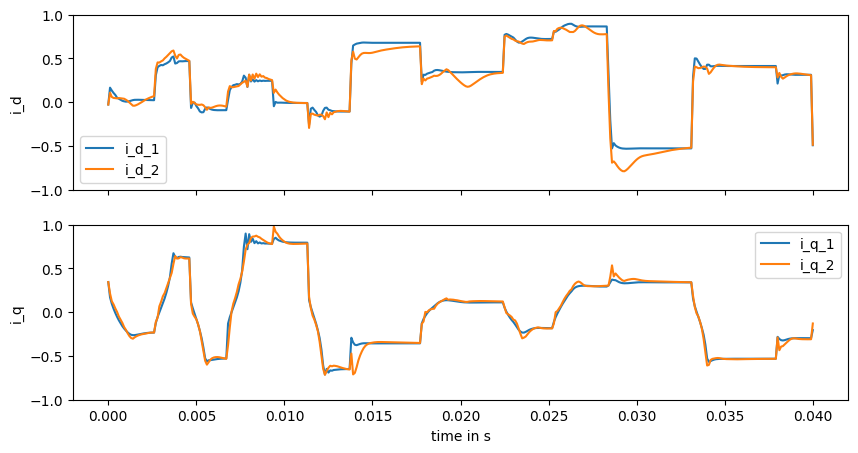

 78%|███████▊  | 78000/100000 [29:15<08:03, 45.53it/s]

Current val_loss: 0.0035482035


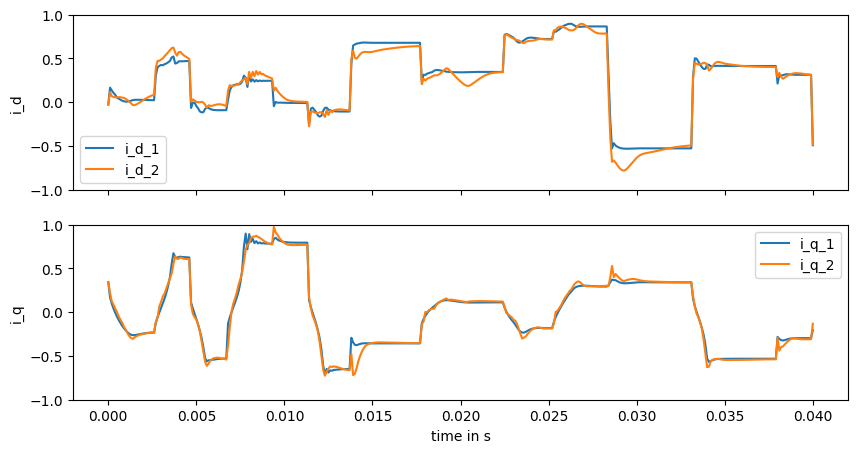

 80%|████████  | 80000/100000 [29:59<07:09, 46.62it/s]

Current val_loss: 0.0035261745


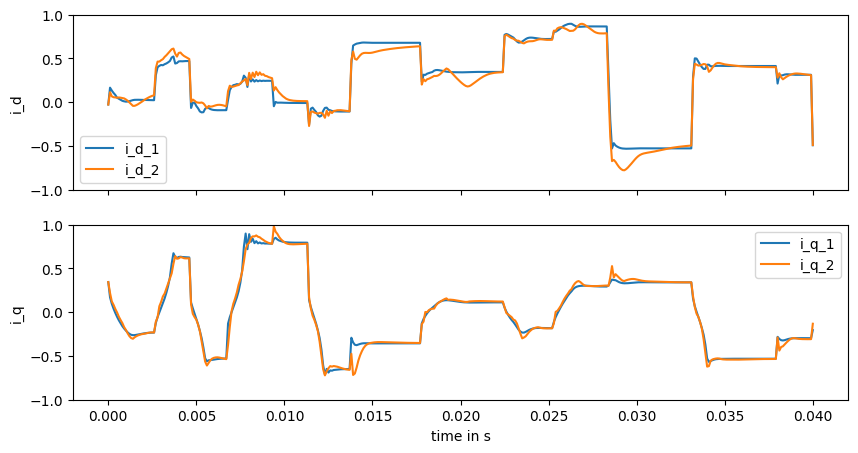

 82%|████████▏ | 82000/100000 [30:43<06:29, 46.27it/s]

Current val_loss: 0.0034311172


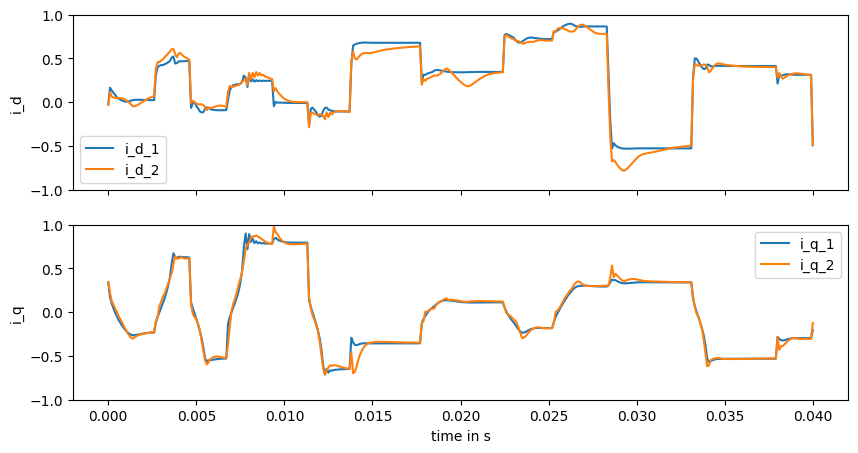

 84%|████████▍ | 84000/100000 [31:27<05:46, 46.23it/s]

Current val_loss: 0.0034169885


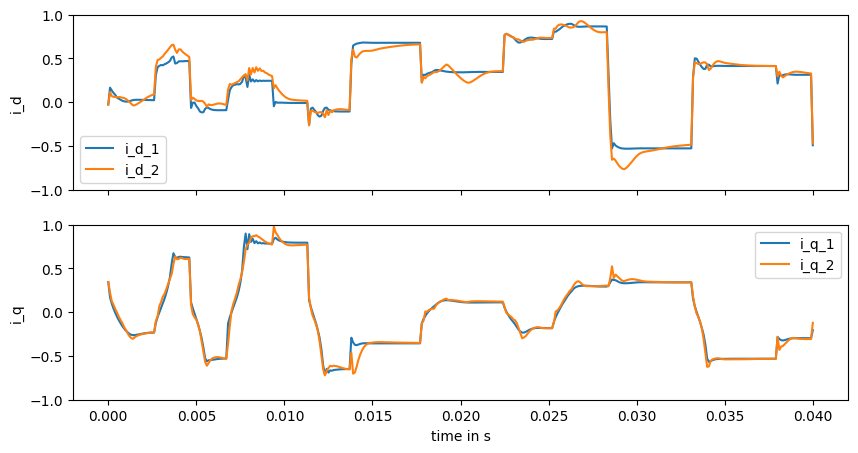

 86%|████████▌ | 86000/100000 [32:10<05:02, 46.21it/s]

Current val_loss: 0.0035923885


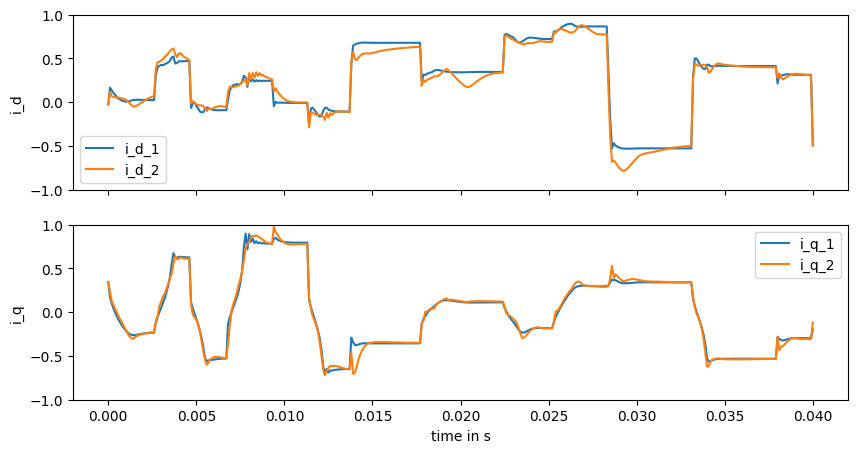

 88%|████████▊ | 88000/100000 [32:54<04:17, 46.59it/s]

Current val_loss: 0.0032397327


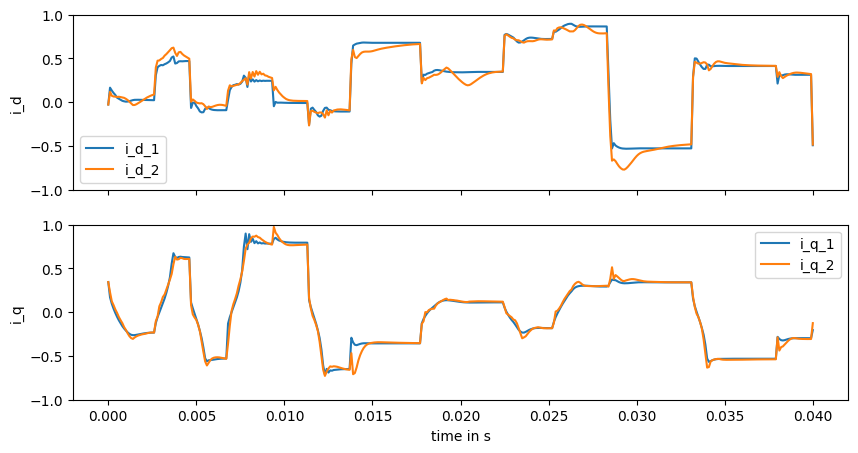

 90%|█████████ | 90000/100000 [33:38<03:35, 46.36it/s]

Current val_loss: 0.0031887277


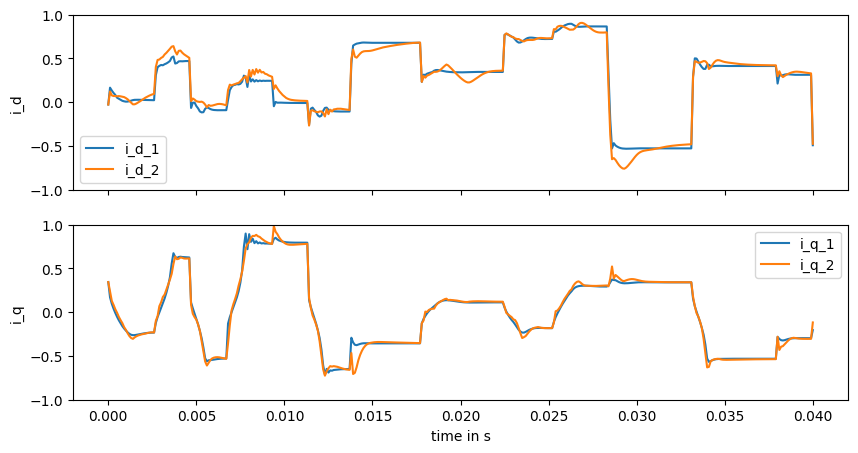

 92%|█████████▏| 92000/100000 [34:22<02:52, 46.25it/s]

Current val_loss: 0.0032638346


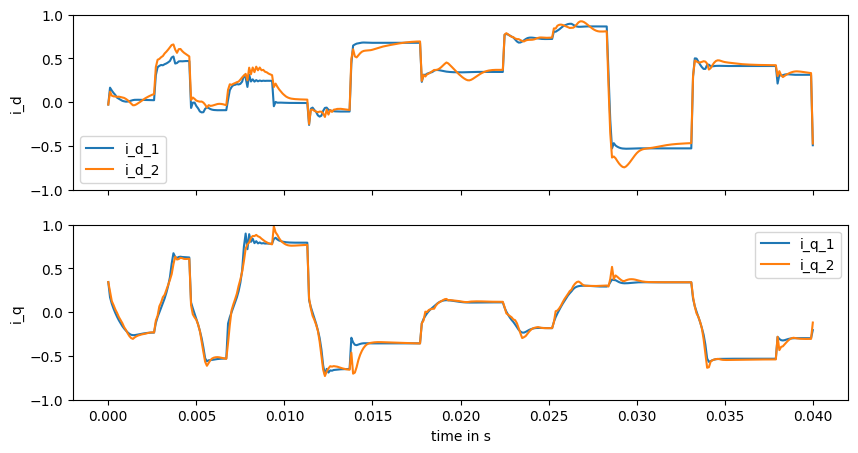

 94%|█████████▍| 94000/100000 [35:05<02:09, 46.16it/s]

Current val_loss: 0.0030639959


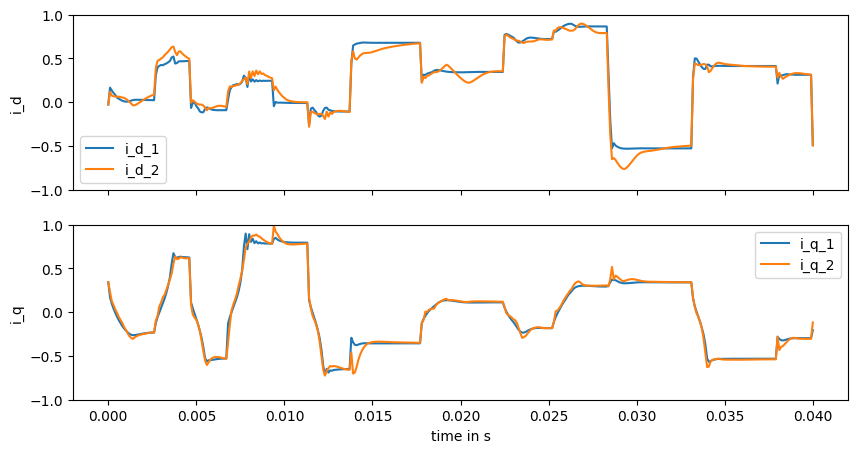

 96%|█████████▌| 96000/100000 [35:49<01:25, 46.54it/s]

Current val_loss: 0.0030188921


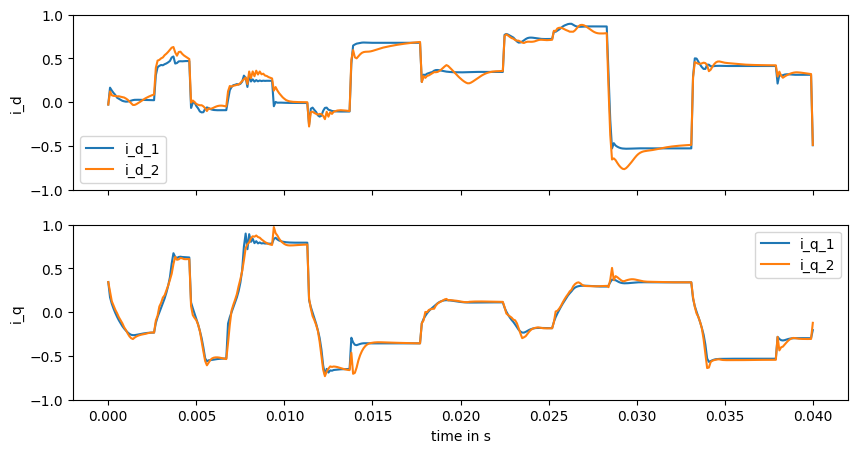

 98%|█████████▊| 98000/100000 [36:33<00:43, 46.35it/s]

Current val_loss: 0.0030090788


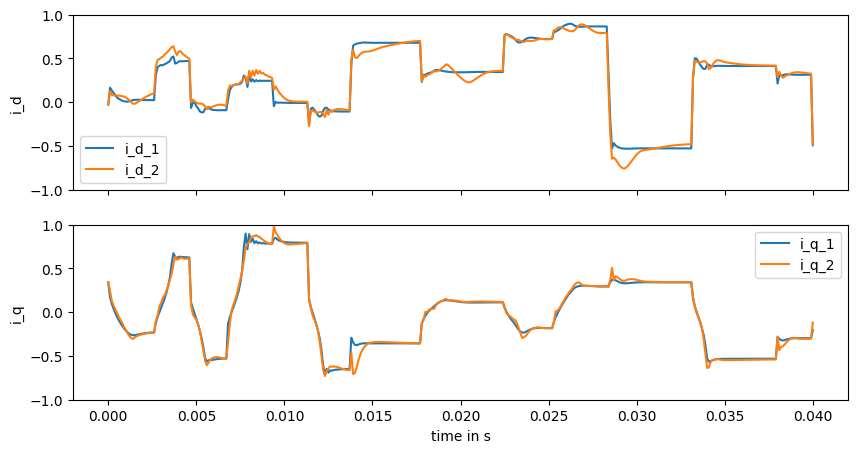

100%|██████████| 100000/100000 [37:16<00:00, 44.71it/s]


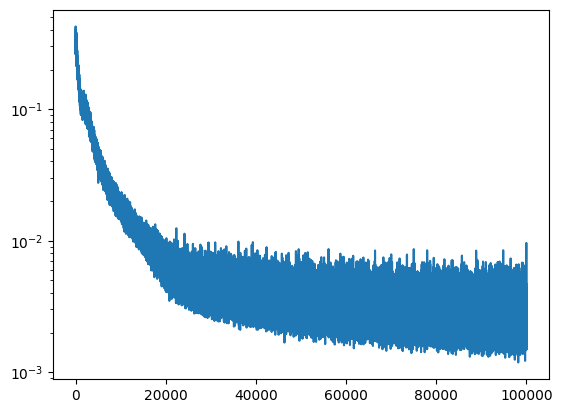

In [44]:
fin_node_100,fin_opt_state,fin_keys,losses, val_losses=mtrainer.fit_non_jit(node,opt_state,keys,plot_every=2000)
plt.plot(losses)
plt.yscale('log')

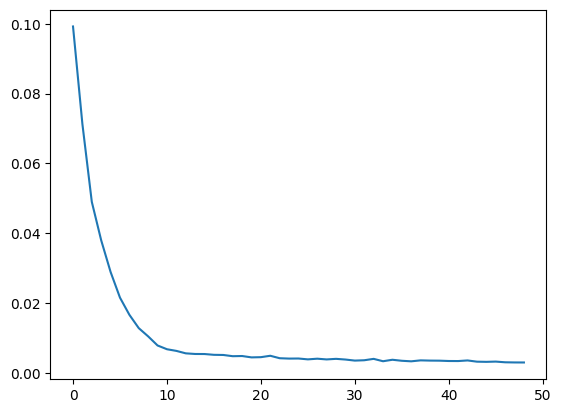

In [46]:
plt.plot(val_losses)

In [ ]:
#eqx.tree_serialise_leaves("trained_models/Model_100k_100len_100b_step0_0001.eqx", fin_node_100)
#model_loaded = eqx.tree_deserialise_leaves("trained_models/Model1.eqx", node)

In [41]:
from utils.evaluation import steps_eval_node

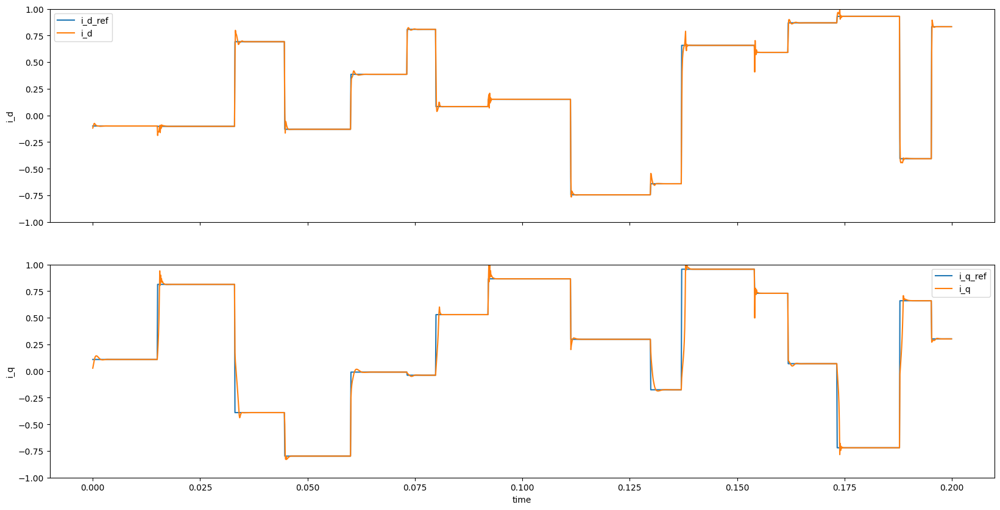

In [42]:
_,_,_=steps_eval_node(motor_env,fin_node_1,motor_env.tau,reset_env,fin_policy2,featurize,featurize_node,jax.random.PRNGKey(4),2000)